# Risk Analytics in Banking and Financial Services

## Problem statement

Suppose you work for a consumer finance company which specializes in lending various types of loans to urban customers. . While processing any loan one may need to think what criteria to follow so that least number of default cases arises.
More default cases means more loss to the bank. Sometimes bank do not have sufficient credit history for many applicants. Because of that, some consumers use it to their advantage by becoming a defaulter. 
The company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default. So that company can utilize this knowledge for its portfolio and risk assessment.

## Importing Important libraries

In [1]:
# Numerical and Data Analysis
import numpy as np
import pandas as pd

# Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Extra
import warnings
warnings.filterwarnings('ignore')

#setting the max display for rows and columns
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

# Data Loading for both files

In [2]:
#loading application_data.csv
df_ApplicationData = pd.read_csv("application_data.csv")

In [3]:
#Viewing first five rows of the dataset.
df_ApplicationData.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [4]:
#loading previous_application.csv
df_PrevApplication=pd.read_csv('previous_application.csv')

In [5]:
#Viewing first five rows of the dataset.
df_PrevApplication.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


## Data Understanding for both dataset

In [6]:
#lets understand the dataset for application_data.csv.
#We can see the application data contains 307511 records and 122 columns.
df_ApplicationData.shape

(307511, 122)

In [7]:
#As application data contains more number of columns so to display all values enabling verbose property.
#There are 65-float,41-integer and 16-object type of columns
df_ApplicationData.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

In [8]:
#Checking important values for numerical data in application dataset.
df_ApplicationData.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

In [9]:
#there are 67 columns with null values.
len(df_ApplicationData.columns[df_ApplicationData.isnull().any()].tolist())

67

In [10]:
#lets understand the dataset for previous_application.csv.
#We can see the application data contains 1670214 records and 37 columns.
df_PrevApplication.shape

(1670214, 37)

In [11]:
#Previous application data contains 15-float,6-integer and 16-object type of columns
df_PrevApplication.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [12]:
#Checking important values for numerical data in previous application dataset.
df_PrevApplication.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,5951.000000,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,0.188357,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,0.087671,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,0.160716,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,0.189122,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,0.193330,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [13]:
#let's get count of the columns having null values.
#there are 16 columns with null values.
len(df_PrevApplication.columns[df_PrevApplication.isnull().any()].tolist())

16

## Data Cleaning for both dataset

In [14]:
#We will prepare the data for analysis
#To prepare for analysis we will remove all kind of irregularies inside data.
#like missing values,outliers/anomalies,incorrect format,inconsistent spelling

### Missing values check for both dataset

In [15]:
#strategies to handle missing values can be removing or imputing them with some values like
#mean,median or mode.

In [16]:
#From below we can infer that there are many columns having missing values more than 40%
#Columns with more than 40% missing values starightaway dropping them.
100 * df_ApplicationData.isnull().sum()/len(df_ApplicationData)

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
OWN_CAR_AGE                     65.990810
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0

In [17]:
#Name of columns having missing values more than or equal to 40%
maxNullColumns=df_ApplicationData.columns[(100 * df_ApplicationData.isnull().sum()/len(df_ApplicationData)) >=40].tolist()

In [18]:
len(maxNullColumns)

49

In [19]:
#Let's drop 49 columns with missing values more than 40%
df_ApplicationData=df_ApplicationData.drop(maxNullColumns,axis=1)

In [20]:
#Now application data has 73 columns earlier it was 122
df_ApplicationData.shape

(307511, 73)

In [21]:
#From below we can infer that there are many columns having missing values more than 40% in previous application data
#Columns with more than 40% missing values starightaway dropping them.
100 * df_PrevApplication.isnull().sum()/len(df_PrevApplication)

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_DOWN_PAYMENT               53.636480
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              53.636480
RATE_INTEREST_PRIMARY          99.643698
RATE_INTEREST_PRIVILEGED       99.643698
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

In [22]:
#Name of columns having missing values more than or equal to 40%
maxNullColumnsForPrev=df_PrevApplication.columns[(100 * df_PrevApplication.isnull().sum()/len(df_PrevApplication)) >=40].tolist()

In [23]:
len(maxNullColumnsForPrev)

11

In [24]:
#Let's drop 11 columns with missing values more than or equal to 40%
df_PrevApplication=df_PrevApplication.drop(maxNullColumnsForPrev,axis=1)

In [25]:
#Now previous application data has 26 columns earlier it was 36
df_PrevApplication.shape

(1670214, 26)

### Data imputation-for application dataset.

In [26]:
#after dropping let's check one by one missing values columns in previous application data
(100 * df_ApplicationData.isnull().sum()/len(df_ApplicationData) ).sort_values(ascending=False)

OCCUPATION_TYPE                31.345545
EXT_SOURCE_3                   19.825307
AMT_REQ_CREDIT_BUREAU_YEAR     13.501631
AMT_REQ_CREDIT_BUREAU_QRT      13.501631
AMT_REQ_CREDIT_BUREAU_MON      13.501631
AMT_REQ_CREDIT_BUREAU_WEEK     13.501631
AMT_REQ_CREDIT_BUREAU_DAY      13.501631
AMT_REQ_CREDIT_BUREAU_HOUR     13.501631
NAME_TYPE_SUITE                 0.420148
OBS_30_CNT_SOCIAL_CIRCLE        0.332021
DEF_30_CNT_SOCIAL_CIRCLE        0.332021
OBS_60_CNT_SOCIAL_CIRCLE        0.332021
DEF_60_CNT_SOCIAL_CIRCLE        0.332021
EXT_SOURCE_2                    0.214626
AMT_GOODS_PRICE                 0.090403
AMT_ANNUITY                     0.003902
CNT_FAM_MEMBERS                 0.000650
DAYS_LAST_PHONE_CHANGE          0.000325
FLAG_DOCUMENT_17                0.000000
FLAG_DOCUMENT_18                0.000000
FLAG_DOCUMENT_21                0.000000
FLAG_DOCUMENT_20                0.000000
FLAG_DOCUMENT_19                0.000000
FLAG_DOCUMENT_2                 0.000000
FLAG_DOCUMENT_3 

In [27]:
#It is of object/string type
df_ApplicationData.OCCUPATION_TYPE.dtype

dtype('O')

In [28]:
#It has different values as shown below
df_ApplicationData.OCCUPATION_TYPE.value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

In [29]:
#Occupation TYpe is always proportional to money,the one who have money can repay the loan
#So we consider it an important variable .
#But missing values are 31% if we put mode value as missing it may change the data distribution so keeping it 'Missing'
df_ApplicationData['OCCUPATION_TYPE'] = df_ApplicationData['OCCUPATION_TYPE'].fillna('Missing')

In [30]:
#Checking whether the Missing value is placed or not
df_ApplicationData.OCCUPATION_TYPE.value_counts()

Missing                  96391
Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

In [31]:
#let's check EXT_SOURCE_3 for imputing values
df_ApplicationData.EXT_SOURCE_3.dtype

dtype('float64')

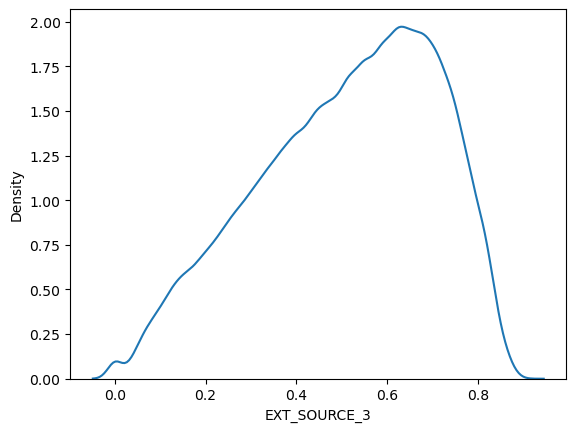

In [32]:
#Check it data distribution normal or not.
#It does not have exactly the normal distribution, so we can go for median for safer side
#Mean and median will have slightly different values
sns.distplot(df_ApplicationData.EXT_SOURCE_3,hist=False)
plt.show()

In [33]:
#Median value
df_ApplicationData['EXT_SOURCE_3'].median()

0.5352762504724826

In [34]:
#mean
df_ApplicationData['EXT_SOURCE_3'].mean()

0.5108529061799658

In [35]:
#Being on safer side imputing median value.
df_ApplicationData['EXT_SOURCE_3']=df_ApplicationData['EXT_SOURCE_3'].fillna(df_ApplicationData['EXT_SOURCE_3'].median())

In [36]:
#checking null value is there or not
df_ApplicationData['EXT_SOURCE_3'].isna().sum()

0

In [37]:
#It is a float type 
df_ApplicationData.AMT_REQ_CREDIT_BUREAU_YEAR.dtype

dtype('float64')

In [38]:
#It is a float type value and discrete
df_ApplicationData.AMT_REQ_CREDIT_BUREAU_YEAR.value_counts()

0.0     71801
1.0     63405
2.0     50192
3.0     33628
4.0     20714
5.0     12052
6.0      6967
7.0      3869
8.0      2127
9.0      1096
11.0       31
12.0       30
10.0       22
13.0       19
14.0       10
17.0        7
15.0        6
19.0        4
18.0        4
16.0        3
25.0        1
23.0        1
22.0        1
21.0        1
20.0        1
Name: AMT_REQ_CREDIT_BUREAU_YEAR, dtype: int64

In [39]:
#It's better to take the median value as it is numeric value.
df_ApplicationData.AMT_REQ_CREDIT_BUREAU_YEAR.median()

1.0

In [40]:
#All columns represent number of enquries made for the customer(which should be discrete and not continous).
# AMT_REQ_CREDIT_BUREAU_YEAR, AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_WEEK,
# AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_HOUR
# Imputing median value 
df_ApplicationData['AMT_REQ_CREDIT_BUREAU_YEAR']=df_ApplicationData['AMT_REQ_CREDIT_BUREAU_YEAR'].fillna(df_ApplicationData['AMT_REQ_CREDIT_BUREAU_YEAR'].median())
df_ApplicationData['AMT_REQ_CREDIT_BUREAU_QRT']=df_ApplicationData['AMT_REQ_CREDIT_BUREAU_QRT'].fillna(df_ApplicationData['AMT_REQ_CREDIT_BUREAU_QRT'].median())
df_ApplicationData['AMT_REQ_CREDIT_BUREAU_MON']=df_ApplicationData['AMT_REQ_CREDIT_BUREAU_MON'].fillna(df_ApplicationData['AMT_REQ_CREDIT_BUREAU_MON'].median())
df_ApplicationData['AMT_REQ_CREDIT_BUREAU_WEEK']=df_ApplicationData['AMT_REQ_CREDIT_BUREAU_WEEK'].fillna(df_ApplicationData['AMT_REQ_CREDIT_BUREAU_WEEK'].median())
df_ApplicationData['AMT_REQ_CREDIT_BUREAU_DAY']=df_ApplicationData['AMT_REQ_CREDIT_BUREAU_DAY'].fillna(df_ApplicationData['AMT_REQ_CREDIT_BUREAU_DAY'].median()) 
df_ApplicationData['AMT_REQ_CREDIT_BUREAU_HOUR']=df_ApplicationData['AMT_REQ_CREDIT_BUREAU_HOUR'].fillna(df_ApplicationData['AMT_REQ_CREDIT_BUREAU_HOUR'].median())    
    

In [41]:
#Let's see how much % of null values still pending with us.
(100 * df_ApplicationData.isnull().sum()/len(df_ApplicationData) ).sort_values(ascending=False)

NAME_TYPE_SUITE                0.420148
DEF_60_CNT_SOCIAL_CIRCLE       0.332021
OBS_30_CNT_SOCIAL_CIRCLE       0.332021
DEF_30_CNT_SOCIAL_CIRCLE       0.332021
OBS_60_CNT_SOCIAL_CIRCLE       0.332021
EXT_SOURCE_2                   0.214626
AMT_GOODS_PRICE                0.090403
AMT_ANNUITY                    0.003902
CNT_FAM_MEMBERS                0.000650
DAYS_LAST_PHONE_CHANGE         0.000325
FLAG_DOCUMENT_2                0.000000
FLAG_DOCUMENT_10               0.000000
EXT_SOURCE_3                   0.000000
FLAG_DOCUMENT_3                0.000000
FLAG_DOCUMENT_4                0.000000
FLAG_DOCUMENT_5                0.000000
FLAG_DOCUMENT_6                0.000000
FLAG_DOCUMENT_7                0.000000
FLAG_DOCUMENT_8                0.000000
FLAG_DOCUMENT_9                0.000000
SK_ID_CURR                     0.000000
FLAG_DOCUMENT_11               0.000000
FLAG_DOCUMENT_20               0.000000
AMT_REQ_CREDIT_BUREAU_QRT      0.000000
AMT_REQ_CREDIT_BUREAU_MON      0.000000


In [42]:
#It is string type or a categorical data
df_ApplicationData.NAME_TYPE_SUITE.dtype

dtype('O')

In [43]:
#For categorical data we can impute mode value
df_ApplicationData.NAME_TYPE_SUITE.value_counts()
#df_ApplicationData.NAME_TYPE_SUITE.mode()[0]

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

In [44]:
df_ApplicationData['NAME_TYPE_SUITE']=df_ApplicationData['NAME_TYPE_SUITE'].fillna(df_ApplicationData['NAME_TYPE_SUITE'].mode()[0])

In [45]:
df_ApplicationData.NAME_TYPE_SUITE.isna().sum()

0

In [46]:
#It is of float datatype
df_ApplicationData.DEF_60_CNT_SOCIAL_CIRCLE.dtype

dtype('float64')

In [47]:
# Median is the safe value to impute.
df_ApplicationData.DEF_60_CNT_SOCIAL_CIRCLE.value_counts()

0.0     280721
1.0      21841
2.0       3170
3.0        598
4.0        135
5.0         20
6.0          3
7.0          1
24.0         1
Name: DEF_60_CNT_SOCIAL_CIRCLE, dtype: int64

In [48]:
#DEF_60_CNT_SOCIAL_CIRCLE ,OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE 
#imputing median value for all above four parameters as they are float in nature median value is safer than imputing mean value.
df_ApplicationData['DEF_60_CNT_SOCIAL_CIRCLE']=df_ApplicationData['DEF_60_CNT_SOCIAL_CIRCLE'].fillna(df_ApplicationData['DEF_60_CNT_SOCIAL_CIRCLE'].median())
df_ApplicationData['OBS_30_CNT_SOCIAL_CIRCLE']=df_ApplicationData['OBS_30_CNT_SOCIAL_CIRCLE'].fillna(df_ApplicationData['OBS_30_CNT_SOCIAL_CIRCLE'].median())
df_ApplicationData['DEF_30_CNT_SOCIAL_CIRCLE']=df_ApplicationData['DEF_30_CNT_SOCIAL_CIRCLE'].fillna(df_ApplicationData['DEF_30_CNT_SOCIAL_CIRCLE'].median())
df_ApplicationData['OBS_60_CNT_SOCIAL_CIRCLE']=df_ApplicationData['OBS_60_CNT_SOCIAL_CIRCLE'].fillna(df_ApplicationData['OBS_60_CNT_SOCIAL_CIRCLE'].median())


In [49]:
#Checking rest all five columns datatype i.e EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE.
print(df_ApplicationData.EXT_SOURCE_2.dtype)
print(df_ApplicationData.AMT_GOODS_PRICE.dtype)
print(df_ApplicationData.AMT_ANNUITY.dtype)
print(df_ApplicationData.CNT_FAM_MEMBERS.dtype)
print(df_ApplicationData.DAYS_LAST_PHONE_CHANGE.dtype)

float64
float64
float64
float64
float64


In [50]:
#As the null % is below 1 we can impute the mean or median but we'll go for median value so that data will not variate much.
df_ApplicationData['EXT_SOURCE_2']=df_ApplicationData['EXT_SOURCE_2'].fillna(df_ApplicationData['EXT_SOURCE_2'].median())
df_ApplicationData['AMT_GOODS_PRICE']=df_ApplicationData['AMT_GOODS_PRICE'].fillna(df_ApplicationData['AMT_GOODS_PRICE'].median())
df_ApplicationData['AMT_ANNUITY']=df_ApplicationData['AMT_ANNUITY'].fillna(df_ApplicationData['AMT_ANNUITY'].median())
df_ApplicationData['CNT_FAM_MEMBERS']=df_ApplicationData['CNT_FAM_MEMBERS'].fillna(df_ApplicationData['CNT_FAM_MEMBERS'].median())
df_ApplicationData['DAYS_LAST_PHONE_CHANGE']=df_ApplicationData['DAYS_LAST_PHONE_CHANGE'].fillna(df_ApplicationData['DAYS_LAST_PHONE_CHANGE'].median())


In [51]:
#let's check the null % in each column.
#So for all columns we have treated the null values.
(100 * df_ApplicationData.isnull().sum()/len(df_ApplicationData) ).sort_values(ascending=False)

SK_ID_CURR                     0.0
REG_CITY_NOT_WORK_CITY         0.0
FLAG_DOCUMENT_8                0.0
FLAG_DOCUMENT_7                0.0
FLAG_DOCUMENT_6                0.0
FLAG_DOCUMENT_5                0.0
FLAG_DOCUMENT_4                0.0
FLAG_DOCUMENT_3                0.0
FLAG_DOCUMENT_2                0.0
DAYS_LAST_PHONE_CHANGE         0.0
DEF_60_CNT_SOCIAL_CIRCLE       0.0
OBS_60_CNT_SOCIAL_CIRCLE       0.0
DEF_30_CNT_SOCIAL_CIRCLE       0.0
OBS_30_CNT_SOCIAL_CIRCLE       0.0
EXT_SOURCE_3                   0.0
EXT_SOURCE_2                   0.0
ORGANIZATION_TYPE              0.0
FLAG_DOCUMENT_9                0.0
FLAG_DOCUMENT_10               0.0
FLAG_DOCUMENT_11               0.0
FLAG_DOCUMENT_20               0.0
AMT_REQ_CREDIT_BUREAU_QRT      0.0
AMT_REQ_CREDIT_BUREAU_MON      0.0
AMT_REQ_CREDIT_BUREAU_WEEK     0.0
AMT_REQ_CREDIT_BUREAU_DAY      0.0
AMT_REQ_CREDIT_BUREAU_HOUR     0.0
FLAG_DOCUMENT_21               0.0
FLAG_DOCUMENT_19               0.0
FLAG_DOCUMENT_12    

### Data imputation-for previous application data.

In [52]:
# let's check one by one missing values columns in previous application data and impute the values.
(100 * df_PrevApplication.isnull().sum()/len(df_PrevApplication) ).sort_values(ascending=False)

AMT_GOODS_PRICE                23.081773
AMT_ANNUITY                    22.286665
CNT_PAYMENT                    22.286366
PRODUCT_COMBINATION             0.020716
AMT_CREDIT                      0.000060
CODE_REJECT_REASON              0.000000
NAME_YIELD_GROUP                0.000000
NAME_SELLER_INDUSTRY            0.000000
SELLERPLACE_AREA                0.000000
CHANNEL_TYPE                    0.000000
NAME_PRODUCT_TYPE               0.000000
NAME_PORTFOLIO                  0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_CLIENT_TYPE                0.000000
SK_ID_PREV                      0.000000
NAME_PAYMENT_TYPE               0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_STATUS            0.000000
NAME_CASH_LOAN_PURPOSE          0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
HOUR_APPR_PROCESS_START         0.000000
WEEKDAY_APPR_PROCESS_START      0.000000
AMT_APPLICATION                 0.000000
NAME_CONTRACT_TY

In [53]:
#let's check datatype for AMT_GOODS_PRICE,AMT_ANNUITY,CNT_PAYMENT,PRODUCT_COMBINATION
print(df_PrevApplication.AMT_GOODS_PRICE.dtype)
print(df_PrevApplication.AMT_ANNUITY.dtype)
print(df_PrevApplication.CNT_PAYMENT.dtype)
print(df_PrevApplication.PRODUCT_COMBINATION.dtype)

float64
float64
float64
object


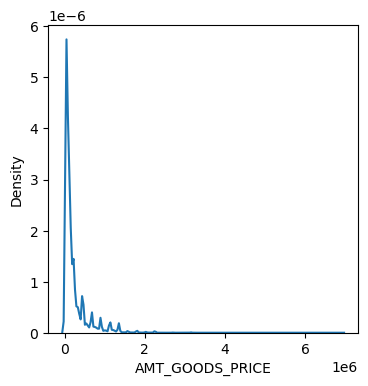

In [54]:
#AMT_GOODS_PRICE has more than 23% of missing values so it is better to check its distribution curve and then decide the 
#imputation value.
plt.figure(figsize=(4,4))
sns.distplot(df_PrevApplication.AMT_GOODS_PRICE,hist=False)
plt.show()

In [55]:
#If we see the above graph data distribution is not normal,it's left skewed.
#In such scenarios we impute median value.
df_PrevApplication['AMT_GOODS_PRICE']=df_PrevApplication['AMT_GOODS_PRICE'].fillna(df_PrevApplication['AMT_GOODS_PRICE'].median())


In [56]:
df_PrevApplication['AMT_GOODS_PRICE'].isna().sum()

0

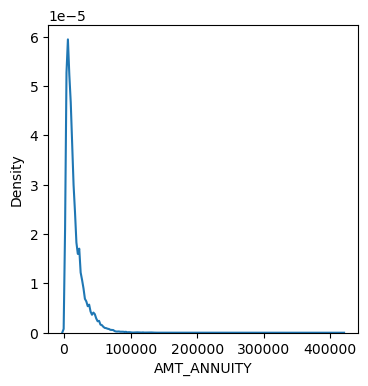

In [57]:
#let's check for AMT_ANNUITY column
plt.figure(figsize=(4,4))
sns.distplot(df_PrevApplication.AMT_ANNUITY,hist=False)
plt.show()

In [58]:
#From above graph we can infer that AMT_GOODS_PRICE,AMT_ANNUITY has same graph.
# So again going for the Median value as data distribution is not normal,it is left skewed.
df_PrevApplication['AMT_ANNUITY']=df_PrevApplication['AMT_ANNUITY'].fillna(df_PrevApplication['AMT_ANNUITY'].median())

In [59]:
#checking whether the value is imputed or not.
df_PrevApplication['AMT_ANNUITY'].isnull().sum()

0

In [60]:
#let's check for CNT_PAYMENT column
df_PrevApplication.CNT_PAYMENT.value_counts()

12.0    323049
6.0     190461
0.0     144985
10.0    141851
24.0    137764
18.0     77430
36.0     72583
60.0     53600
48.0     47316
8.0      30349
4.0      26924
30.0     16924
14.0      8253
42.0      7136
16.0      5710
5.0       3957
54.0      2104
20.0      1805
7.0       1434
9.0       1236
3.0       1100
15.0       904
11.0       669
72.0       139
13.0        51
17.0        48
84.0        45
22.0        37
23.0        27
26.0        13
35.0        11
66.0        10
28.0         8
29.0         8
32.0         6
19.0         6
34.0         4
59.0         4
41.0         3
47.0         3
45.0         3
21.0         3
44.0         2
39.0         2
46.0         2
38.0         2
33.0         1
40.0         1
53.0         1
Name: CNT_PAYMENT, dtype: int64

In [61]:
#checking records for CNT_PAYMENT null value.
df_PrevApplication[df_PrevApplication.CNT_PAYMENT.isnull()]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
6,2315218,175704,Cash loans,11250.0,0.0,0.0,112320.0,TUESDAY,11,Y,1,XNA,Canceled,-14,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
7,1656711,296299,Cash loans,11250.0,0.0,0.0,112320.0,MONDAY,7,Y,1,XNA,Canceled,-21,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
8,2367563,342292,Cash loans,11250.0,0.0,0.0,112320.0,MONDAY,15,Y,1,XNA,Canceled,-386,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
9,2579447,334349,Cash loans,11250.0,0.0,0.0,112320.0,SATURDAY,15,Y,1,XNA,Canceled,-57,XNA,XAP,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
22,1172842,302212,Cash loans,11250.0,0.0,0.0,112320.0,TUESDAY,9,Y,1,XNA,Refused,-239,XNA,HC,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670187,1971628,435554,Cash loans,11250.0,0.0,0.0,112320.0,MONDAY,10,Y,1,XNA,Canceled,-134,XNA,XAP,Repeater,XNA,XNA,XNA,Contact center,-1,XNA,NaN,XNA,Cash
1670190,2381880,175920,Cash loans,11250.0,0.0,0.0,112320.0,FRIDAY,11,Y,1,XNA,Canceled,-243,XNA,XAP,Repeater,XNA,XNA,XNA,Contact center,-1,XNA,NaN,XNA,Cash
1670193,1120445,179433,Revolving loans,11250.0,0.0,0.0,112320.0,SUNDAY,13,Y,1,XAP,Refused,-365,XNA,HC,Refreshed,XNA,XNA,XNA,AP+ (Cash loan),10,XNA,NaN,XNA,Card Street
1670196,1662123,398290,Consumer loans,11250.0,57910.5,57910.5,57910.5,SATURDAY,9,Y,1,XAP,Unused offer,-289,Cash through the bank,CLIENT,Repeater,Mobile,XNA,XNA,Country-wide,96,Connectivity,NaN,XNA,POS mobile with interest


In [62]:
#let's see the record with CNT_PAYMENT null, whether the previous loan status was approved,refused or approved.
#Below we can see most of the values indicate rejected/cancelled. Then these scenarios term credit value can be assumed as 0.
#0 value should not impact the data. It is in a way value is not known.
df_PrevApplication.NAME_CONTRACT_STATUS[df_PrevApplication.CNT_PAYMENT.isnull()].value_counts()

Canceled        305805
Refused          40897
Unused offer     25524
Approved             4
Name: NAME_CONTRACT_STATUS, dtype: int64

In [63]:
#imputing 0 for missing value.
df_PrevApplication['CNT_PAYMENT']=df_PrevApplication['CNT_PAYMENT'].fillna(0.0)

In [64]:
#checking whether the values are imputed or not
df_PrevApplication['CNT_PAYMENT'].isnull().sum()

0

In [65]:
#Most of the PRODUCT_COMBINATION has cash value 
# as missing value is less than 1% we can ignore or go with mode value
df_PrevApplication.PRODUCT_COMBINATION.mode()

0    Cash
Name: PRODUCT_COMBINATION, dtype: object

In [66]:
#Imputing mode value(cash)
df_PrevApplication['PRODUCT_COMBINATION']=df_PrevApplication['PRODUCT_COMBINATION'].fillna(df_PrevApplication['PRODUCT_COMBINATION'].mode()[0])


In [67]:
#Checking any other missing value still there
#still there are very few missing values in AMT_CREDIT, we can ignore it.
(100 * df_PrevApplication.isnull().sum()/len(df_PrevApplication) ).sort_values(ascending=False)

AMT_CREDIT                     0.00006
SK_ID_PREV                     0.00000
NAME_PAYMENT_TYPE              0.00000
NAME_YIELD_GROUP               0.00000
CNT_PAYMENT                    0.00000
NAME_SELLER_INDUSTRY           0.00000
SELLERPLACE_AREA               0.00000
CHANNEL_TYPE                   0.00000
NAME_PRODUCT_TYPE              0.00000
NAME_PORTFOLIO                 0.00000
NAME_GOODS_CATEGORY            0.00000
NAME_CLIENT_TYPE               0.00000
CODE_REJECT_REASON             0.00000
DAYS_DECISION                  0.00000
SK_ID_CURR                     0.00000
NAME_CONTRACT_STATUS           0.00000
NAME_CASH_LOAN_PURPOSE         0.00000
NFLAG_LAST_APPL_IN_DAY         0.00000
FLAG_LAST_APPL_PER_CONTRACT    0.00000
HOUR_APPR_PROCESS_START        0.00000
WEEKDAY_APPR_PROCESS_START     0.00000
AMT_GOODS_PRICE                0.00000
AMT_APPLICATION                0.00000
AMT_ANNUITY                    0.00000
NAME_CONTRACT_TYPE             0.00000
PRODUCT_COMBINATION      

### Outliers/Anomalies in application data

In [68]:
# In section univariate analysis for application data under numerical variable ,outliers are discussed.

### Outliers/Anomalies in previous application data

In [69]:
# In section univariate analysis for previous application data under numerical variable ,outliers are discussed.

### Standardize Values in application data

In [70]:
#let's make list for each variable type so that the plotting of graph will be easier for us during analysis.
df_ApplicationData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 73 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307511 non-null  float64
 10  AMT_GOODS_PRICE              307511 non-null  float64
 11  NAME_TYPE_SUITE              307511 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

In [71]:
#analysing focussed(less) data is always yields quality than quantity.
#With this thought let's remove some columns which does not appear to be important.
df_ApplicationData.columns[df_ApplicationData.dtypes=='object'].tolist()

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE']

In [72]:
#On whatever day client apply for the loan it doesn't relate to the payment difficulty.drop-WEEKDAY_APPR_PROCESS_START'
df_ApplicationData.drop(['WEEKDAY_APPR_PROCESS_START'],axis=1,inplace=True)

In [73]:
#check and assign to a list obj_cols_appdata.
obj_cols_appdata=[]
obj_cols_appdata=df_ApplicationData.columns[df_ApplicationData.dtypes=='object'].tolist()
print(obj_cols_appdata)

['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE']


In [74]:
#we can see negative values for days let's change all values to positive values. -ve means in back days.
df_ApplicationData['DAYS_BIRTH'] = df_ApplicationData['DAYS_BIRTH'].apply(lambda x: abs(x))
df_ApplicationData['DAYS_EMPLOYED'] = df_ApplicationData['DAYS_EMPLOYED'].apply(lambda x: abs(x))
df_ApplicationData['DAYS_REGISTRATION'] = df_ApplicationData['DAYS_REGISTRATION'].apply(lambda x: abs(x))
df_ApplicationData['DAYS_ID_PUBLISH'] = df_ApplicationData['DAYS_ID_PUBLISH'].apply(lambda x: abs(x))
df_ApplicationData['DAYS_LAST_PHONE_CHANGE'] = df_ApplicationData['DAYS_LAST_PHONE_CHANGE'].apply(lambda x: abs(x))

In [75]:
df_ApplicationData.columns[list( map(lambda x: x.startswith('DAYS'), df_ApplicationData.columns))]

Index(['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'DAYS_LAST_PHONE_CHANGE'],
      dtype='object')

In [76]:
#check and assign to a list float_cols_appdata.
float_cols_appdata=[]
float_cols_appdata=df_ApplicationData.columns[df_ApplicationData.dtypes=='float64'].tolist()
print(float_cols_appdata)

['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']


In [77]:
#lets work on AMT_INCOME_TOTAL as it is not well observed in histplot lets see boxplot.
df_ApplicationData.AMT_INCOME_TOTAL.value_counts()
#df_ApplicationData.AMT_INCOME_TOTAL.min()
#df_ApplicationData.AMT_INCOME_TOTAL.max()---range is from 25k to 11cr

135000.0    35750
112500.0    31019
157500.0    26556
180000.0    24719
90000.0     22483
            ...  
117324.0        1
64584.0         1
142897.5        1
109170.0        1
113062.5        1
Name: AMT_INCOME_TOTAL, Length: 2548, dtype: int64

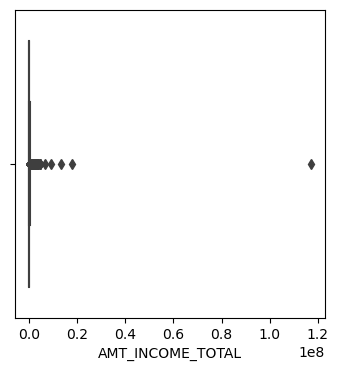

In [78]:
#let's check boxplot, there are outliers in total income of applicant.
#To view it better lets bin it.
plt.figure(figsize=(4,4))
sns.boxplot(x=df_ApplicationData['AMT_INCOME_TOTAL'])
plt.show()

In [79]:
#creating new column TOTAL_INCOME and now we can observe the trend closely.
df_ApplicationData['TOTAL_INCOME']= pd.qcut(df_ApplicationData['AMT_INCOME_TOTAL'],q=[0,0.1,0.3,0.6,0.8,1],labels=['VeryLow','Low','Medium','High','VeryHigh'])
df_ApplicationData['TOTAL_INCOME'].value_counts(normalize=True)

Medium      0.274143
High        0.245562
Low         0.218486
VeryHigh    0.153224
VeryLow     0.108585
Name: TOTAL_INCOME, dtype: float64

In [80]:
df_ApplicationData['TOTAL_INCOME'].dtype

CategoricalDtype(categories=['VeryLow', 'Low', 'Medium', 'High', 'VeryHigh'], ordered=True)

In [81]:
#dropping old AMT_INCOME_TOTAL
df_ApplicationData.drop(['AMT_INCOME_TOTAL'],axis=1,inplace=True)

In [82]:
#Already plotted histplot during univariate analysis and found not relevant data in OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,'EXT_SOURCE_3'
# so dropping them.
df_ApplicationData.drop(['OBS_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','EXT_SOURCE_3'],axis=1,inplace=True)

In [83]:
#check the drop of column
df_ApplicationData.columns[df_ApplicationData.dtypes=='float64'].tolist()

['AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_2',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

In [84]:
#check and assign to a list int_cols_appdata.
int_cols_appdata=[]
int_cols_appdata=df_ApplicationData.columns[(df_ApplicationData.dtypes=='int64') | (df_ApplicationData.dtypes=='int32')].tolist()
print(int_cols_appdata)

['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21']


In [85]:
#let's minimise few data for proper analysis
#removing all flag_document data as it is not specifying the document type.
#removing the flag related to phn,home phn and email as they are not reliable source to understand payment difficulty.
for i in int_cols_appdata:
    if i.startswith('FLAG'):
        df_ApplicationData.drop(i,axis=1,inplace=True)

In [86]:
#Checking total columns starting with FLAG_DOCUMENT
df_ApplicationData.columns[list( map(lambda x: x.startswith('FLAG'), df_ApplicationData.columns))]

Index(['FLAG_OWN_CAR', 'FLAG_OWN_REALTY'], dtype='object')

In [87]:
df_ApplicationData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 43 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   SK_ID_CURR                   307511 non-null  int64   
 1   TARGET                       307511 non-null  int64   
 2   NAME_CONTRACT_TYPE           307511 non-null  object  
 3   CODE_GENDER                  307511 non-null  object  
 4   FLAG_OWN_CAR                 307511 non-null  object  
 5   FLAG_OWN_REALTY              307511 non-null  object  
 6   CNT_CHILDREN                 307511 non-null  int64   
 7   AMT_CREDIT                   307511 non-null  float64 
 8   AMT_ANNUITY                  307511 non-null  float64 
 9   AMT_GOODS_PRICE              307511 non-null  float64 
 10  NAME_TYPE_SUITE              307511 non-null  object  
 11  NAME_INCOME_TYPE             307511 non-null  object  
 12  NAME_EDUCATION_TYPE          307511 non-null

### Standardize Values in previous application data

In [88]:
df_PrevApplication.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 26 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1670214 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_GOODS_PRICE              1670214 non-null  float64
 7   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 8   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 9   FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 10  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 11  NAME_CASH_LOAN_PURPOSE       1670214 non-null  object 
 12  NAME_CONTRACT_STATUS         1670214 non-n

In [89]:
#analysing focussed(less) data is always yields quality than quantity.
#With this thought let's remove some columns which does not appear to be important.
df_PrevApplication.columns[df_PrevApplication.dtypes=='object'].tolist()

['NAME_CONTRACT_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'NAME_SELLER_INDUSTRY',
 'NAME_YIELD_GROUP',
 'PRODUCT_COMBINATION']

In [90]:
#On whatever day client apply for the loan it doesn't relate to the payment difficulty.drop-WEEKDAY_APPR_PROCESS_START'
df_PrevApplication.drop(['WEEKDAY_APPR_PROCESS_START'],axis=1,inplace=True)

In [91]:
#check and assign to a list obj_cols_preAppdata.
obj_cols_preAppdata=df_PrevApplication.columns[df_PrevApplication.dtypes=='object'].tolist()
print(obj_cols_preAppdata)

['NAME_CONTRACT_TYPE', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']


In [92]:
#check and assign to a list float_cols_preAppdata.
float_cols_preAppdata=[]
float_cols_preAppdata=df_PrevApplication.columns[df_PrevApplication.dtypes=='float64'].tolist()
print(float_cols_preAppdata)

['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'CNT_PAYMENT']


In [93]:
#changing DAYS_DECISION to positive value
df_PrevApplication['DAYS_DECISION'] = df_PrevApplication['DAYS_DECISION'].apply(lambda x: abs(x))

In [94]:
#checking the values
df_PrevApplication['DAYS_DECISION'].value_counts()

245     2444
238     2390
210     2375
273     2350
196     2315
        ... 
2882     163
2922     162
2921     158
2902     148
1          2
Name: DAYS_DECISION, Length: 2922, dtype: int64

In [95]:
#SELLERPLACE_AREA has lot of values as -1 seems to be missing
df_PrevApplication.SELLERPLACE_AREA.value_counts()

-1       762675
 0        60523
 50       37401
 30       34423
 20       33840
          ...  
 1014         1
 1256         1
 677          1
 7518         1
 1446         1
Name: SELLERPLACE_AREA, Length: 2097, dtype: int64

In [96]:
#Drop column SELLERPLACE_AREA
df_PrevApplication.drop(['SELLERPLACE_AREA'],axis=1,inplace=True)

In [97]:
#check and assign to a list int_cols_preAppdata.
int_cols_preAppdata=[]
int_cols_preAppdata=df_PrevApplication.columns[(df_PrevApplication.dtypes=='int64') | (df_PrevApplication.dtypes=='int32')].tolist()
print(int_cols_preAppdata)

['SK_ID_PREV', 'SK_ID_CURR', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'DAYS_DECISION']


## Univariate Analysis for application data

### Categorical Variables

### Data Imbalace for Target varable mentioned in the problem statement.

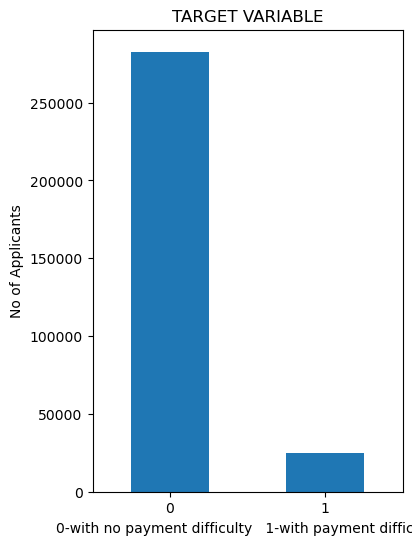

In [98]:
# let's check Target variable to understand the data imbalance.
plt.figure(figsize=(4,6))
df_ApplicationData.TARGET.value_counts().plot.bar()
plt.title("TARGET VARIABLE")
plt.xlabel("0-with no payment difficulty   1-with payment difficulty")
plt.xticks(rotation=0)
plt.ylabel("No of Applicants")
plt.show()

In [99]:
#First we must understands that what is data imbalance. If the two values have high diference value it is imbalanced data.
#Many applicants(282686) have no payment difficulty while few applicants(24825) have payment difficulty.
df_ApplicationData.TARGET.value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

In [100]:
#In simple words almost 92% of applicant have no payment difficulty
df_ApplicationData.TARGET.value_counts(normalize=True)*100

0    91.927118
1     8.072882
Name: TARGET, dtype: float64

0    91.927118
1     8.072882
Name: TARGET, dtype: float64


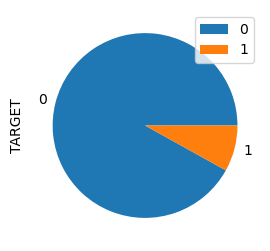

In [101]:
#lets draw pie chart
print(df_ApplicationData.TARGET.value_counts(normalize=True)*100)
plt.figure(figsize=(3,3) )
df_ApplicationData.TARGET.value_counts(normalize=True).plot.pie()
plt.legend()
plt.show()

### Insight
Data Imbalace for Target variable mentioned in Problem statement:  8% of applicants have payment difficulty. Banks will have less defaulter then only banks can survive. Imbalance is expected.



In [102]:
#lets refresh all list in application data.
#check and re-assign to a list float_cols_appdata.
obj_cols_appdata=[]
obj_cols_appdata=df_ApplicationData.columns[(df_ApplicationData.dtypes=='object') | (df_ApplicationData.dtypes=='category')].tolist()
print(obj_cols_appdata)


['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'TOTAL_INCOME']


In [103]:
#check and re-assign to a list float_cols_appdata.
float_cols_appdata=[]
float_cols_appdata=df_ApplicationData.columns[df_ApplicationData.dtypes=='float64'].tolist()
print(float_cols_appdata)

['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_2', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']


In [104]:
#check and re-assign to a list int_cols_appdata.
int_cols_appdata=[]
int_cols_appdata=df_ApplicationData.columns[(df_ApplicationData.dtypes=='int64') | (df_ApplicationData.dtypes=='int32')].tolist()
print(int_cols_appdata)

['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY']


In [105]:
#see the percentage wise distribution of categories in each columns of object datatype.
# we already made a list of variable of object type.
for i in obj_cols_appdata:
    print(df_ApplicationData[i].value_counts(normalize=True)*100)
    print('=======================================')


Cash loans         90.478715
Revolving loans     9.521285
Name: NAME_CONTRACT_TYPE, dtype: float64
F      65.834393
M      34.164306
XNA     0.001301
Name: CODE_GENDER, dtype: float64
N    65.989184
Y    34.010816
Name: FLAG_OWN_CAR, dtype: float64
Y    69.367275
N    30.632725
Name: FLAG_OWN_REALTY, dtype: float64
Unaccompanied      81.238720
Family             13.056118
Spouse, partner     3.697429
Children            1.062401
Other_B             0.575589
Other_A             0.281616
Group of people     0.088127
Name: NAME_TYPE_SUITE, dtype: float64
Working                 51.631974
Commercial associate    23.289248
Pensioner               18.003258
State servant            7.057634
Unemployed               0.007154
Student                  0.005853
Businessman              0.003252
Maternity leave          0.001626
Name: NAME_INCOME_TYPE, dtype: float64
Secondary / secondary special    71.018923
Higher education                 24.344820
Incomplete higher                 3.341994
Lo

Countplot of NAME_CONTRACT_TYPE


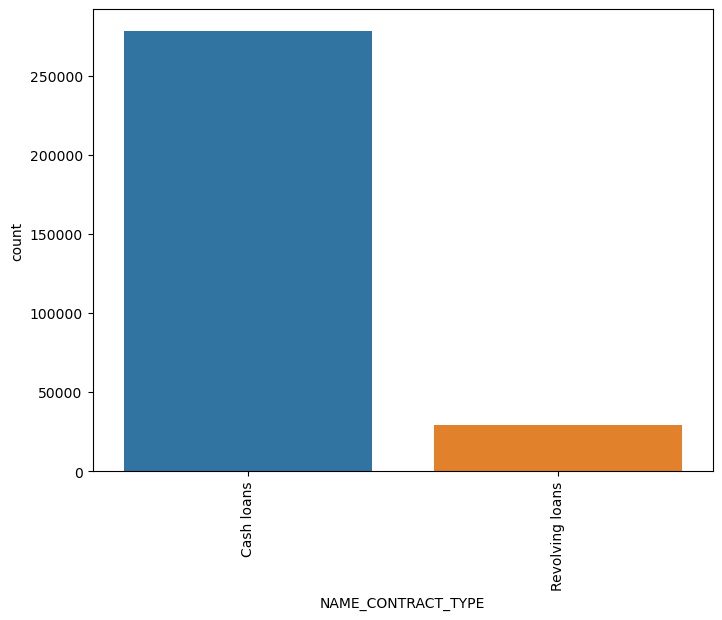

Countplot of CODE_GENDER


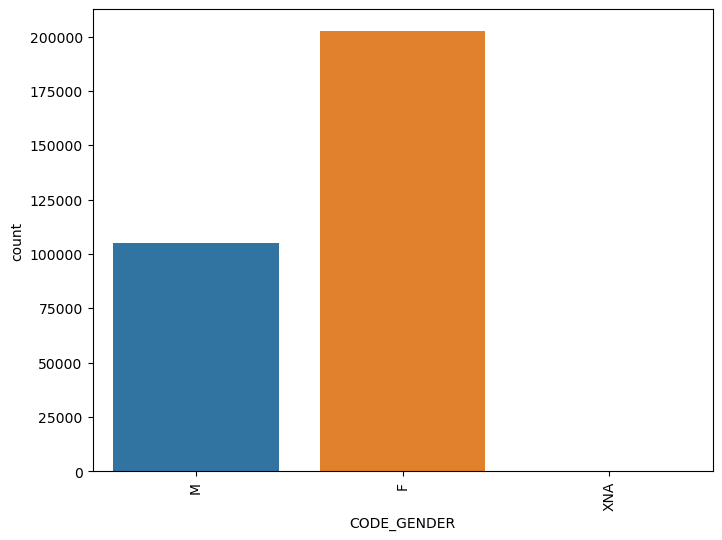

Countplot of FLAG_OWN_CAR


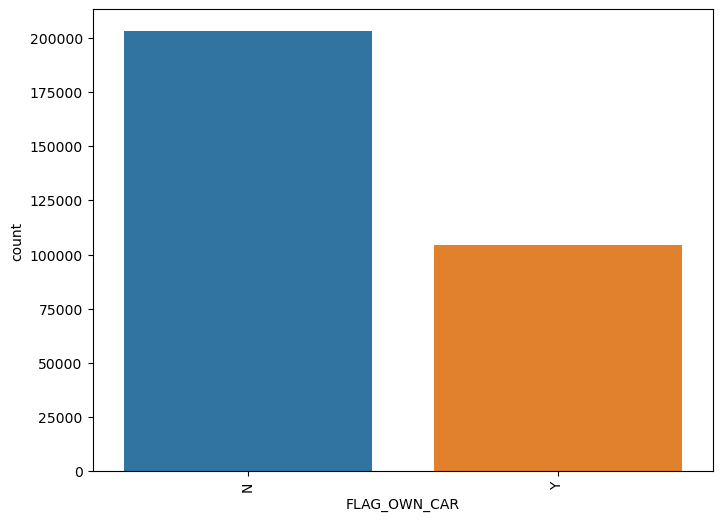

Countplot of FLAG_OWN_REALTY


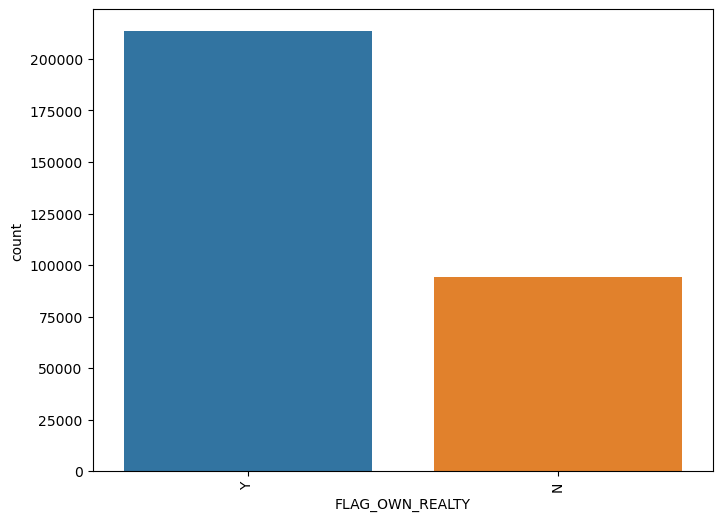

Countplot of NAME_TYPE_SUITE


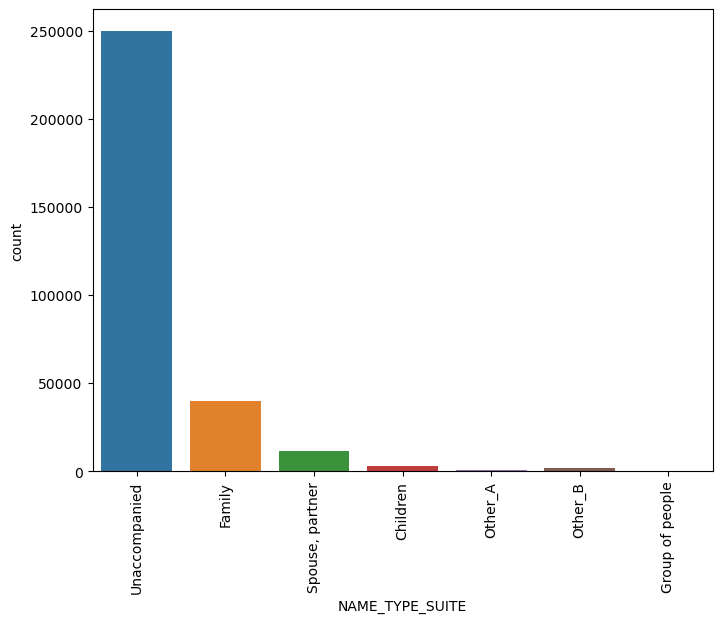

Countplot of NAME_INCOME_TYPE


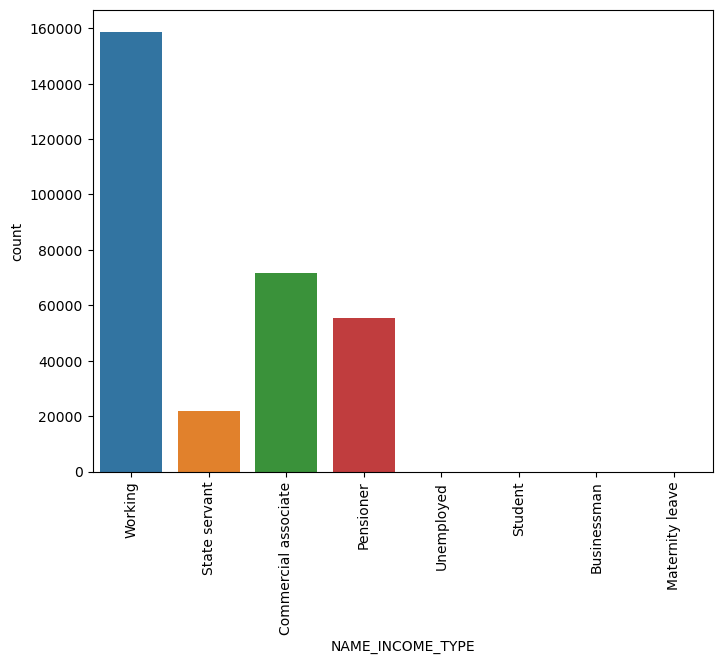

Countplot of NAME_EDUCATION_TYPE


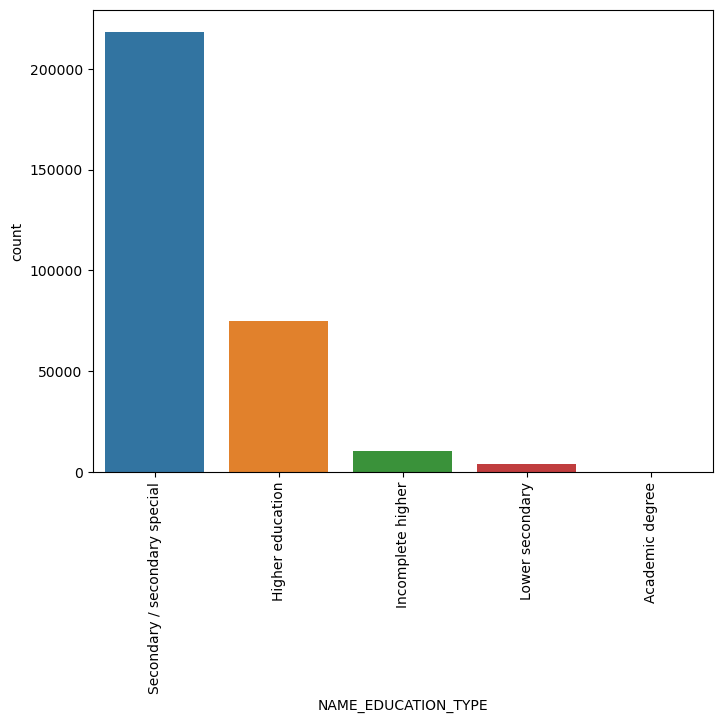

Countplot of NAME_FAMILY_STATUS


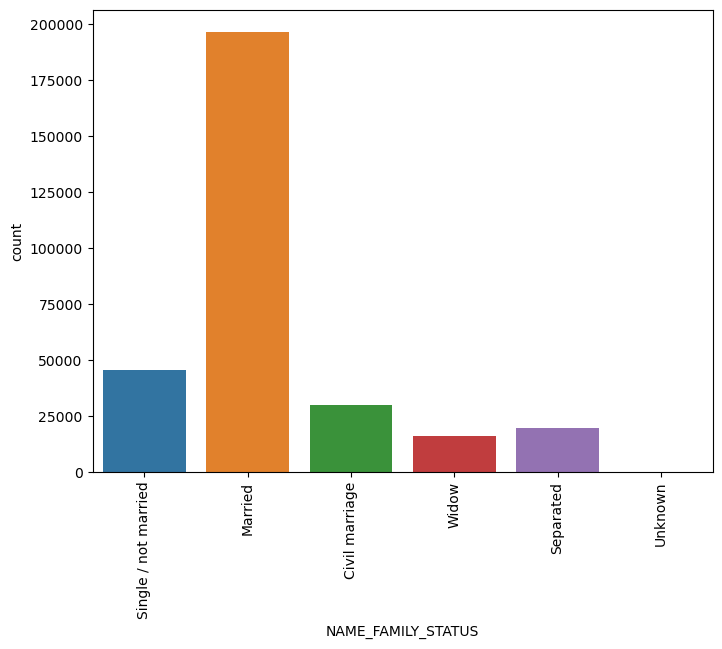

Countplot of NAME_HOUSING_TYPE


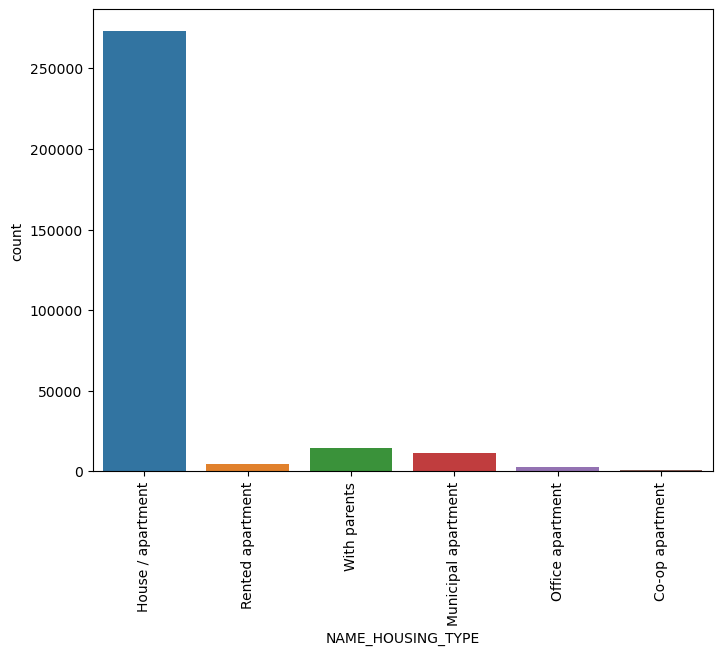

Countplot of OCCUPATION_TYPE


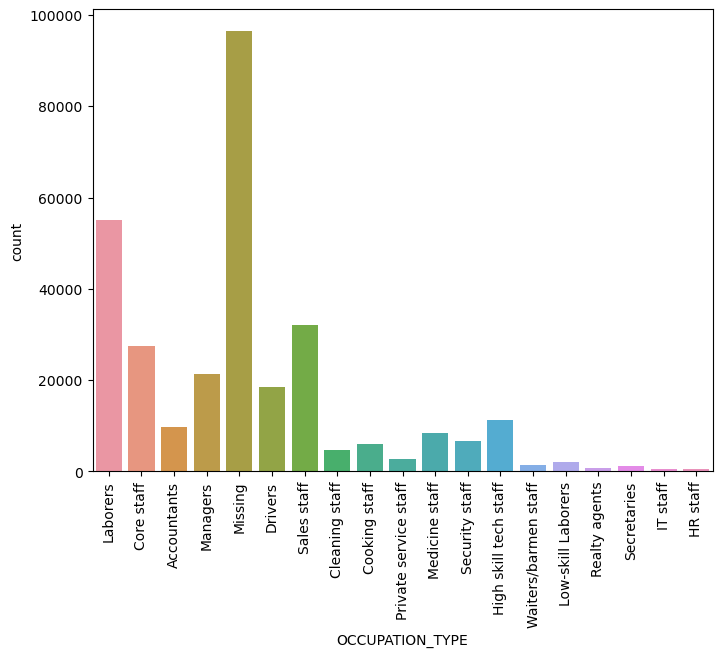

Countplot of ORGANIZATION_TYPE


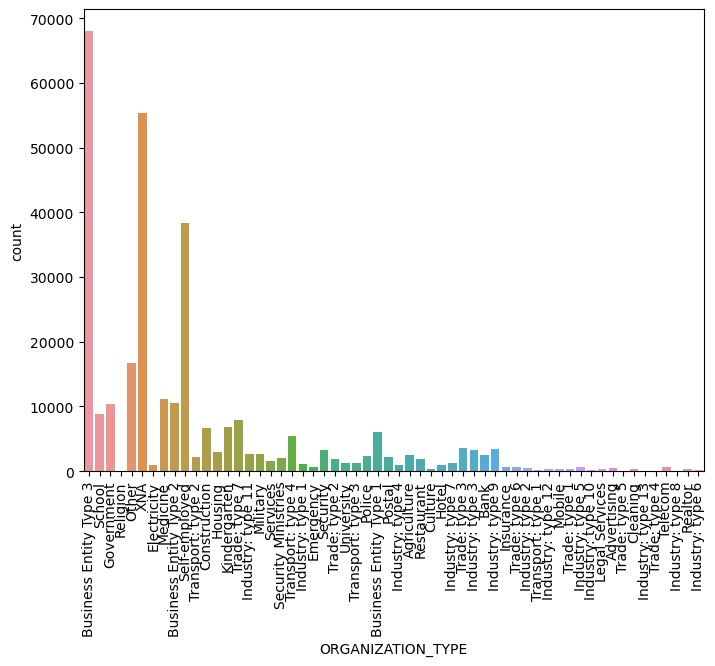

Countplot of TOTAL_INCOME


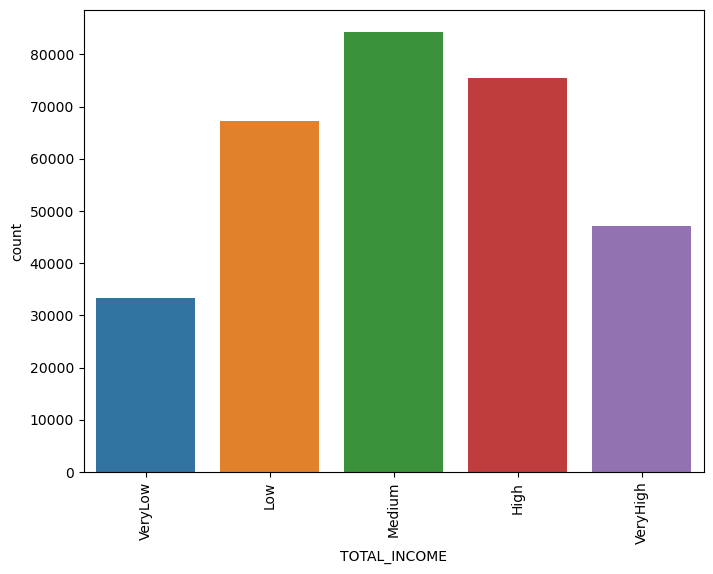

In [106]:
#let's plot count plot for the object type variables.
for i in obj_cols_appdata:
    print("Countplot of",i)
    plt.figure(figsize=(8,6))
    sns.countplot(x=df_ApplicationData[i])
    plt.xticks(rotation=90)
    plt.show()

### insights from the above countplot are:
1. 90% of the loans taken are cash loans.
2. 65% of applicants are females while males are only 34%. This facts is surpring as mostly earning ones are considered to be      males.Assuming that this might be due to some off in interest rate given to the Females.
3. There are 66% of applicants who do not have car. This % might include the car loans also,thats why % of applicants with out      car are more.
4. There are 69% of applicants who own a house or flat.
5. There are 81% of people who came unaccompanied while applying for loan. Only 31% of applicants came with the family members.
6. There are 51% of working applicants which is obvious working may take loan confidently. Others are commercial associate and      pensioner.
7. Majority(70%) of applicants are educated till secondary /secondary special.
8. There are 63% of applicants are married. And only 14% are single.
9. There are 31% of Missing data for occupation type.Well this is important criteria for financial firms to consider.
10. Applicants belong to various type of organisation. Business Entity has 22% which not so big. It means loans taken from all       type of organisation.
11. Medium and High salary people are more likely to take loan.

Boxplot of AMT_CREDIT


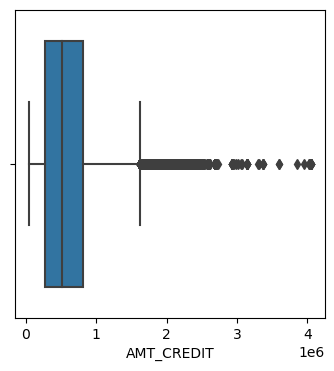

Boxplot of AMT_ANNUITY


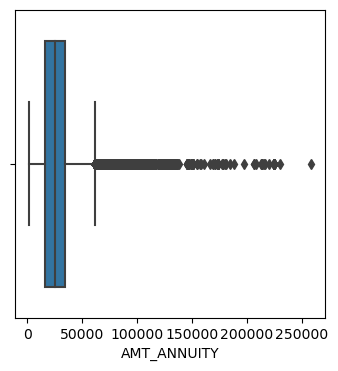

Boxplot of AMT_GOODS_PRICE


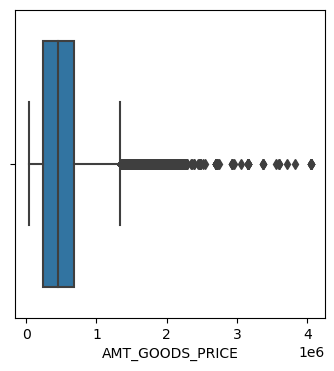

Boxplot of REGION_POPULATION_RELATIVE


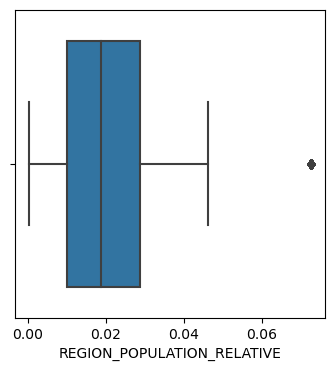

Boxplot of DAYS_REGISTRATION


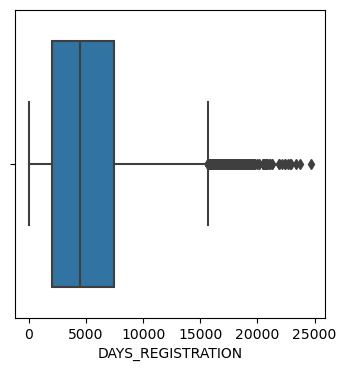

Boxplot of CNT_FAM_MEMBERS


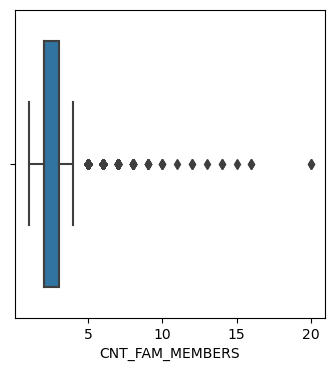

Boxplot of EXT_SOURCE_2


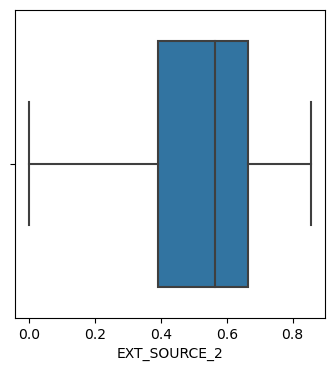

Boxplot of DEF_30_CNT_SOCIAL_CIRCLE


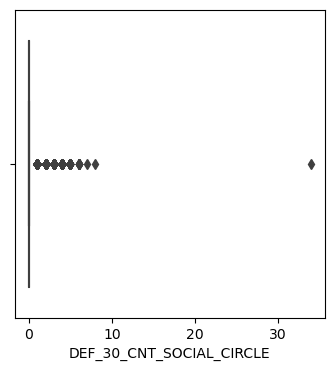

Boxplot of DEF_60_CNT_SOCIAL_CIRCLE


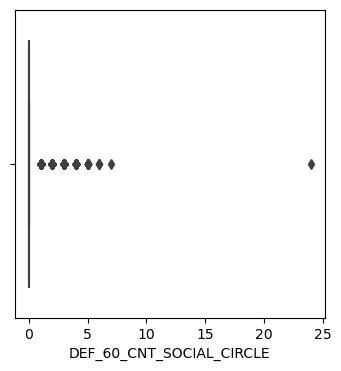

Boxplot of DAYS_LAST_PHONE_CHANGE


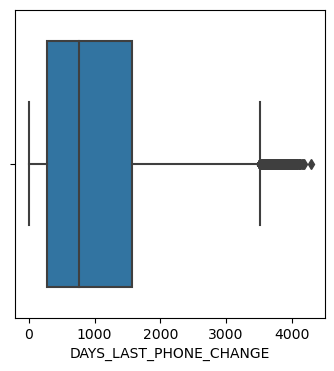

Boxplot of AMT_REQ_CREDIT_BUREAU_HOUR


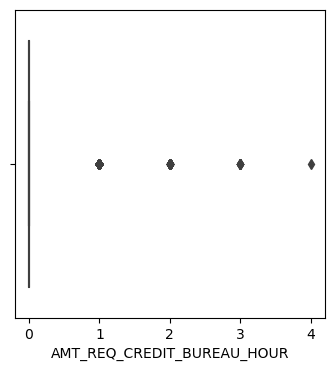

Boxplot of AMT_REQ_CREDIT_BUREAU_DAY


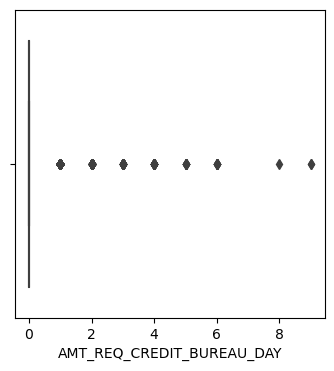

Boxplot of AMT_REQ_CREDIT_BUREAU_WEEK


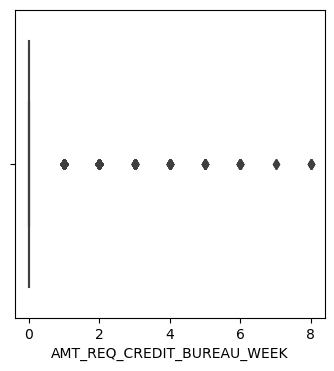

Boxplot of AMT_REQ_CREDIT_BUREAU_MON


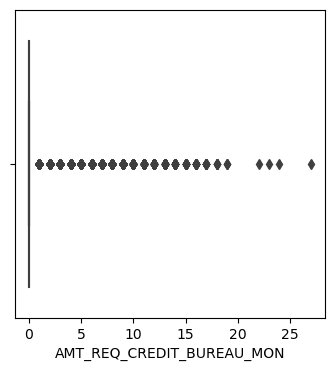

Boxplot of AMT_REQ_CREDIT_BUREAU_QRT


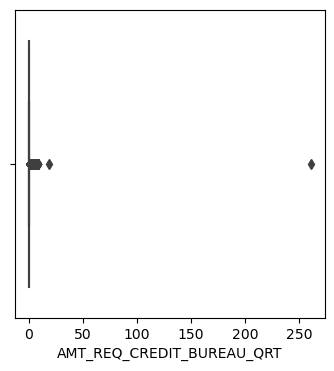

Boxplot of AMT_REQ_CREDIT_BUREAU_YEAR


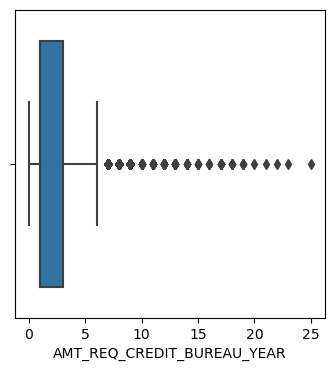

In [107]:
for i in float_cols_appdata:
    plt.figure(figsize=(4,4))
    print("Boxplot of",i)
    sns.boxplot(x=df_ApplicationData[i])
    plt.show()

Boxplot of SK_ID_CURR


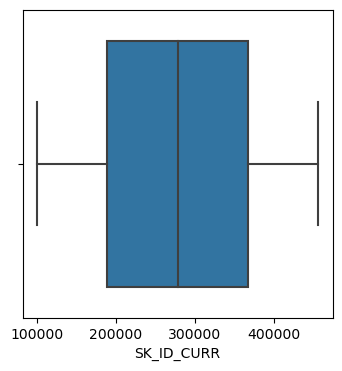

Boxplot of TARGET


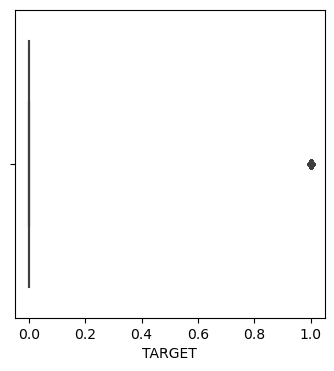

Boxplot of CNT_CHILDREN


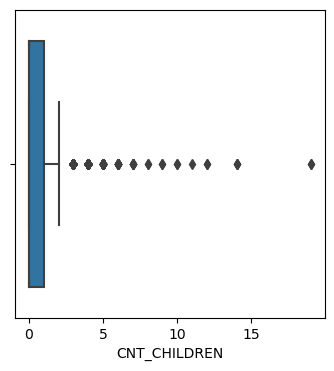

Boxplot of DAYS_BIRTH


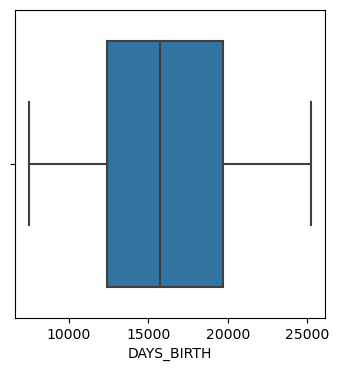

Boxplot of DAYS_EMPLOYED


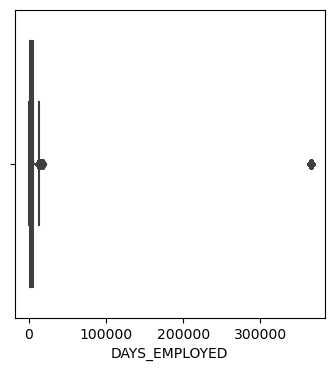

Boxplot of DAYS_ID_PUBLISH


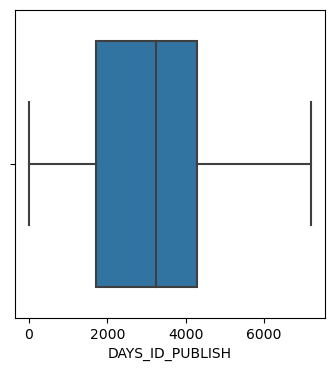

Boxplot of REGION_RATING_CLIENT


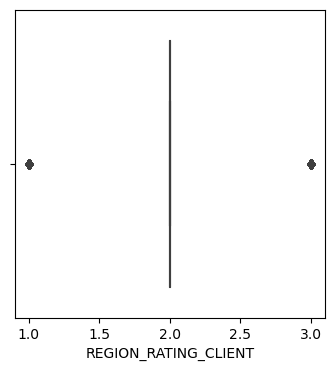

Boxplot of REGION_RATING_CLIENT_W_CITY


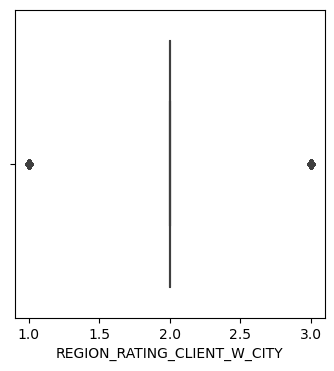

Boxplot of HOUR_APPR_PROCESS_START


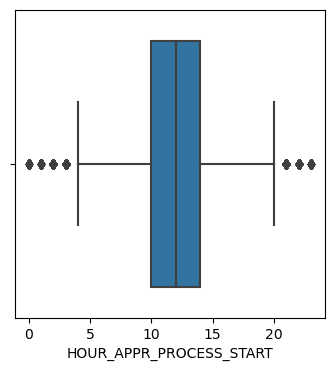

Boxplot of REG_REGION_NOT_LIVE_REGION


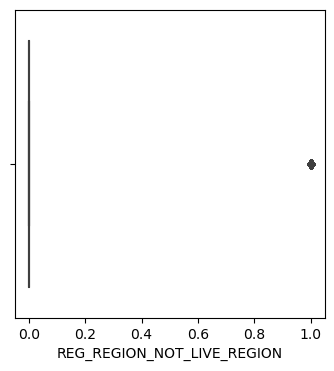

Boxplot of REG_REGION_NOT_WORK_REGION


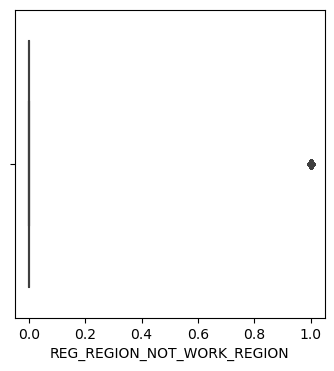

Boxplot of LIVE_REGION_NOT_WORK_REGION


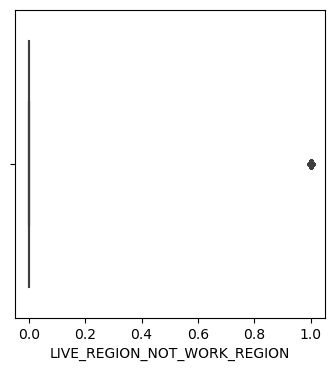

Boxplot of REG_CITY_NOT_LIVE_CITY


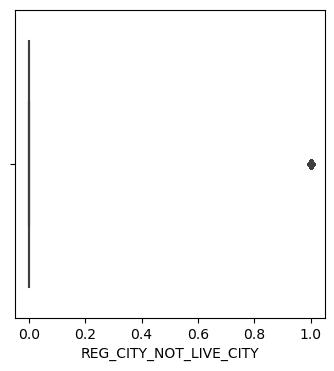

Boxplot of REG_CITY_NOT_WORK_CITY


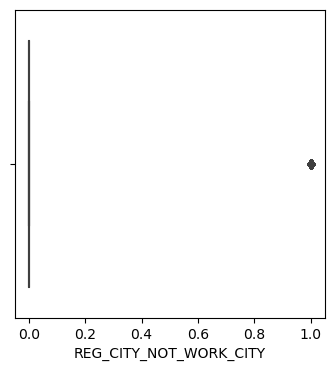

Boxplot of LIVE_CITY_NOT_WORK_CITY


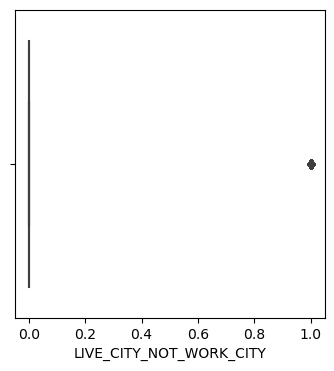

In [108]:
for i in int_cols_appdata:
    plt.figure(figsize=(4,4))
    print("Boxplot of",i)
    sns.boxplot(x=df_ApplicationData[i])
    plt.show()

### Insight from Boxplot
1. We already saw outliers in AMT_INCOME_TOTAL where min range is 25K and the max range is upto 12 Crore. We have already added    a TOTAL_INCOME column to analyse the lower range better.
2. We can clearly see the outliers in AMT_CREDIT, AMT_ANNUITY,AMT_GOODS_PRICE, REGION_POPULATION_RELATIVE ,DAYS_REGISTRATION,      OBS_30_CNT_SOCIAL_CIRCLE
3. Days are converted to positive values,earlier it was mentioned as back days.
4. We can see outliers in int data type variable like- HOUR_APPR_PROCESS_START,DAYS_EMPLOYED,CNT_CHILDREN.

Histplot of AMT_CREDIT


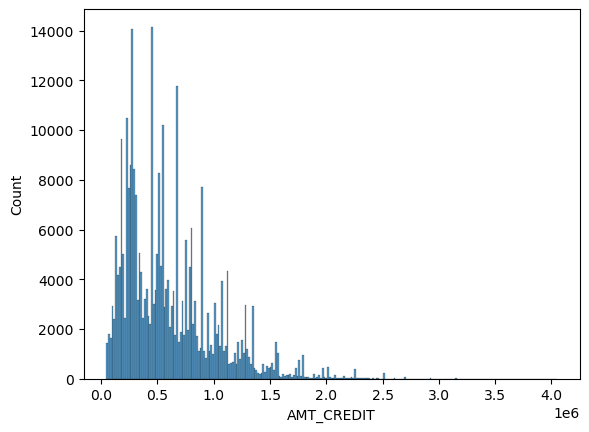

Histplot of AMT_ANNUITY


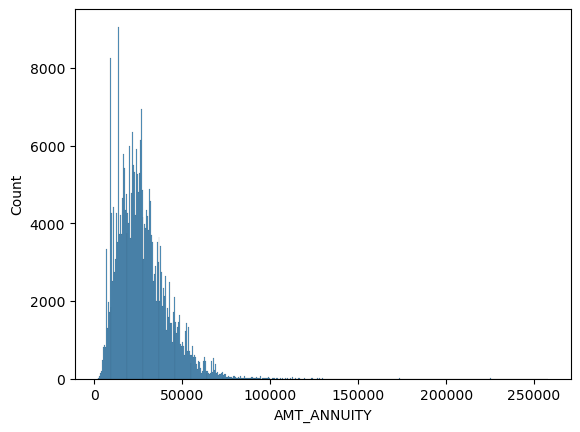

Histplot of AMT_GOODS_PRICE


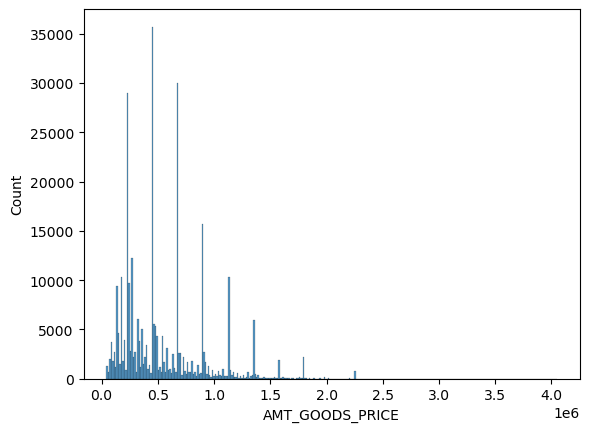

Histplot of REGION_POPULATION_RELATIVE


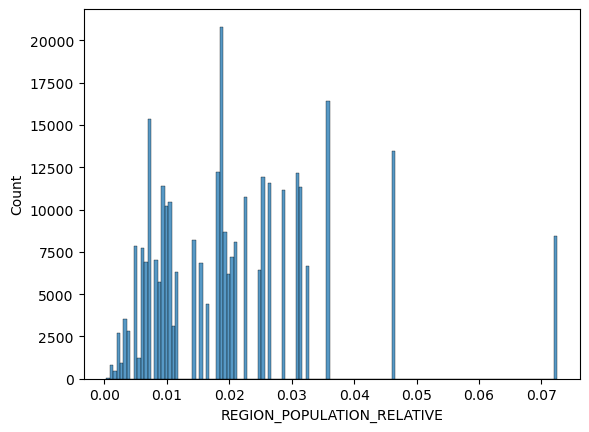

Histplot of DAYS_REGISTRATION


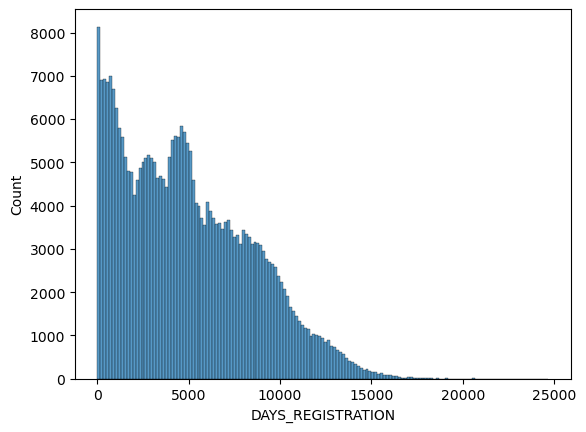

Histplot of CNT_FAM_MEMBERS


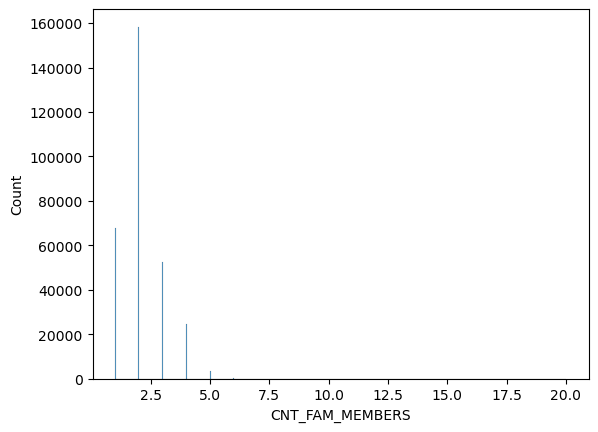

Histplot of EXT_SOURCE_2


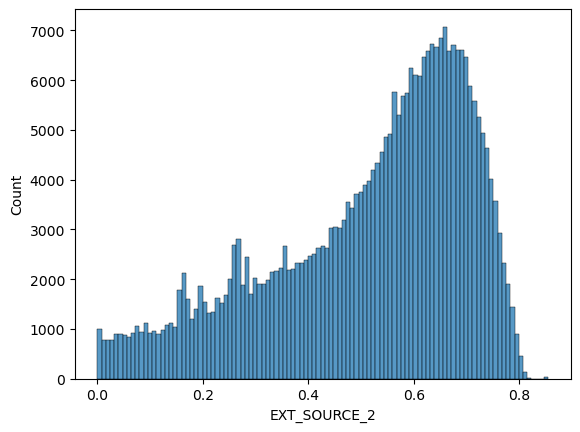

Histplot of DEF_30_CNT_SOCIAL_CIRCLE


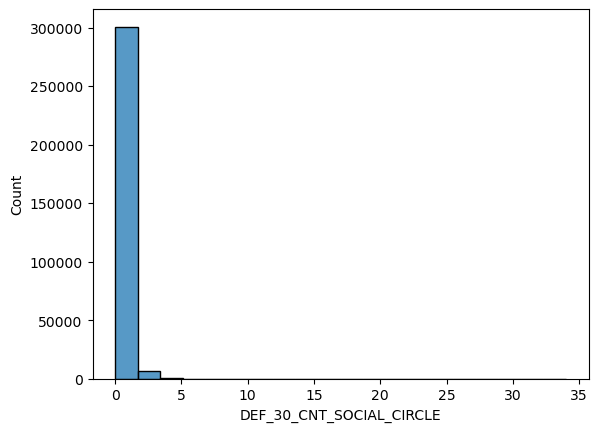

Histplot of DEF_60_CNT_SOCIAL_CIRCLE


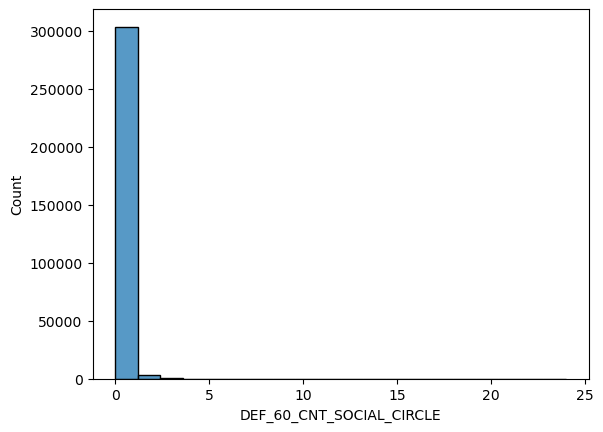

Histplot of DAYS_LAST_PHONE_CHANGE


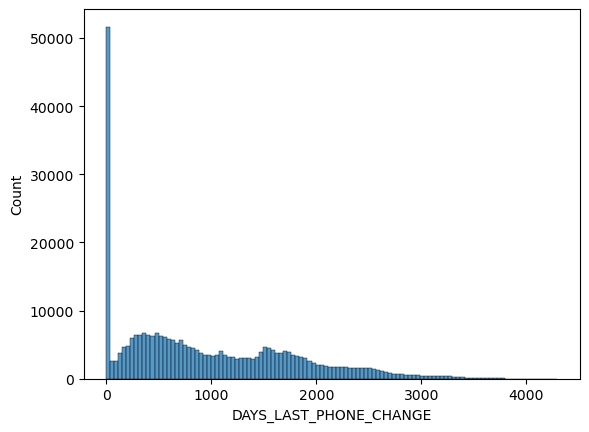

Histplot of AMT_REQ_CREDIT_BUREAU_HOUR


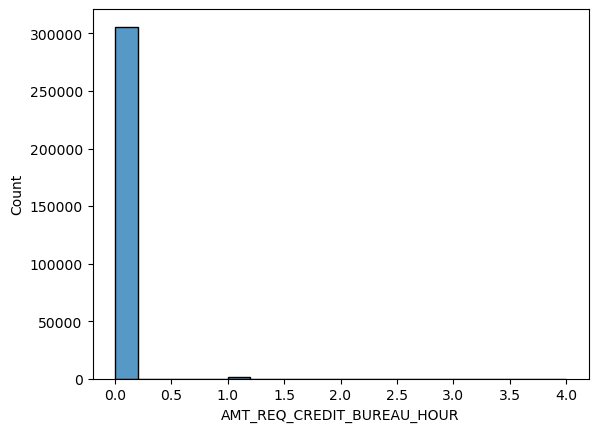

Histplot of AMT_REQ_CREDIT_BUREAU_DAY


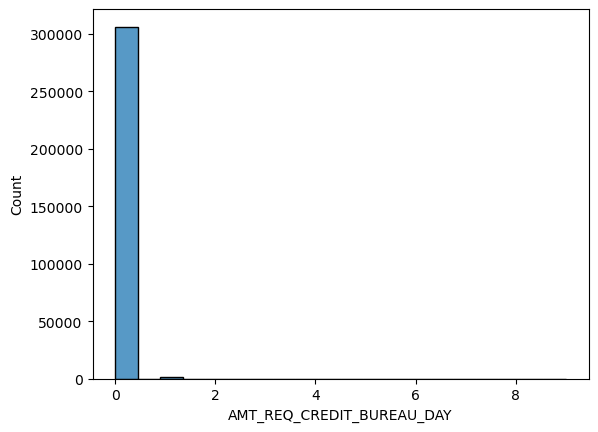

Histplot of AMT_REQ_CREDIT_BUREAU_WEEK


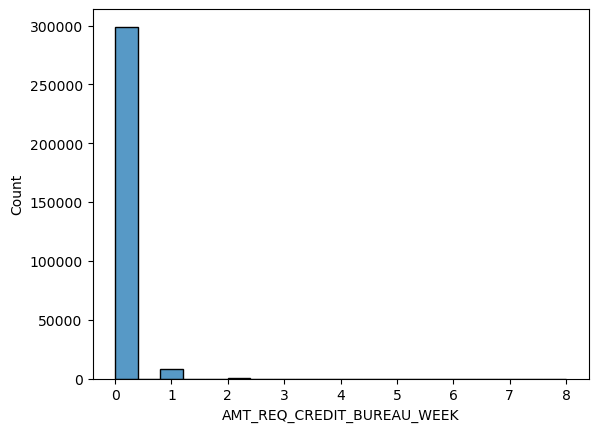

Histplot of AMT_REQ_CREDIT_BUREAU_MON


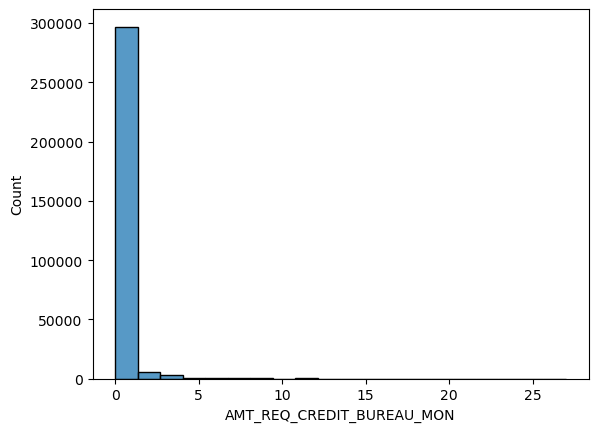

Histplot of AMT_REQ_CREDIT_BUREAU_QRT


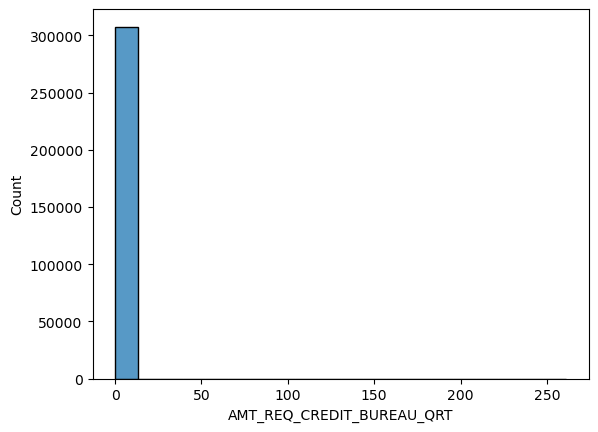

Histplot of AMT_REQ_CREDIT_BUREAU_YEAR


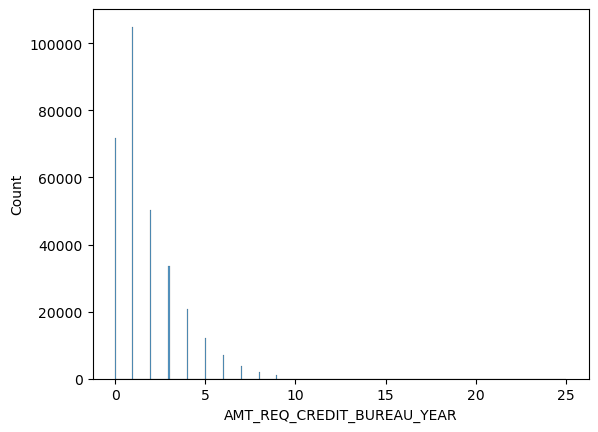

In [109]:
for i in float_cols_appdata:
    print("Histplot of",i)
    sns.histplot(x=df_ApplicationData[i])
    plt.show()

Histplot of SK_ID_CURR


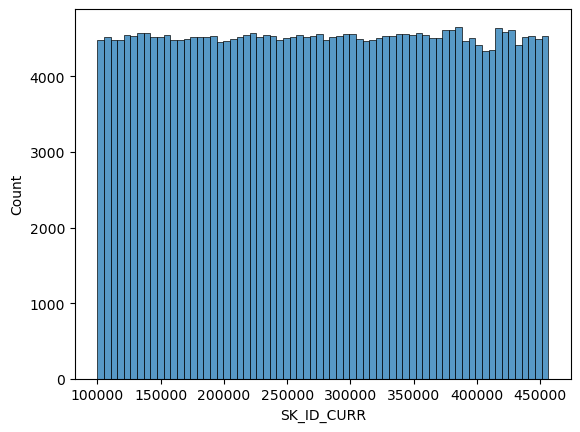

Histplot of TARGET


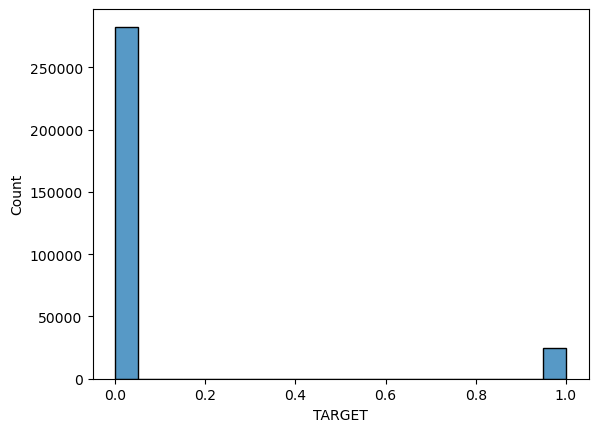

Histplot of CNT_CHILDREN


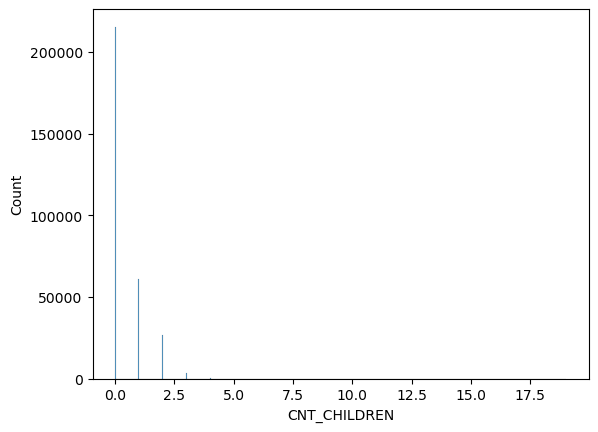

Histplot of DAYS_BIRTH


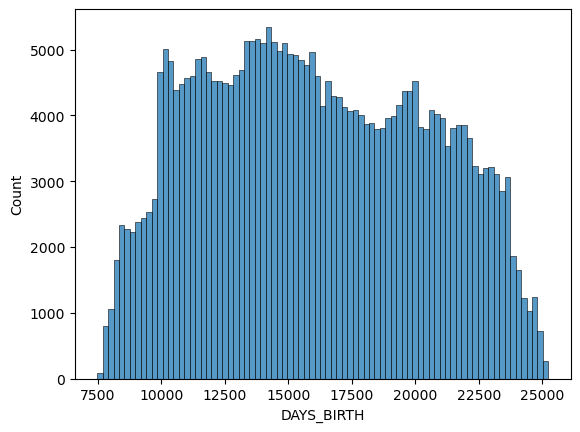

Histplot of DAYS_EMPLOYED


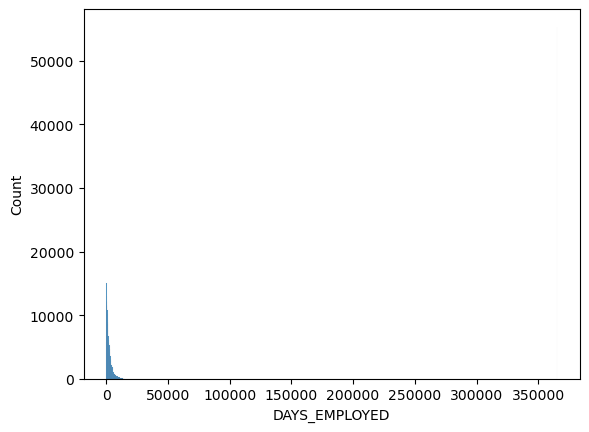

Histplot of DAYS_ID_PUBLISH


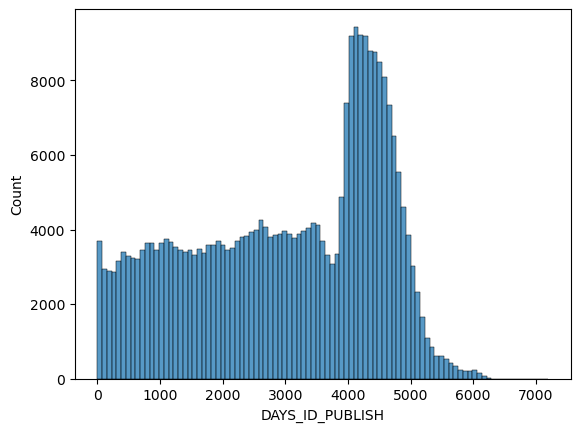

Histplot of REGION_RATING_CLIENT


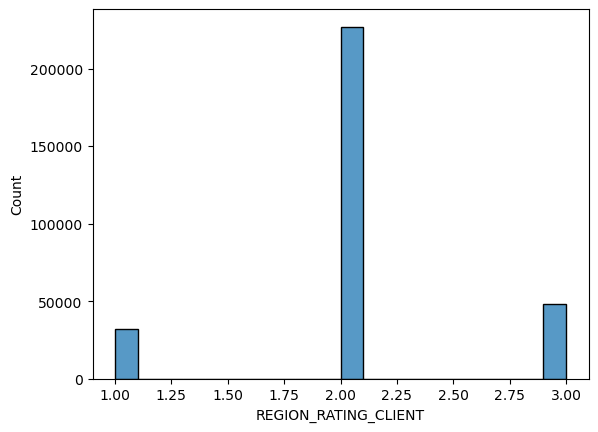

Histplot of REGION_RATING_CLIENT_W_CITY


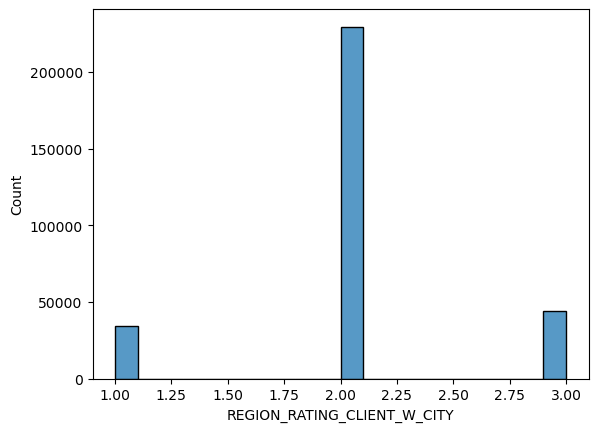

Histplot of HOUR_APPR_PROCESS_START


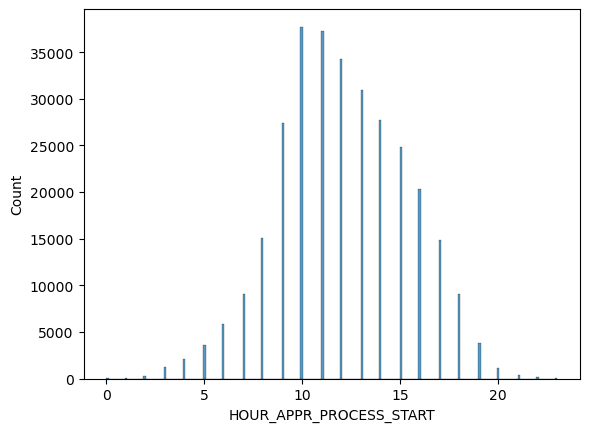

Histplot of REG_REGION_NOT_LIVE_REGION


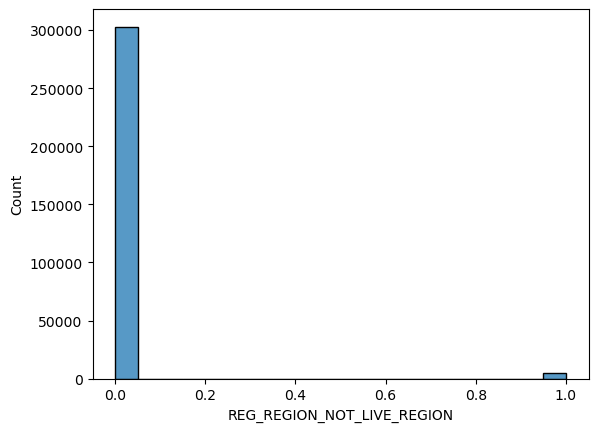

Histplot of REG_REGION_NOT_WORK_REGION


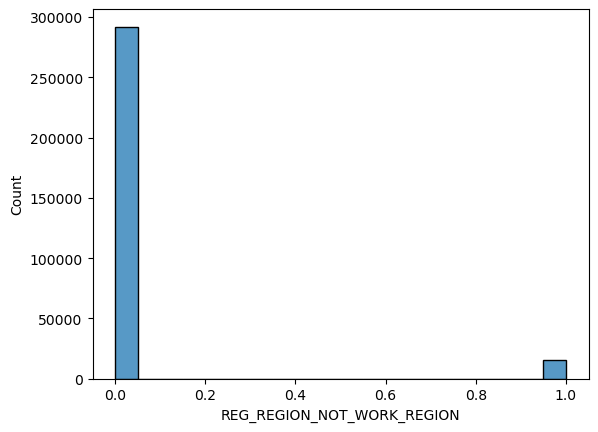

Histplot of LIVE_REGION_NOT_WORK_REGION


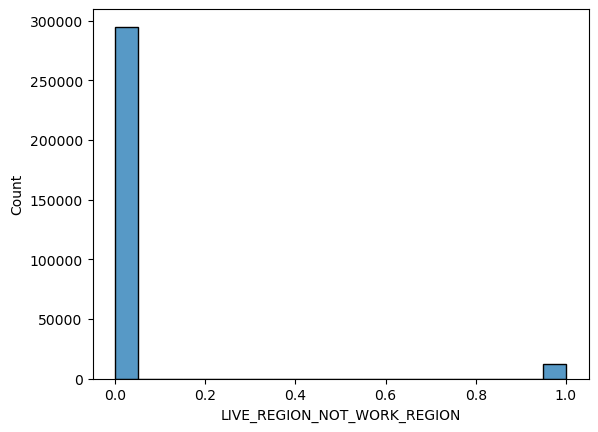

Histplot of REG_CITY_NOT_LIVE_CITY


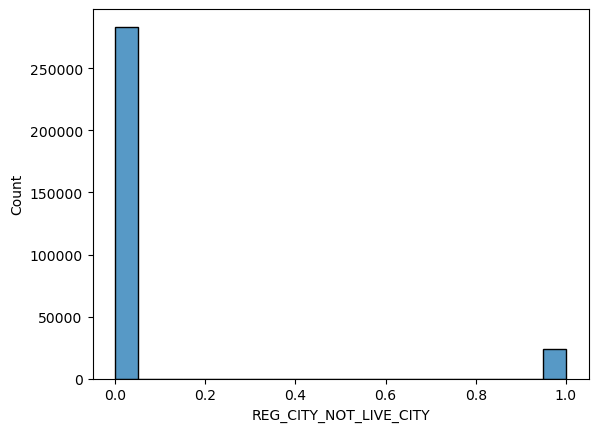

Histplot of REG_CITY_NOT_WORK_CITY


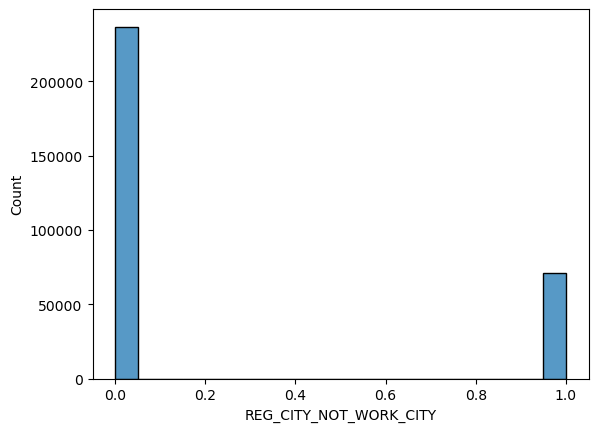

Histplot of LIVE_CITY_NOT_WORK_CITY


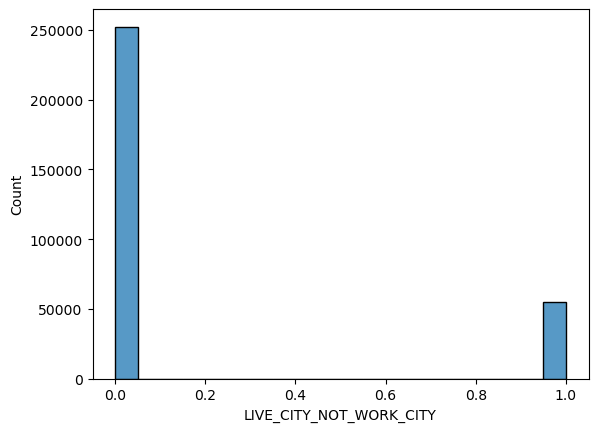

In [110]:
for i in int_cols_appdata:
    print("Histplot of",i)
    sns.histplot(x=df_ApplicationData[i])
    plt.show()


### imp insights from the above histplot for numerical values:
1. Mostly loan amount taken by applicants are from 2.5lakh to almost 8lakhs.
2. Annuity amount is max at 25000.
3. Price of the goods for which loan is taken is also between range 2.5-8 lakhs.
4. First loan registration happend around 20000 days before.
6. Number of enquiries to Credit Bureau occured are more in initial phase then slowed down.
7. Mostly applicants do no have child.
8. Mostly loan is taken by applicants age from 12000 to 17000 days...approx 30 to 45.
9. Most applicants are rated as 2 (w.r.t city as well).
10. In the end information regarding address is give right in most of the scenario.

## Bivariate Analysis for application data

Countplot of NAME_CONTRACT_TYPE


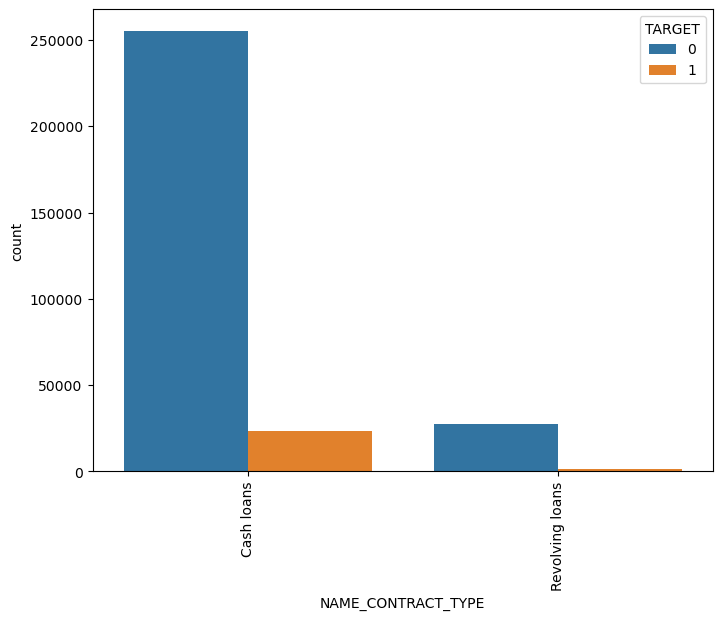

Countplot of CODE_GENDER


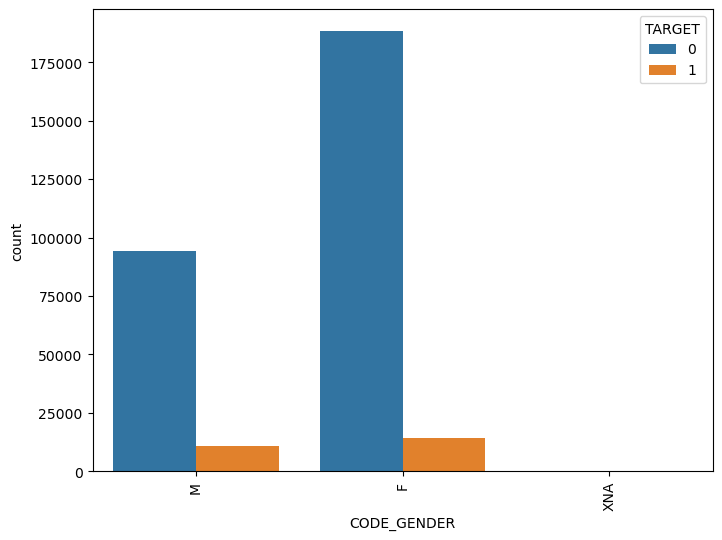

Countplot of FLAG_OWN_CAR


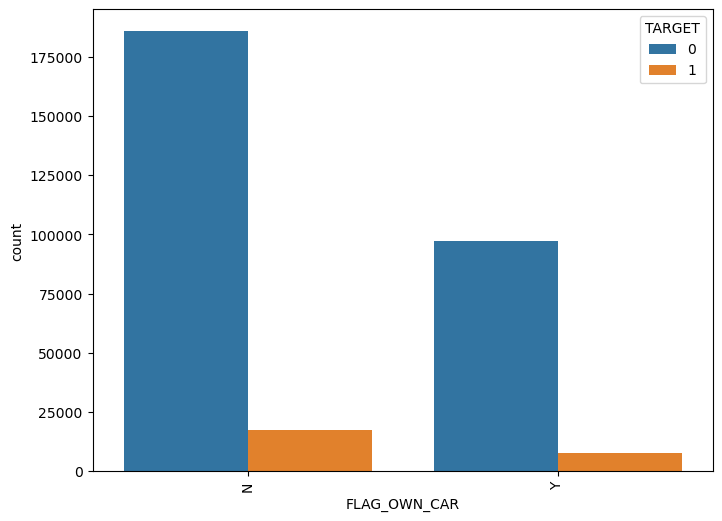

Countplot of FLAG_OWN_REALTY


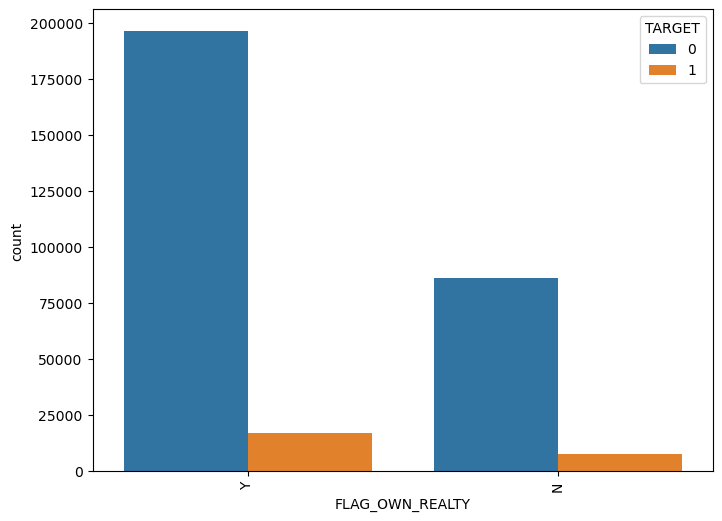

Countplot of NAME_TYPE_SUITE


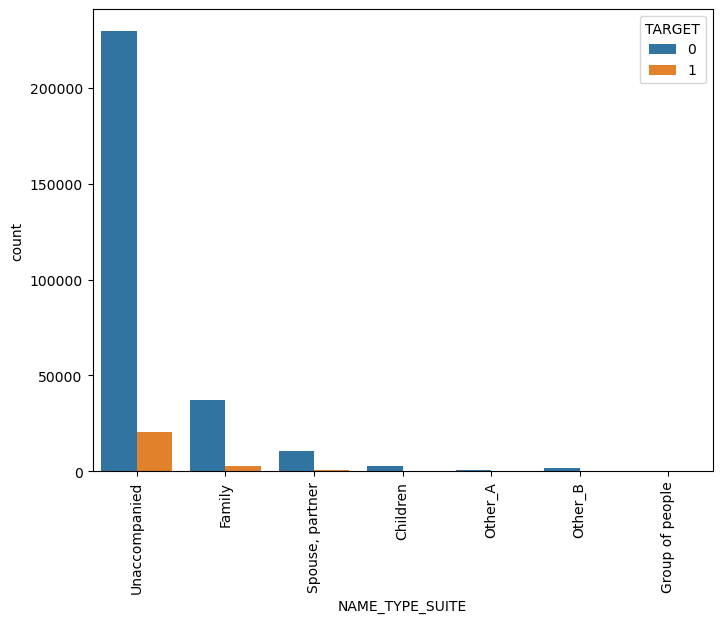

Countplot of NAME_INCOME_TYPE


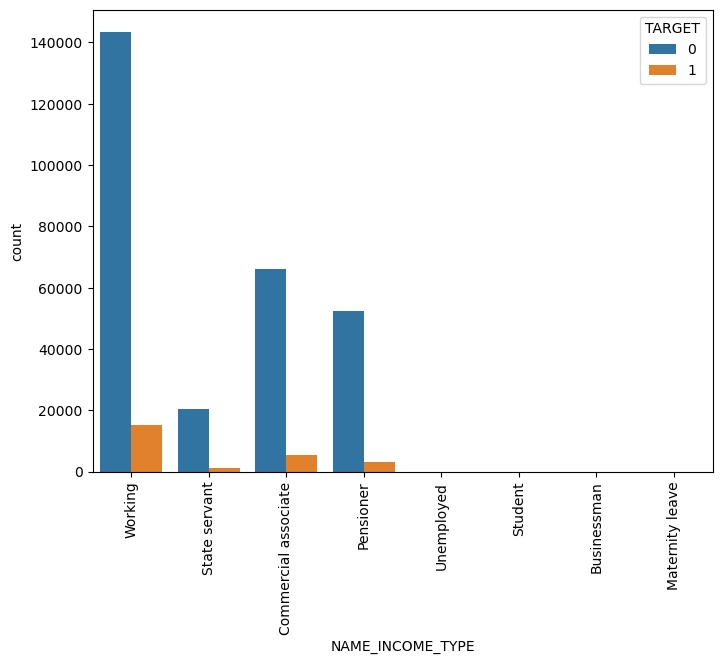

Countplot of NAME_EDUCATION_TYPE


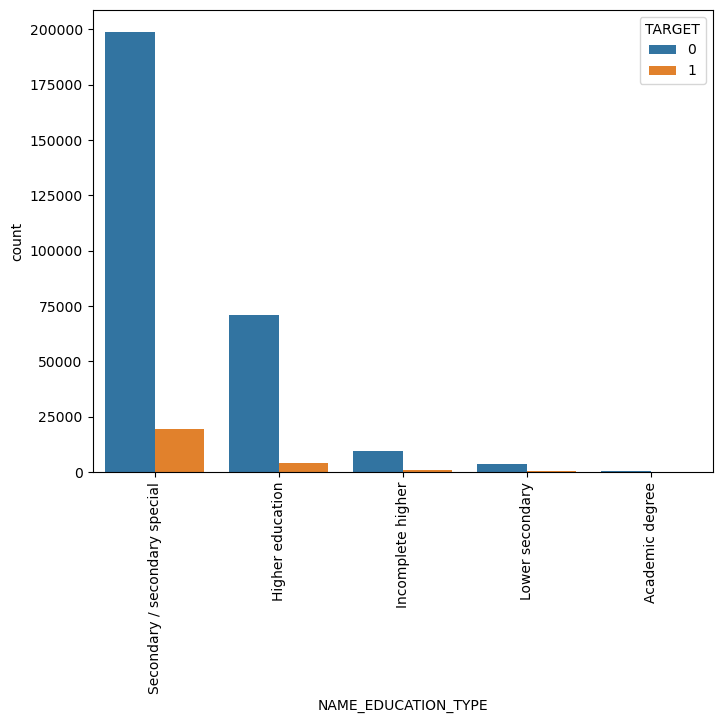

Countplot of NAME_FAMILY_STATUS


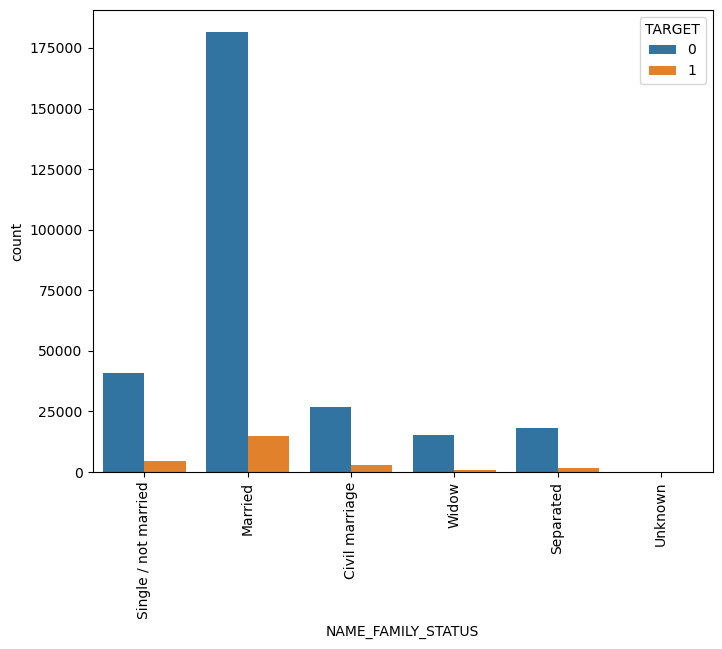

Countplot of NAME_HOUSING_TYPE


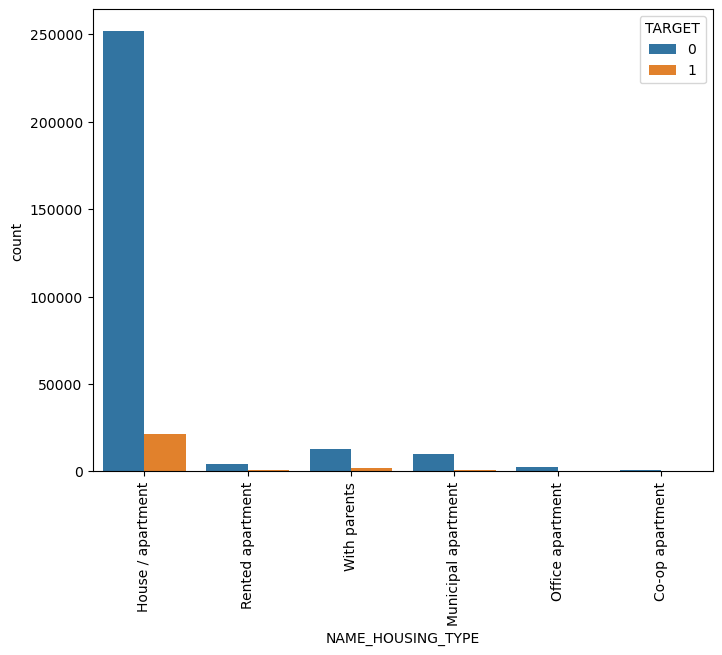

Countplot of OCCUPATION_TYPE


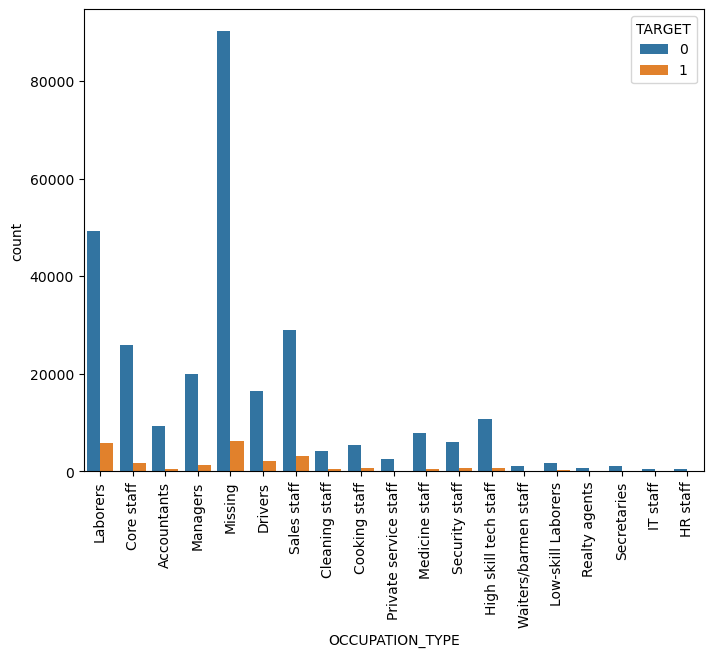

Countplot of ORGANIZATION_TYPE


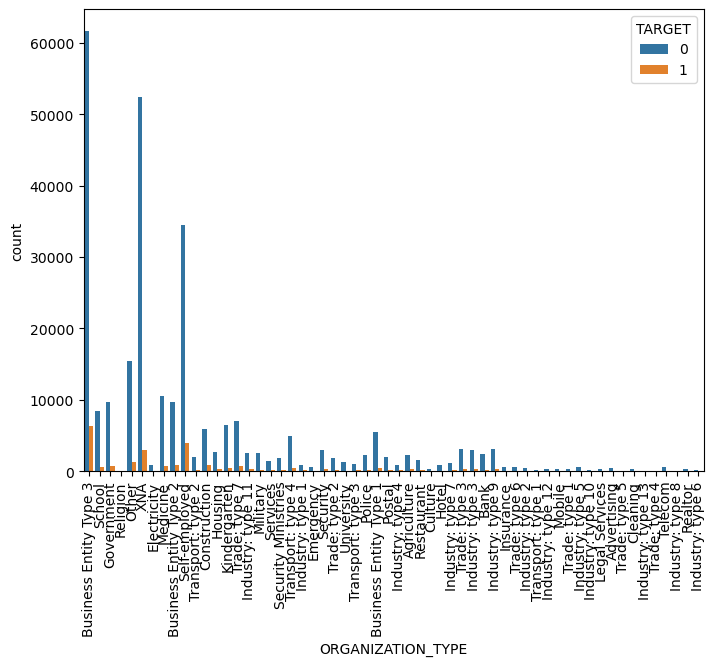

Countplot of TOTAL_INCOME


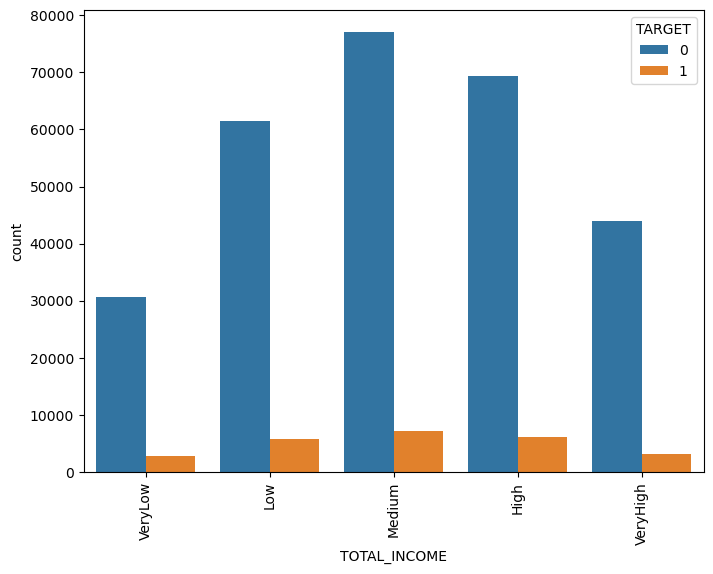

In [111]:
for i in obj_cols_appdata:
    print("Countplot of",i)
    plt.figure(figsize=(8,6))
    sns.countplot(x=df_ApplicationData[i],hue='TARGET',data=df_ApplicationData)
    plt.xticks(rotation=90)
    plt.show()

### imp insights from bivariate analysis:
1. Cash loans are more smoothly paid than Revolving type. Revolving loans are risky.
2. Compared to males females are paying loans without difficulty.So giving loan to males is more risky.
3. Applicants who don't have car/own house are paying loans without difficulty.So giving loan to applicants who have car/own house may not be reliable.
4. Applicants who came unaccompanied during loan registration are more reliable.
5. Working professional will have payment difficulty but as ratio risk will be less than others.
6. As compared to married single applicants are more risky.
7. Applicants living in apartment and house have less difficulty in payment.
8. There are lot of missing values in occupation type.This has to be taken care in future.labourers have smooth
   payment as well as difficulty also.
9. High salary applicant is more risky than medium salaried applicant.

SK_ID_CURR Vs TARGET


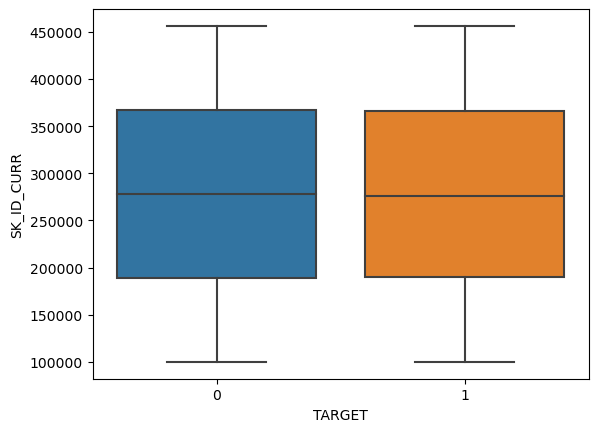

TARGET Vs TARGET


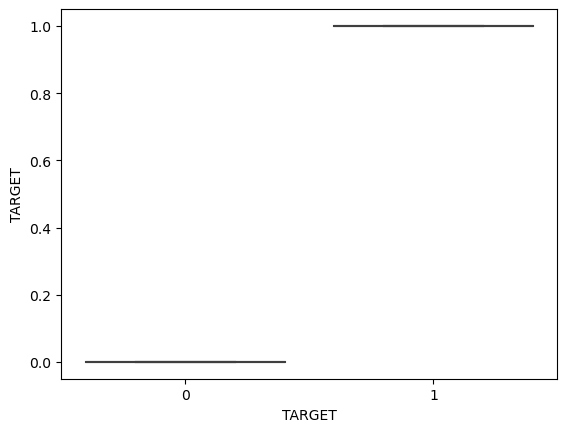

CNT_CHILDREN Vs TARGET


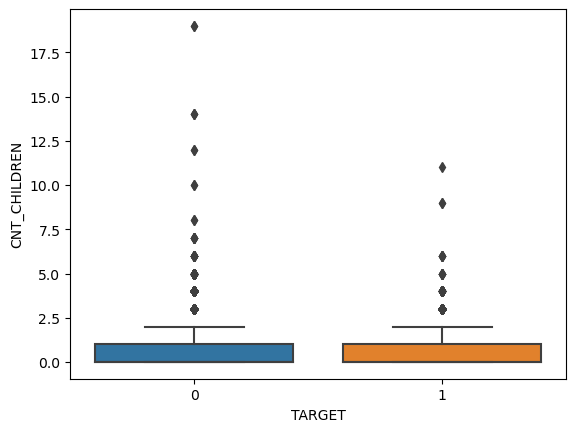

DAYS_BIRTH Vs TARGET


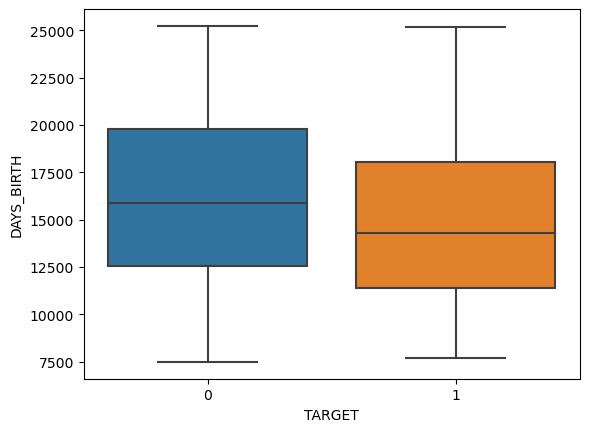

DAYS_EMPLOYED Vs TARGET


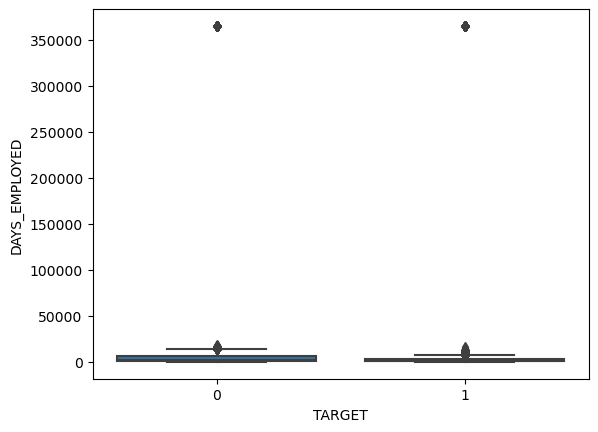

DAYS_ID_PUBLISH Vs TARGET


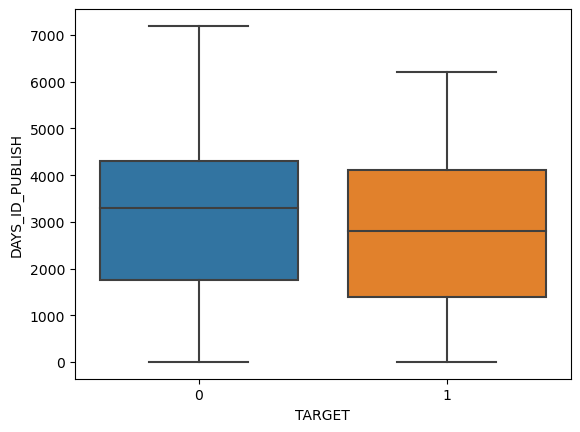

REGION_RATING_CLIENT Vs TARGET


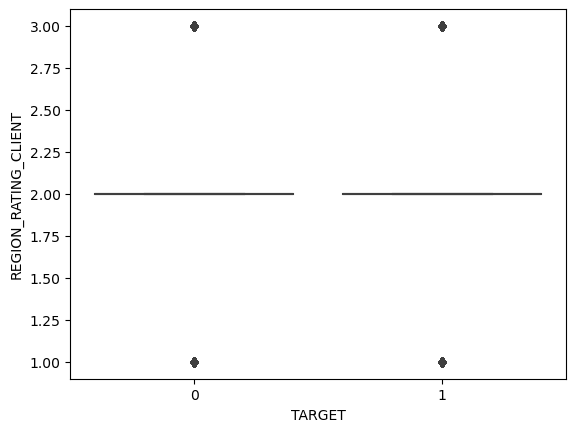

REGION_RATING_CLIENT_W_CITY Vs TARGET


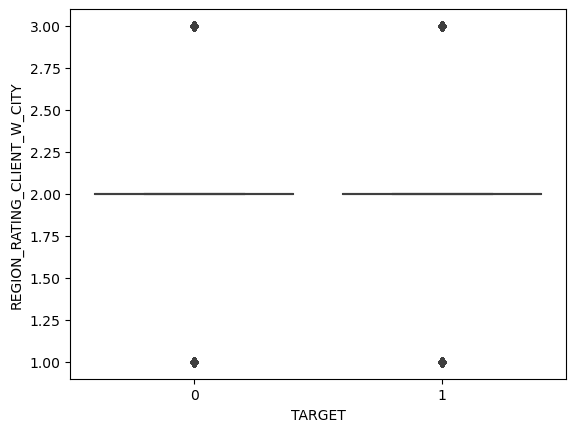

HOUR_APPR_PROCESS_START Vs TARGET


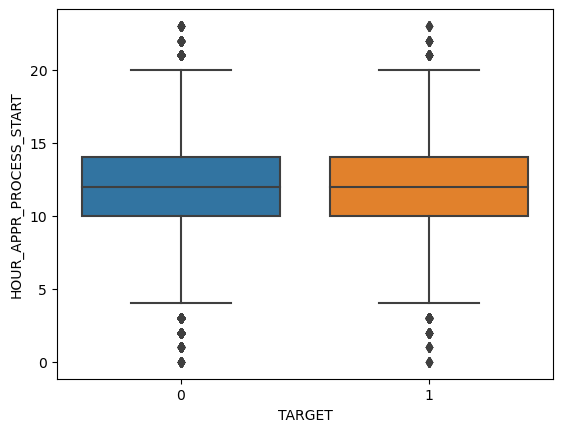

REG_REGION_NOT_LIVE_REGION Vs TARGET


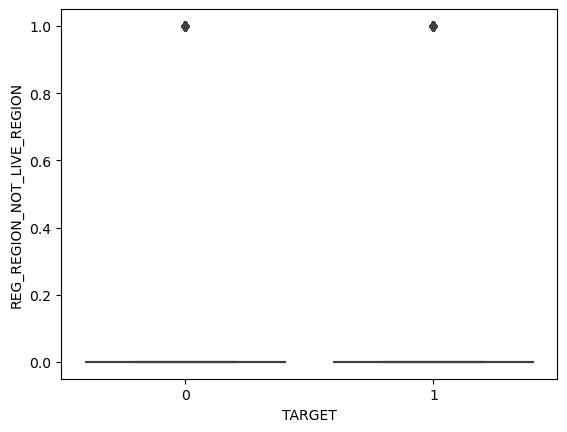

REG_REGION_NOT_WORK_REGION Vs TARGET


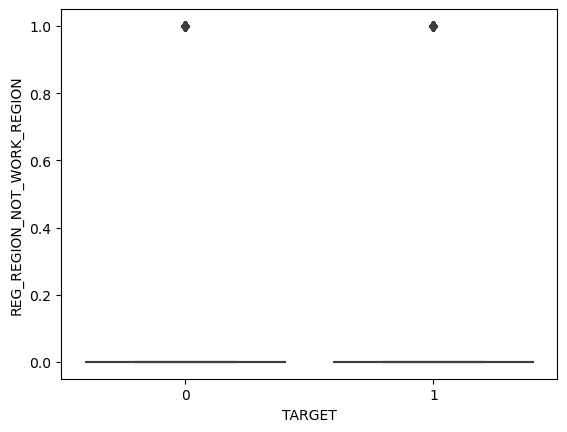

LIVE_REGION_NOT_WORK_REGION Vs TARGET


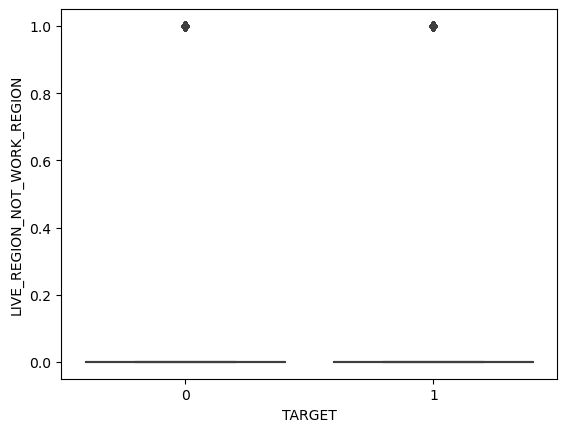

REG_CITY_NOT_LIVE_CITY Vs TARGET


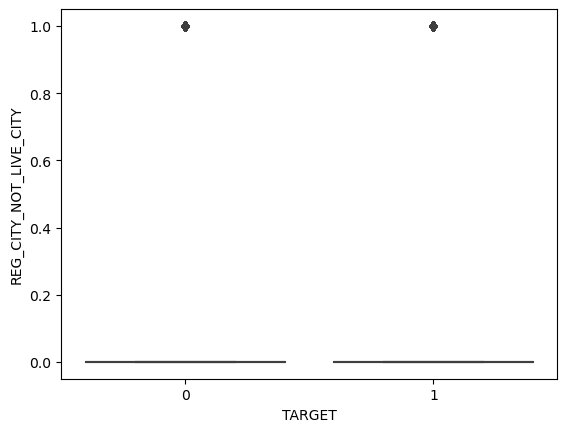

REG_CITY_NOT_WORK_CITY Vs TARGET


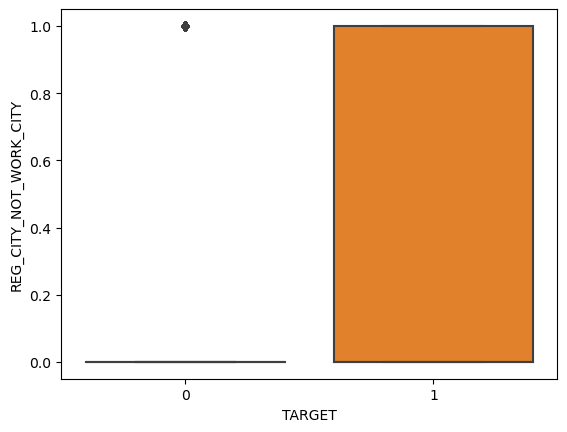

LIVE_CITY_NOT_WORK_CITY Vs TARGET


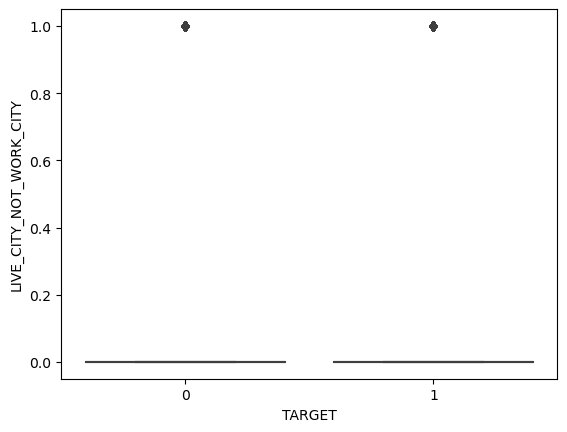

In [112]:
#fig,ax=plt.subplot(7,5)
for i in int_cols_appdata:
    print(i,"Vs",'TARGET')
    sns.boxplot(y=df_ApplicationData[i],x=df_ApplicationData['TARGET'])
    plt.show()

AMT_CREDIT Vs TARGET


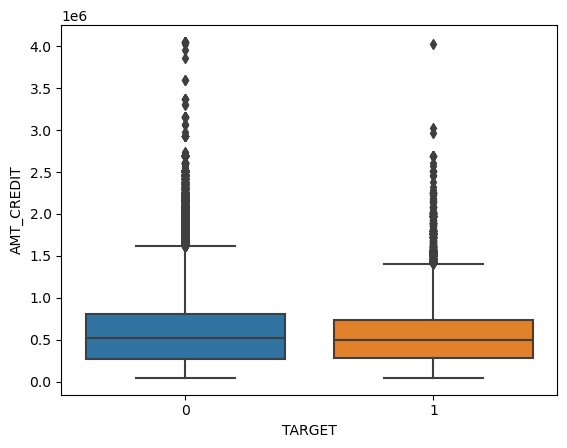

AMT_ANNUITY Vs TARGET


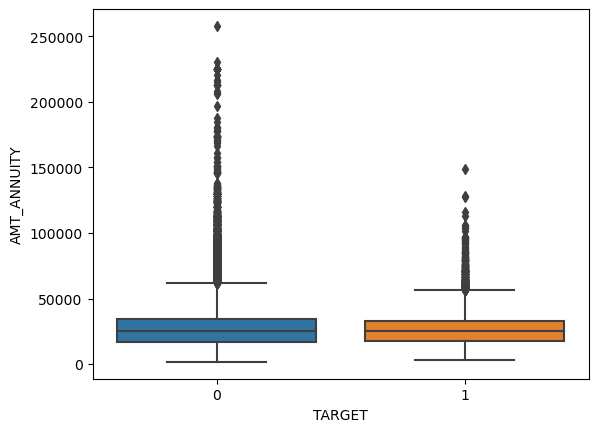

AMT_GOODS_PRICE Vs TARGET


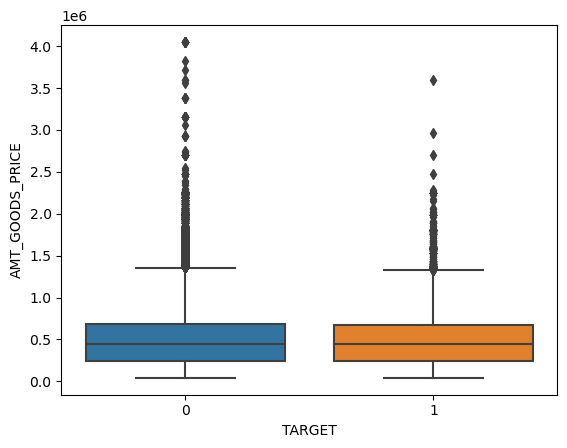

REGION_POPULATION_RELATIVE Vs TARGET


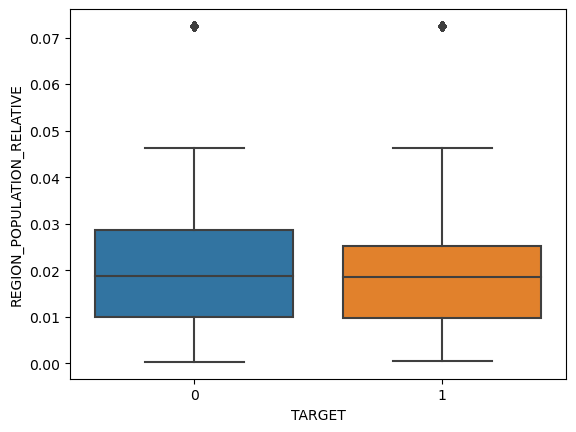

DAYS_REGISTRATION Vs TARGET


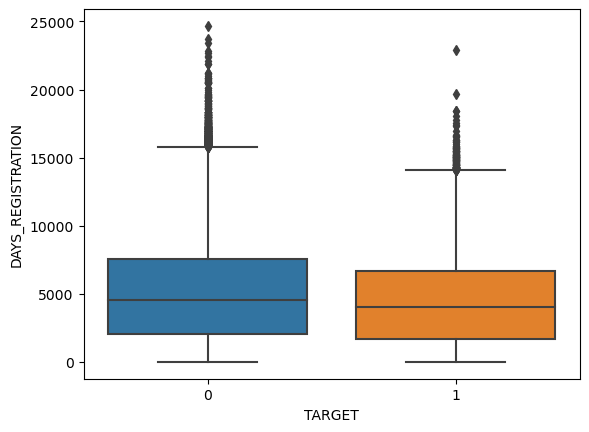

CNT_FAM_MEMBERS Vs TARGET


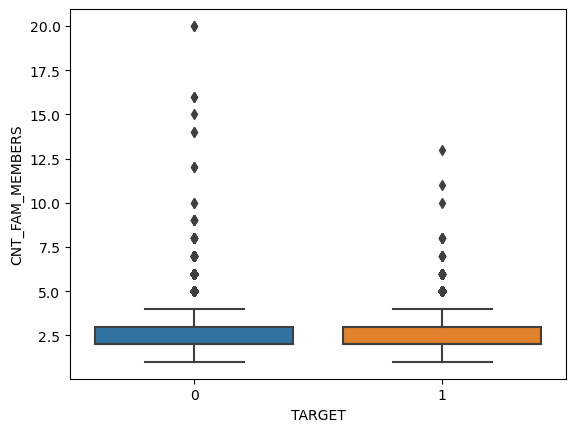

EXT_SOURCE_2 Vs TARGET


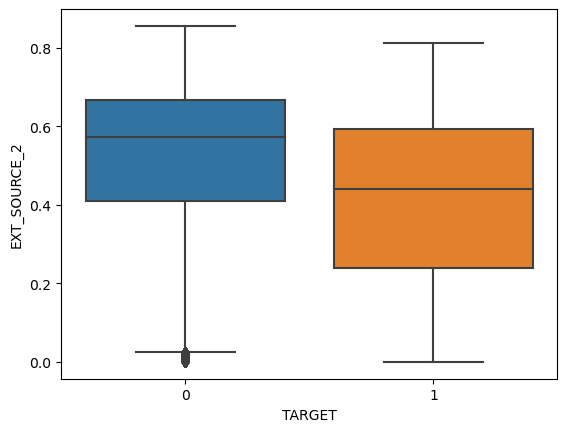

DEF_30_CNT_SOCIAL_CIRCLE Vs TARGET


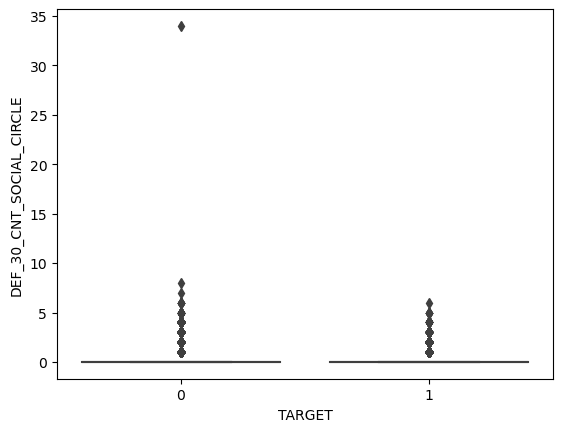

DEF_60_CNT_SOCIAL_CIRCLE Vs TARGET


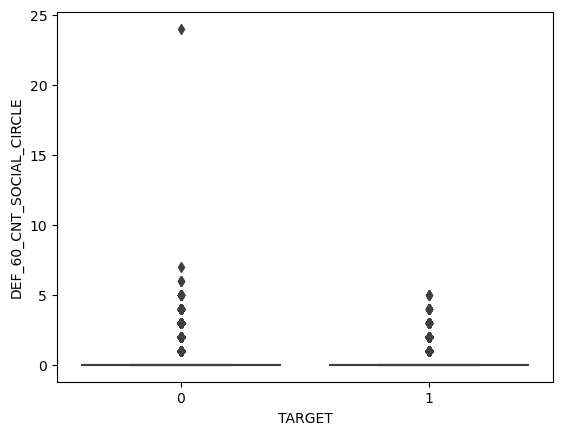

DAYS_LAST_PHONE_CHANGE Vs TARGET


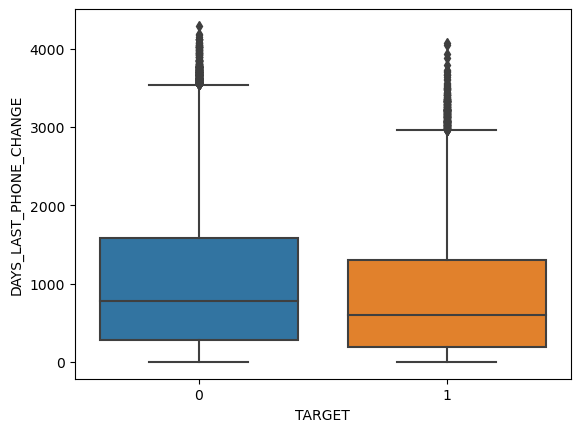

AMT_REQ_CREDIT_BUREAU_HOUR Vs TARGET


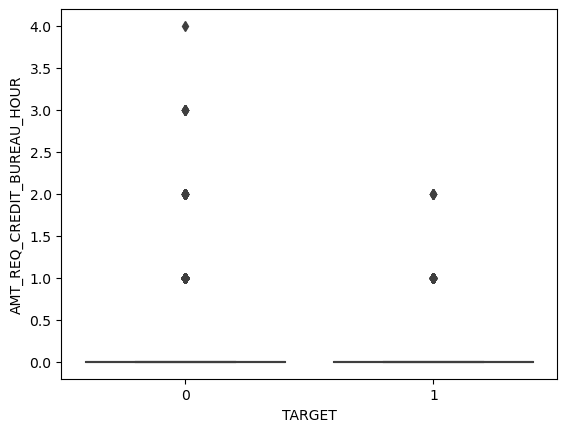

AMT_REQ_CREDIT_BUREAU_DAY Vs TARGET


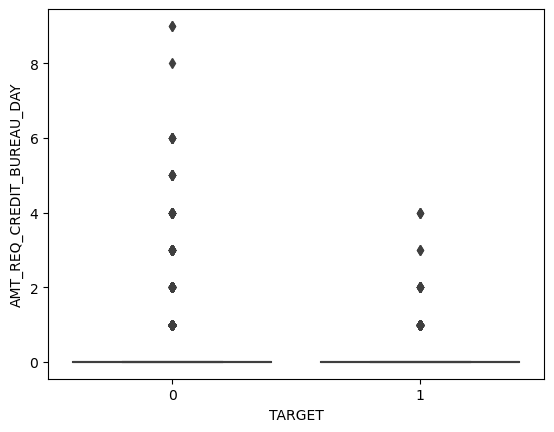

AMT_REQ_CREDIT_BUREAU_WEEK Vs TARGET


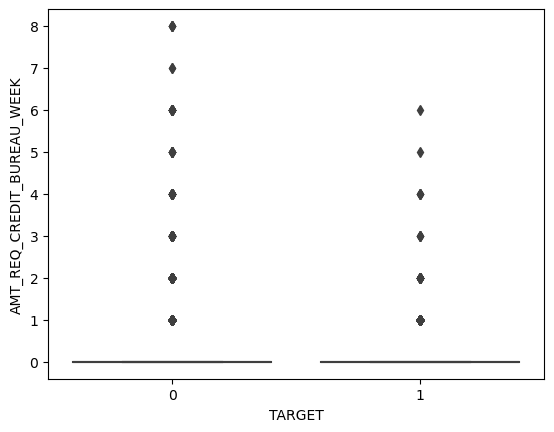

AMT_REQ_CREDIT_BUREAU_MON Vs TARGET


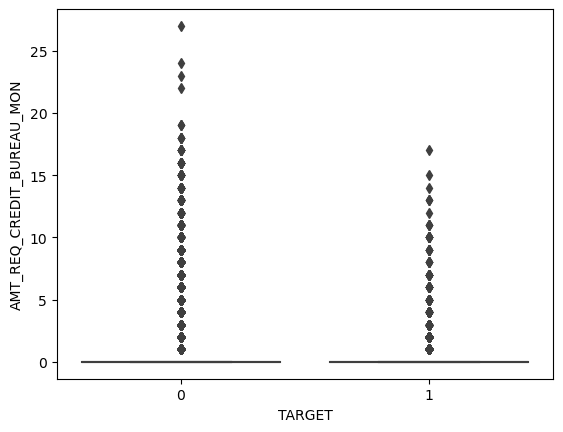

AMT_REQ_CREDIT_BUREAU_QRT Vs TARGET


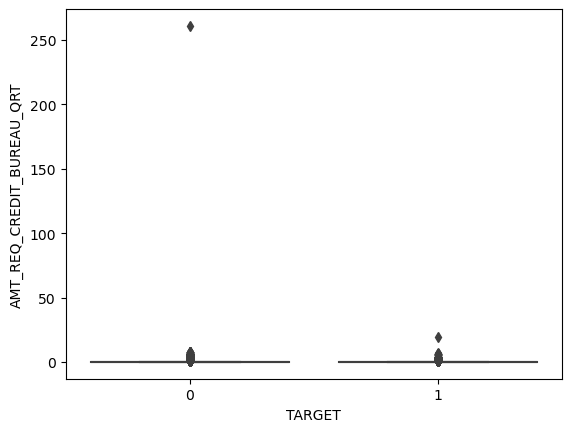

AMT_REQ_CREDIT_BUREAU_YEAR Vs TARGET


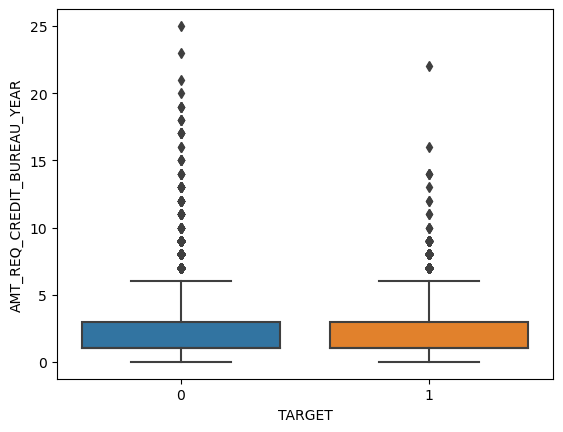

In [113]:
for i in float_cols_appdata:
    print(i,"Vs",'TARGET')
    sns.boxplot(y=df_ApplicationData[i],x=df_ApplicationData['TARGET'])
    plt.show()

### imp insights from bivariate analysis:
1. More the age more is the density in the loan payment. MIddle age around 50% of quartile shows the payment difficulty as well.
2. High range of annuity amount is reached by applicants who face no dificulty in payment.
3. Price of the goods for which loan is taken is showing same weightage for payment with difficulty and without difficulty.
4. applicant with EXT_SOURCE_2 score are more likely to pay loan without difficulty. 
5. Applicants living in more populated region show little more density towards loan payment.
6. REG_CITY_NOT_WORK_CITY Vs TARGET indicates that applicant with different permant address and work address have high density      for default.


## Multivariate Analysis for application data

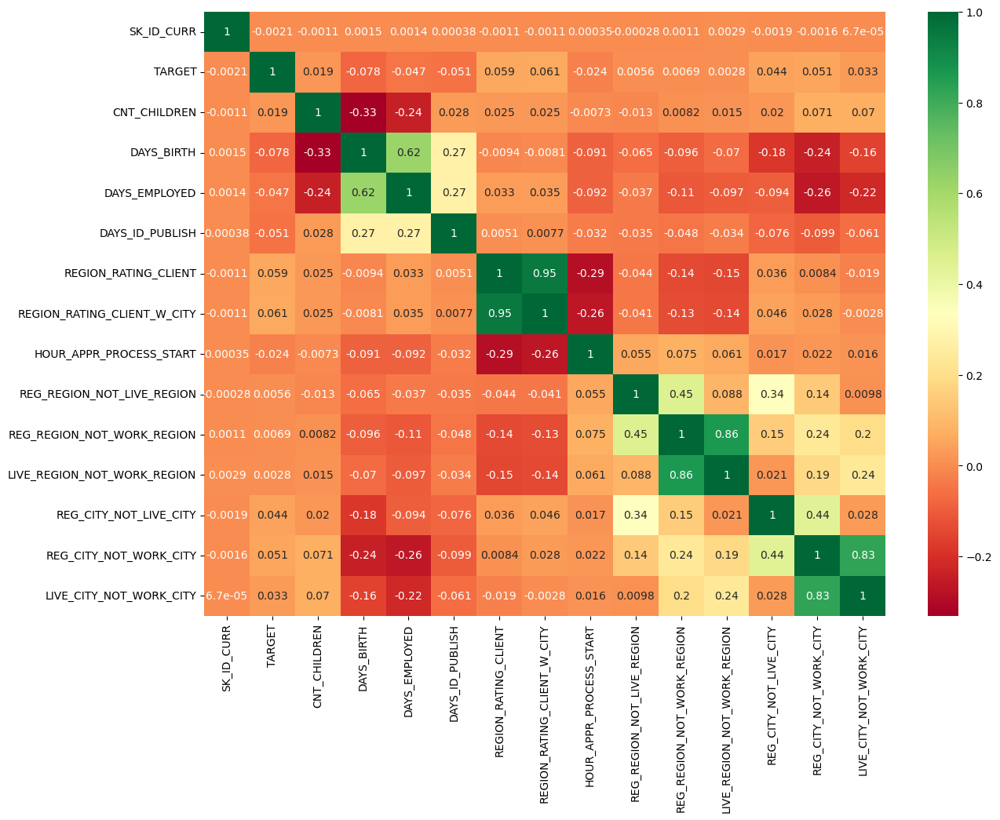

In [114]:
plt.figure(figsize=(14,10))
sns.heatmap(df_ApplicationData[int_cols_appdata].corr(),annot=True, cmap='RdYlGn')
plt.show()

### Insights from heatmap
##### We can notice strong positive linear relationship between
1. REGION_RATING_CLIENT  and  REGION_RATING_CLIENT_W_CITY
2. REG_REGION_NOT_WORK_REGION and LIVE_REGION_NOT_WORK_REGION
3. REG_CITY_NOT_WORK_CITY and LIVE_CITY_NOT_WORK_CITY

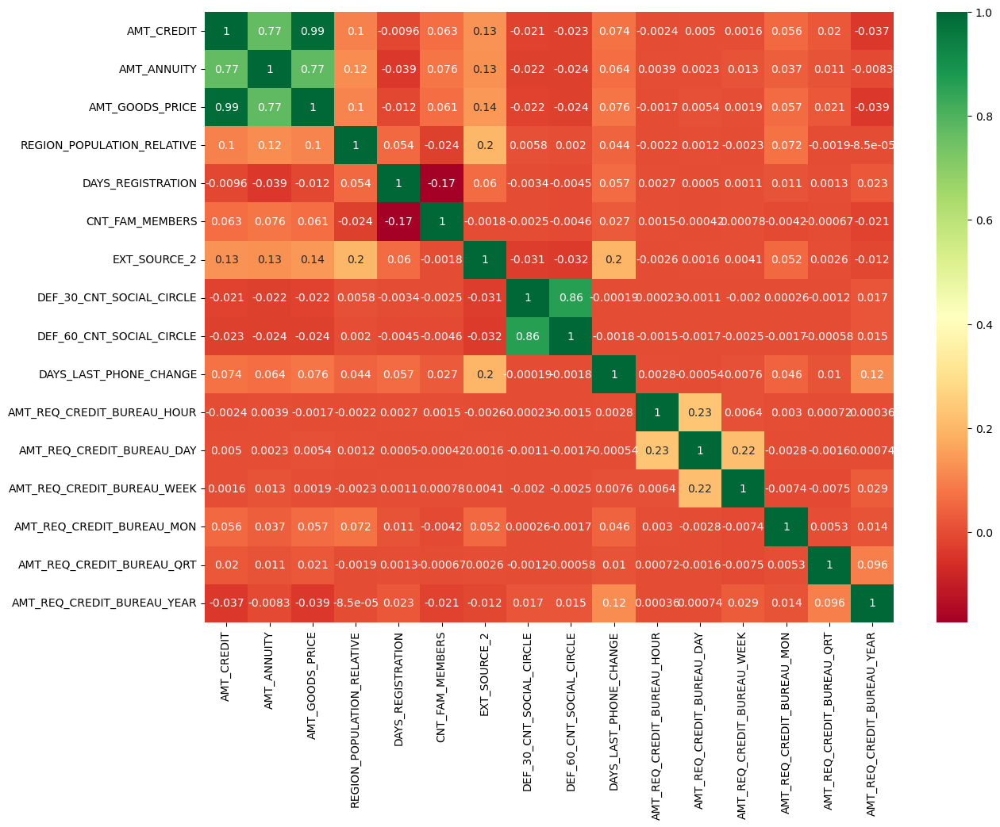

In [115]:
plt.figure(figsize=(14,10))
sns.heatmap(df_ApplicationData[float_cols_appdata].corr(),annot=True, cmap='RdYlGn')
plt.show()

### Insights from heatmap
##### We can notice strong positve linear relationship between
1. AMT_CREDIT  and  AMT_ANNUITY
2. AMT_ANNUITY and AMT_GOODS_PRICE
3. DEF_30_CNT_SOCIAL_CIRCLE and DEF_60_CNT_SOCIAL_CIRCLE

## Univariate Analysis for previous application data

In [116]:
#lets refresh all list in application data.
#check and re-assign to a list obj_cols_preAppdata.
obj_cols_preAppdata=[]
obj_cols_preAppdata=df_PrevApplication.columns[(df_PrevApplication.dtypes=='object') | (df_PrevApplication.dtypes=='category')].tolist()
print(obj_cols_preAppdata)

['NAME_CONTRACT_TYPE', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']


In [117]:
#check and re-assign to a list float_cols_preAppdata.
float_cols_preAppdata=[]
float_cols_preAppdata=df_PrevApplication.columns[df_PrevApplication.dtypes=='float64'].tolist()
print(float_cols_preAppdata)

['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'CNT_PAYMENT']


In [118]:
#check and re-assign to a list int_cols_preAppdata.
int_cols_preAppdata=[]
int_cols_preAppdata=df_PrevApplication.columns[(df_PrevApplication.dtypes=='int64') | (df_PrevApplication.dtypes=='int32')].tolist()
print(int_cols_preAppdata)

['SK_ID_PREV', 'SK_ID_CURR', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'DAYS_DECISION']


### Categorical variables

In [119]:
#see the percentage wise distribution of categories in each columns of object datatype.
# we already made a list of variable of object type.
for i in obj_cols_preAppdata:
    print(df_PrevApplication[i].value_counts(normalize=True)*100)
    print('=======================================')

Cash loans         44.757917
Consumer loans     43.656142
Revolving loans    11.565225
XNA                 0.020716
Name: NAME_CONTRACT_TYPE, dtype: float64
Y    99.49258
N     0.50742
Name: FLAG_LAST_APPL_PER_CONTRACT, dtype: float64
XAP                                 55.242083
XNA                                 40.588691
Repairs                              1.422872
Other                                0.934491
Urgent needs                         0.503648
Buying a used car                    0.172912
Building a house or an annex         0.161237
Everyday expenses                    0.144652
Medicine                             0.130163
Payments on other loans              0.115614
Education                            0.094180
Journey                              0.074182
Purchase of electronic equipment     0.063525
Buying a new car                     0.060591
Wedding / gift / holiday             0.057597
Buying a home                        0.051790
Car repairs                  

Countplot of NAME_CONTRACT_TYPE


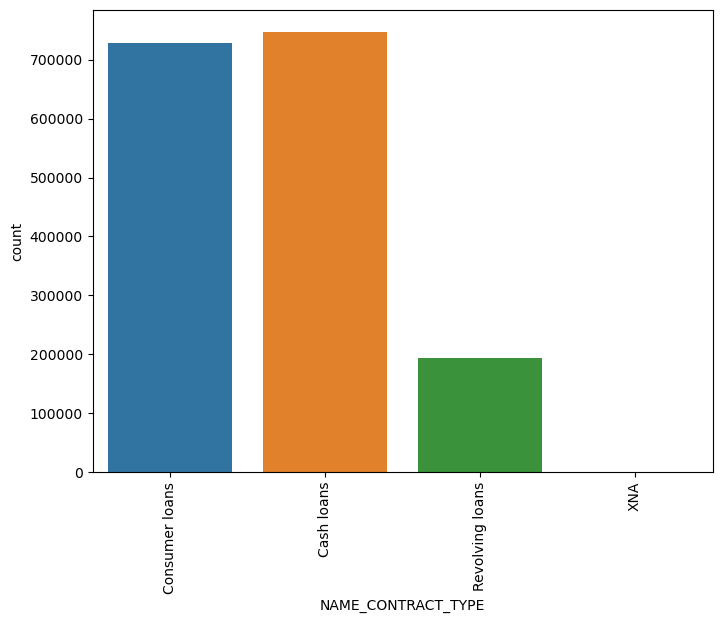

Countplot of FLAG_LAST_APPL_PER_CONTRACT


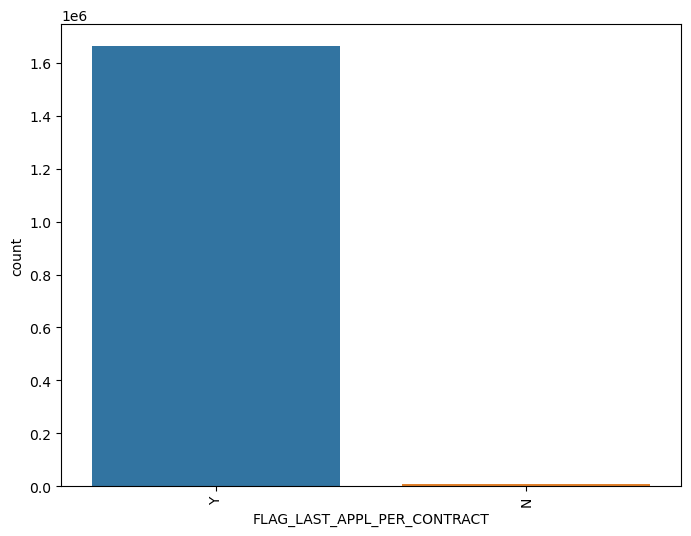

Countplot of NAME_CASH_LOAN_PURPOSE


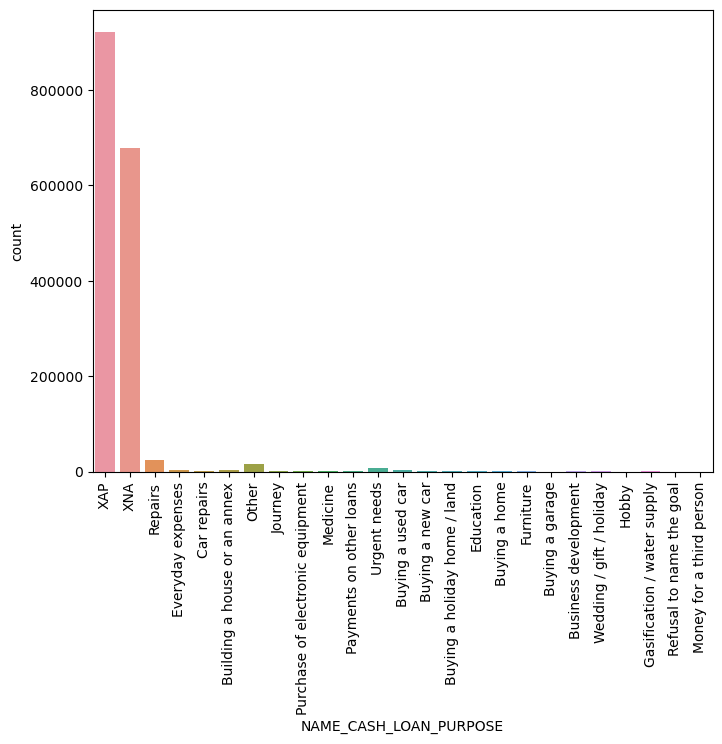

Countplot of NAME_CONTRACT_STATUS


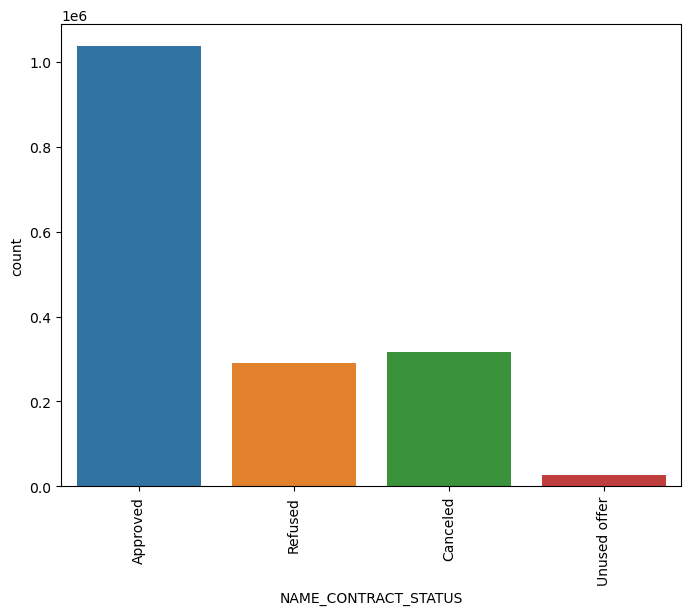

Countplot of NAME_PAYMENT_TYPE


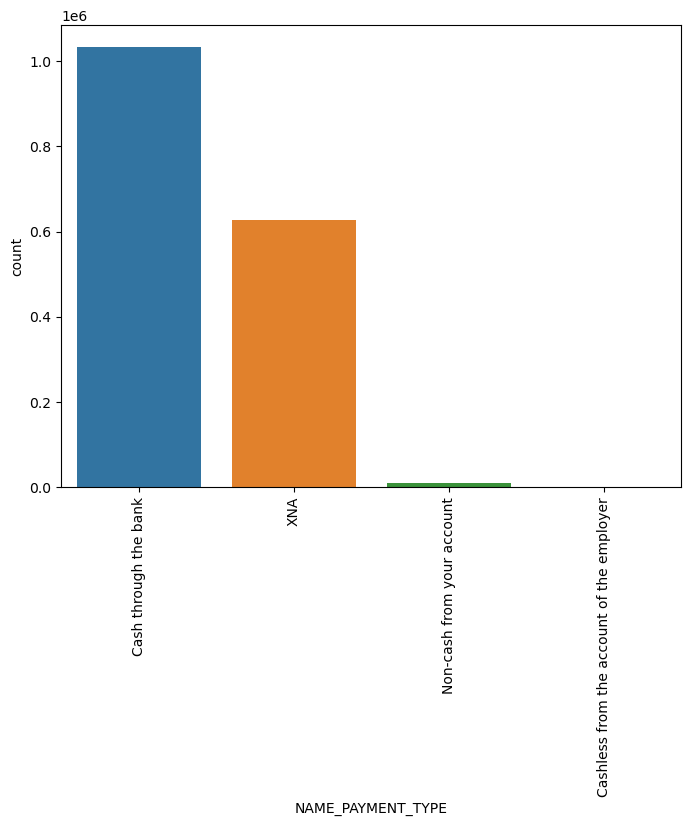

Countplot of CODE_REJECT_REASON


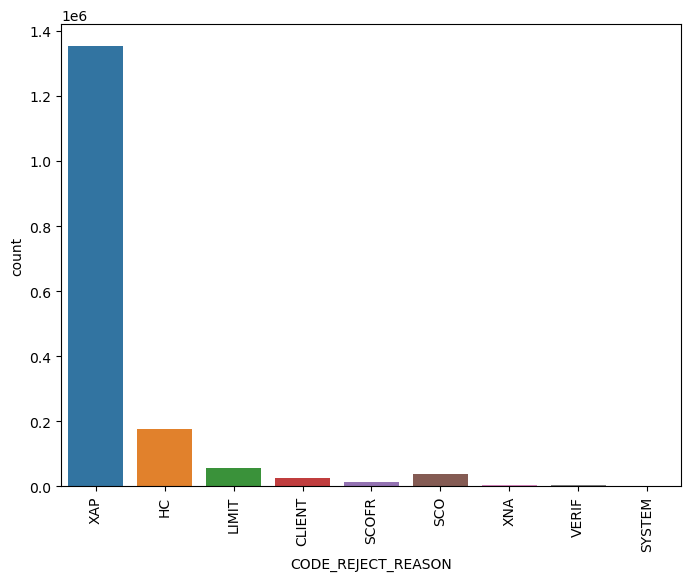

Countplot of NAME_CLIENT_TYPE


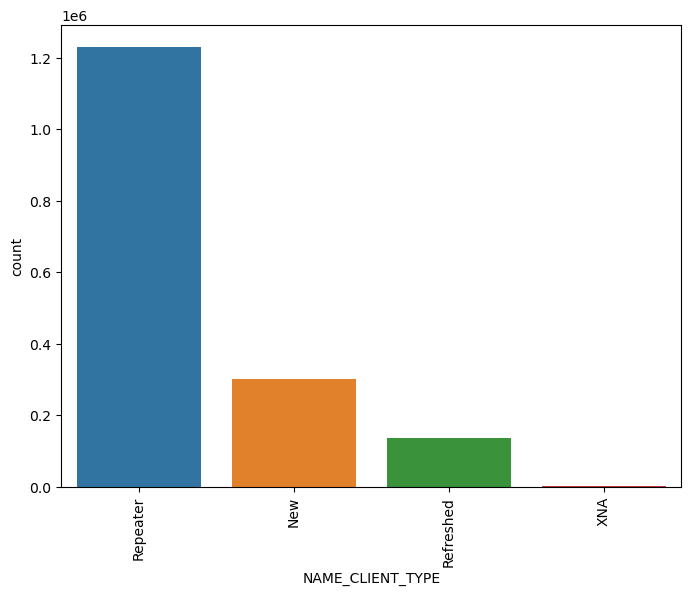

Countplot of NAME_GOODS_CATEGORY


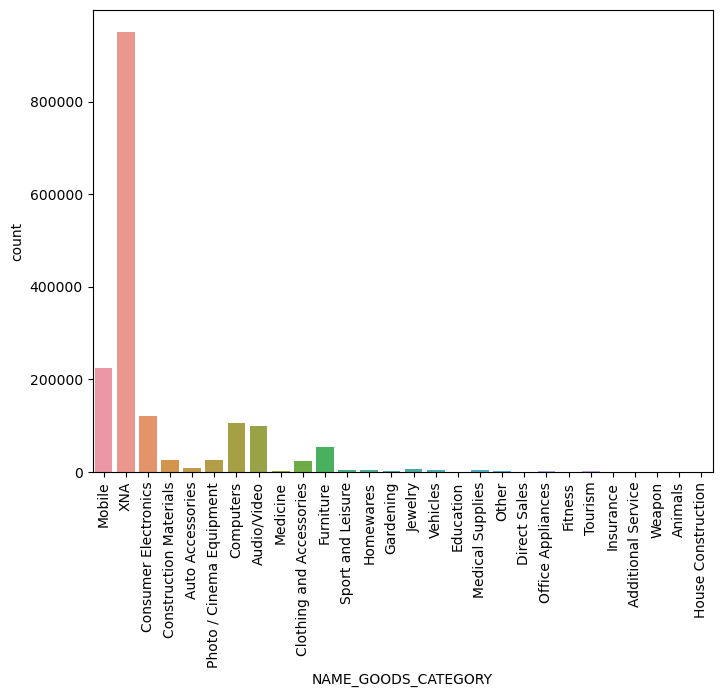

Countplot of NAME_PORTFOLIO


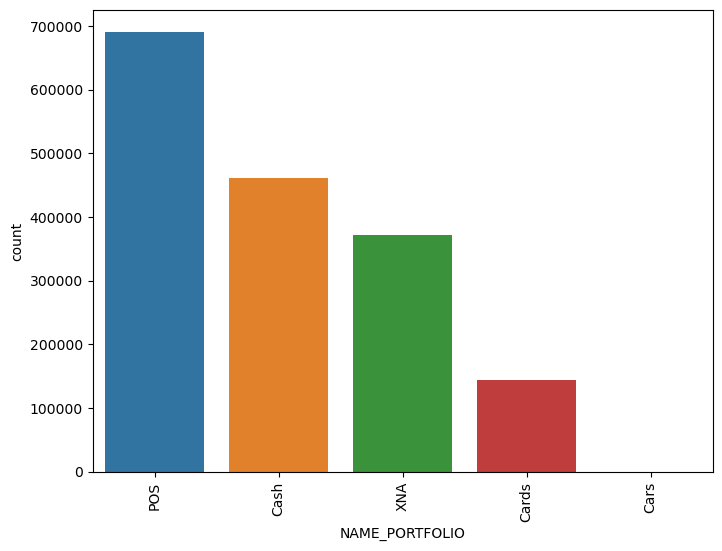

Countplot of NAME_PRODUCT_TYPE


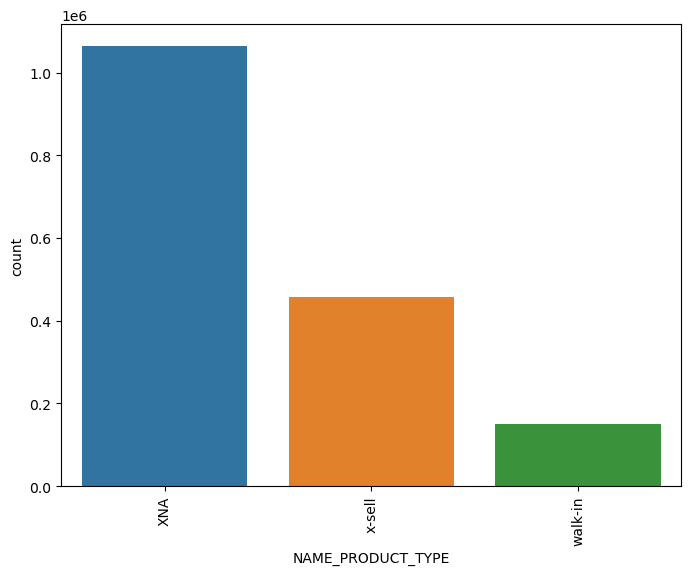

Countplot of CHANNEL_TYPE


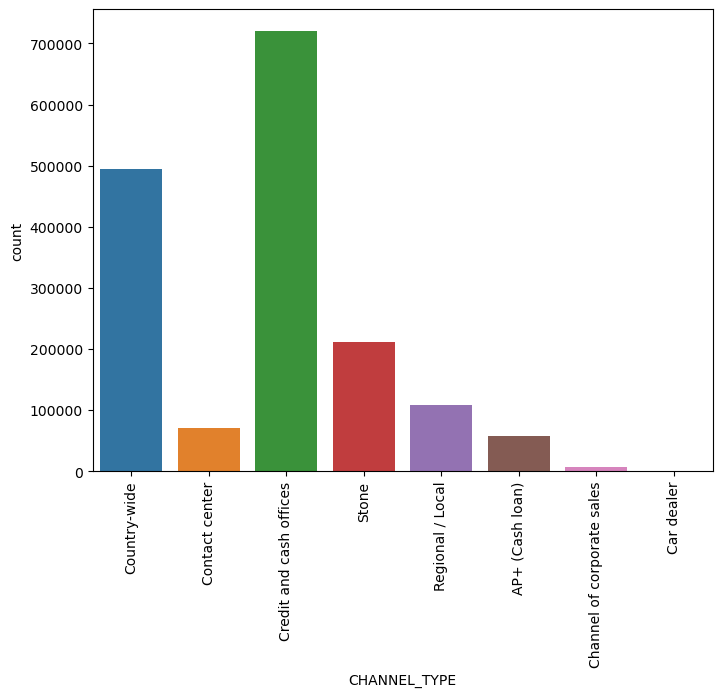

Countplot of NAME_SELLER_INDUSTRY


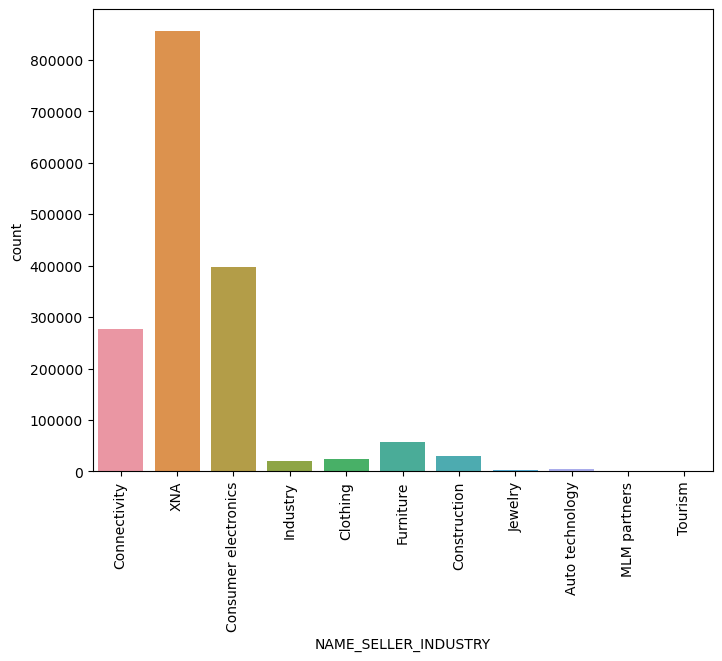

Countplot of NAME_YIELD_GROUP


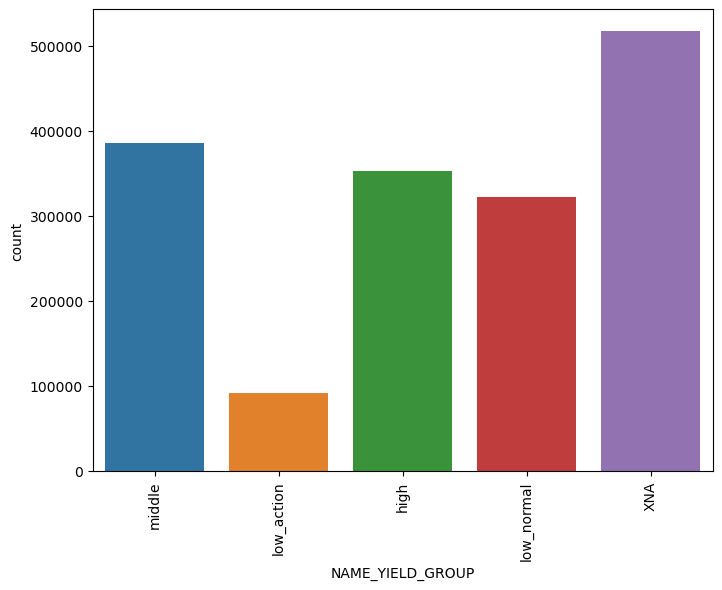

Countplot of PRODUCT_COMBINATION


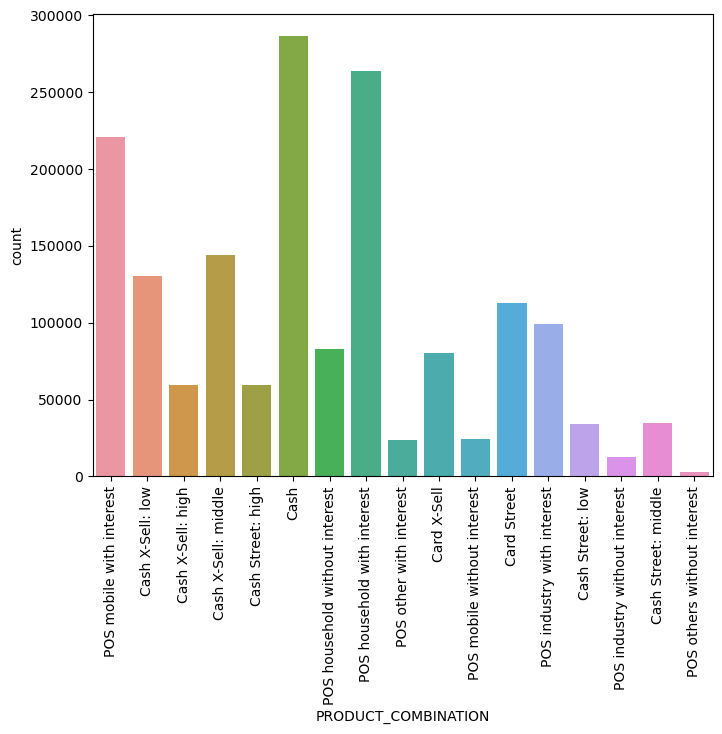

In [120]:
#let's plot count plot for the object type variables.
for i in obj_cols_preAppdata:
    print("Countplot of",i)
    plt.figure(figsize=(8,6))
    sns.countplot(x=df_PrevApplication[i])
    plt.xticks(rotation=90)
    plt.show()

### Insight for above countplot
1. Previous application data has majority of applicants(44%,43%) applying for Consumer and cash loans.
2. 99% of applicants had this as the last contract. They didn't applied for any new loan in between.
3. Data related to loan purpose of the applicants is not taken properly.
4. 62% of loans are sanctioned and the rest are rejected/refused.
5. 61% of payment is done via cash. There is a huge percentage of XNA which means data is missing it seems or not shared by    applicant.
6. 80% of Loan rejection reason is not specified.
7. 73% of applicants were already a customer this indicates the trust between bank and the applicants.
8. 41% of applicants applied for previous loan is for POS.
9. Credit and cash offices are the main channels used for previous loans.
10. Product combination of the previous application has many categories out of which the cash has most % with 17%. 

### Numerical Variables

Boxplot of AMT_ANNUITY


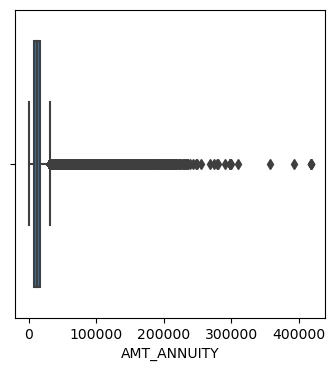

Boxplot of AMT_APPLICATION


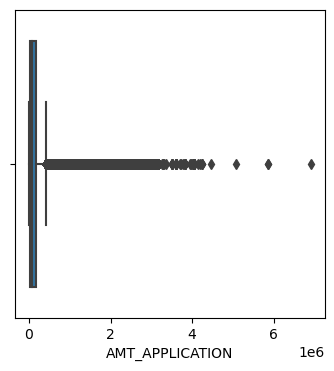

Boxplot of AMT_CREDIT


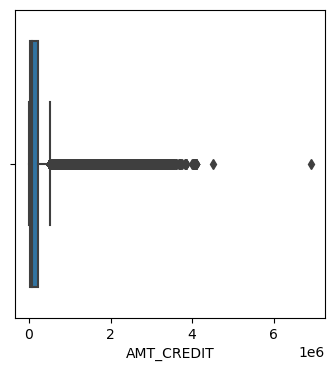

Boxplot of AMT_GOODS_PRICE


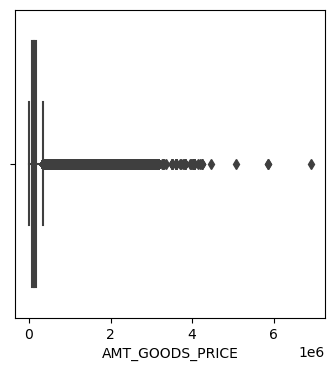

Boxplot of CNT_PAYMENT


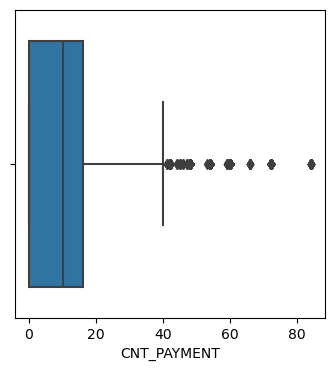

In [121]:
for i in float_cols_preAppdata:
    plt.figure(figsize=(4,4))
    print("Boxplot of",i)
    sns.boxplot(x=df_PrevApplication[i])
    plt.show()

Boxplot of SK_ID_PREV


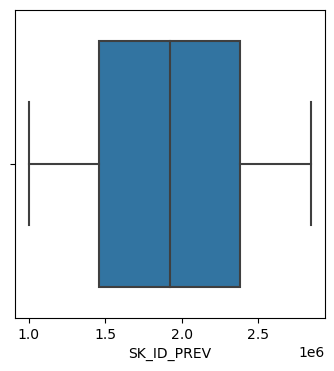

Boxplot of SK_ID_CURR


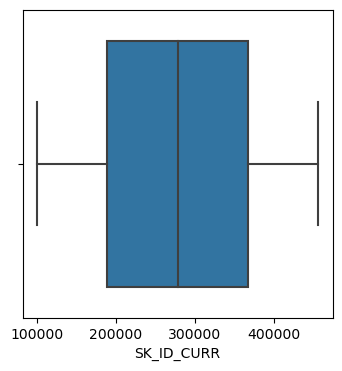

Boxplot of HOUR_APPR_PROCESS_START


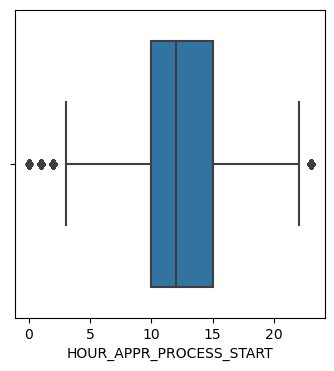

Boxplot of NFLAG_LAST_APPL_IN_DAY


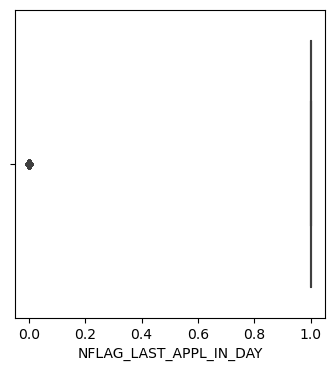

Boxplot of DAYS_DECISION


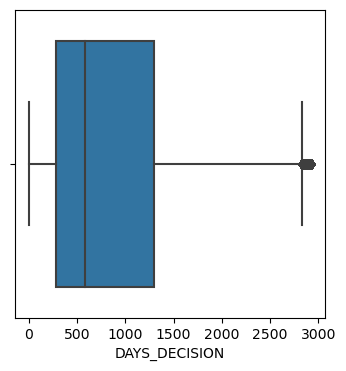

In [122]:
for i in int_cols_preAppdata:
    plt.figure(figsize=(4,4))
    print("Boxplot of",i)
    sns.boxplot(x=df_PrevApplication[i])
    plt.show()

Histplot of AMT_ANNUITY


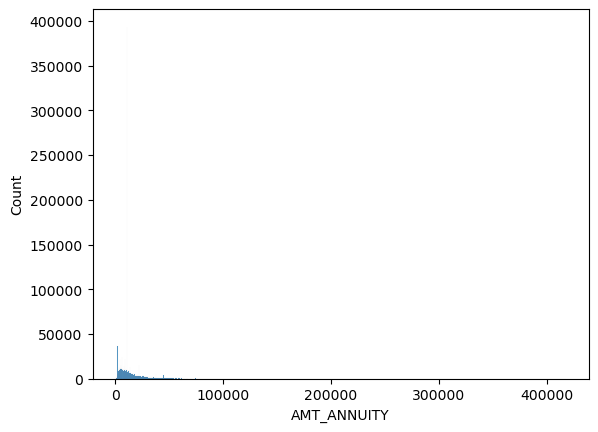

Histplot of AMT_APPLICATION


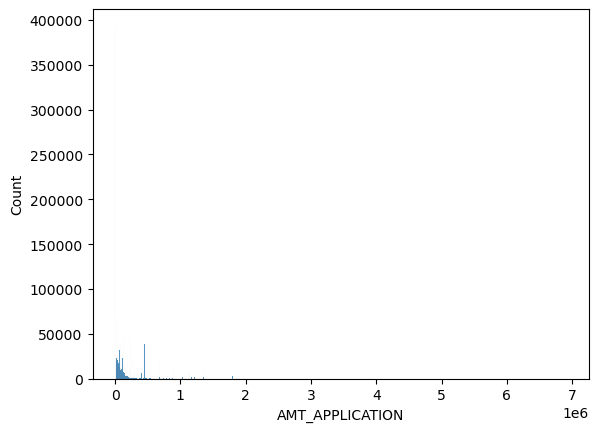

Histplot of AMT_CREDIT


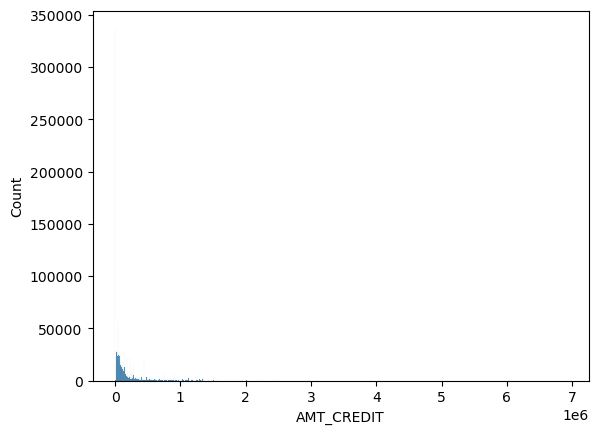

Histplot of AMT_GOODS_PRICE


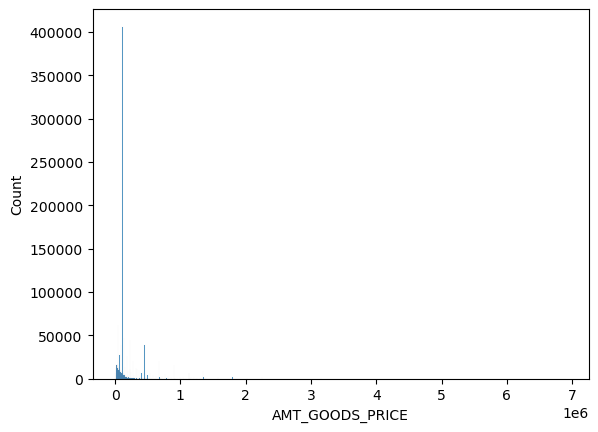

Histplot of CNT_PAYMENT


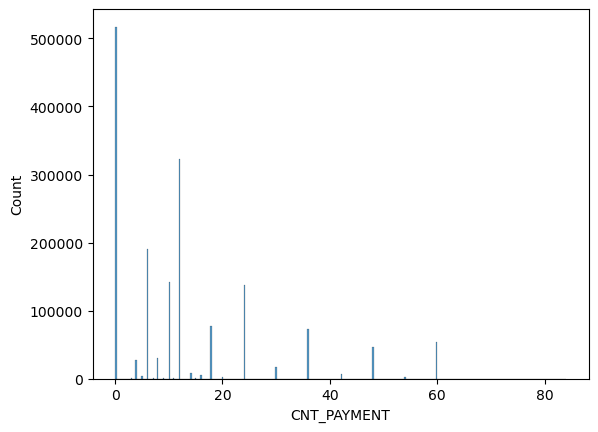

In [123]:
for i in float_cols_preAppdata:
    print("Histplot of",i)
    sns.histplot(x=df_PrevApplication[i])
    plt.show()

Histplot of SK_ID_PREV


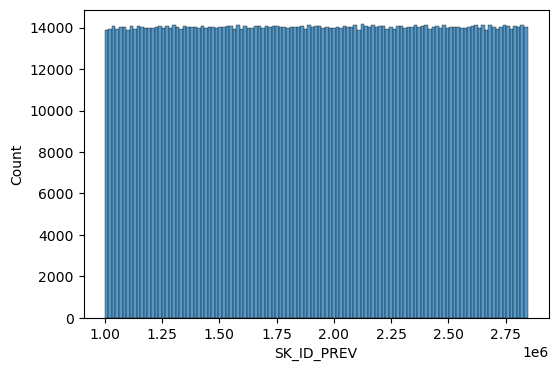

Histplot of SK_ID_CURR


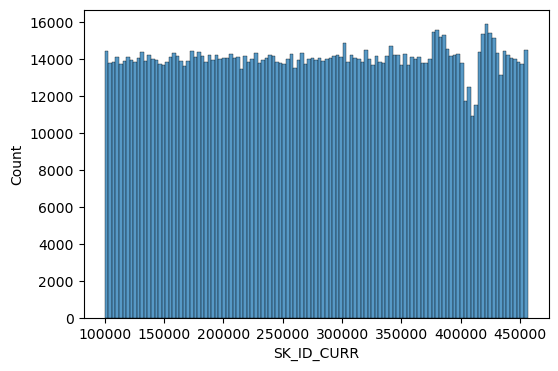

Histplot of HOUR_APPR_PROCESS_START


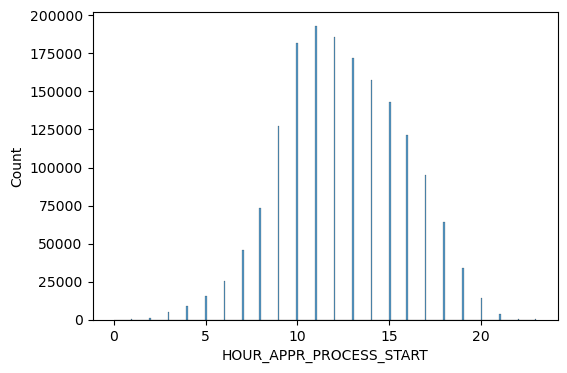

Histplot of NFLAG_LAST_APPL_IN_DAY


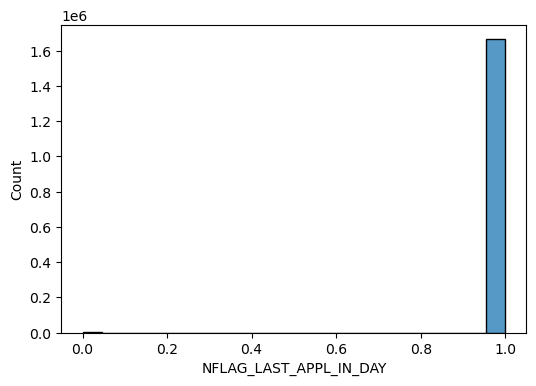

Histplot of DAYS_DECISION


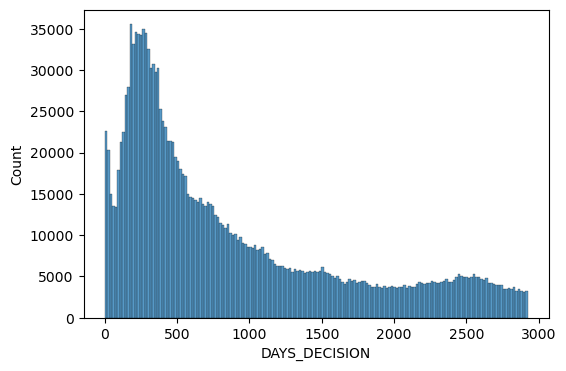

In [124]:
for i in int_cols_preAppdata:
    plt.figure(figsize=(6,4))
    print("Histplot of",i)
    sns.histplot(x=df_PrevApplication[i])
    plt.show()

### Insights from above numerical datatype
1. We can observe the oultliers in AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE.
2. AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE have skewed graph indicating the outliers,they have strong correlation as well.
3. HOUR_APPR_PROCESS_START has a normaldistributed graph.

## Bivariate analysis

NAME_CONTRACT_TYPE Vs SK_ID_PREV


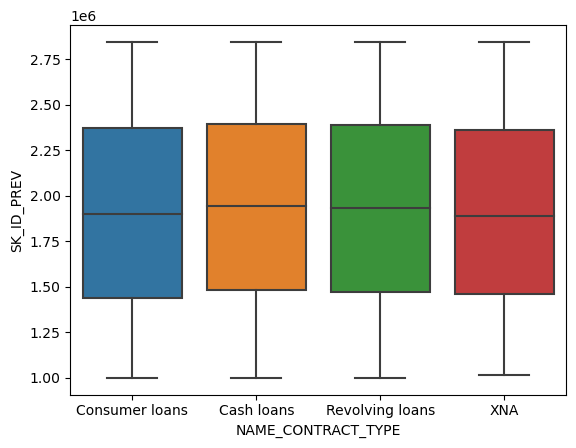

NAME_CONTRACT_TYPE Vs SK_ID_CURR


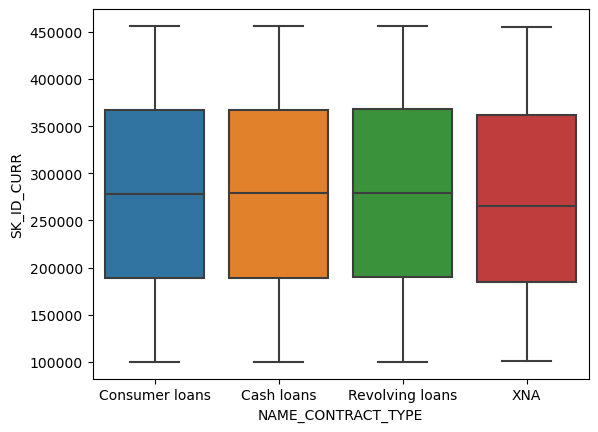

NAME_CONTRACT_TYPE Vs HOUR_APPR_PROCESS_START


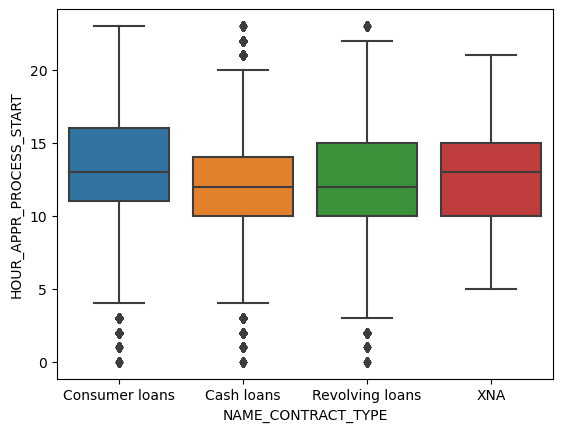

NAME_CONTRACT_TYPE Vs NFLAG_LAST_APPL_IN_DAY


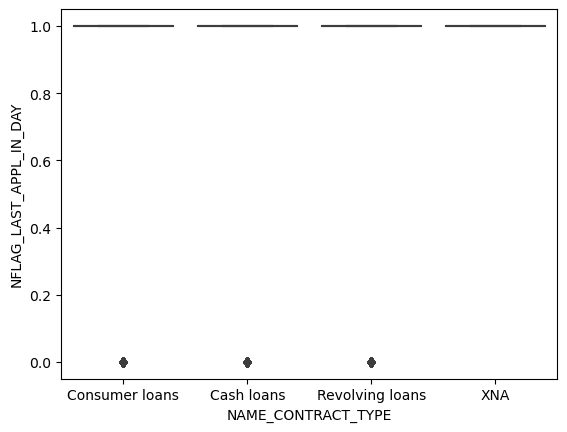

NAME_CONTRACT_TYPE Vs DAYS_DECISION


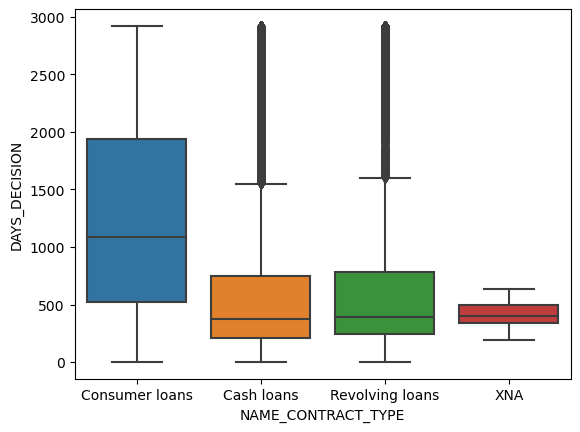

FLAG_LAST_APPL_PER_CONTRACT Vs SK_ID_PREV


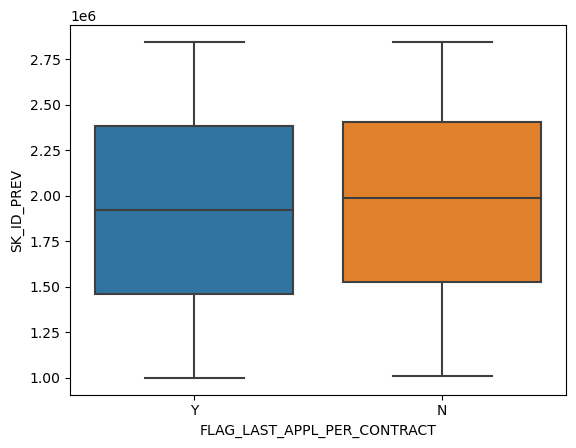

FLAG_LAST_APPL_PER_CONTRACT Vs SK_ID_CURR


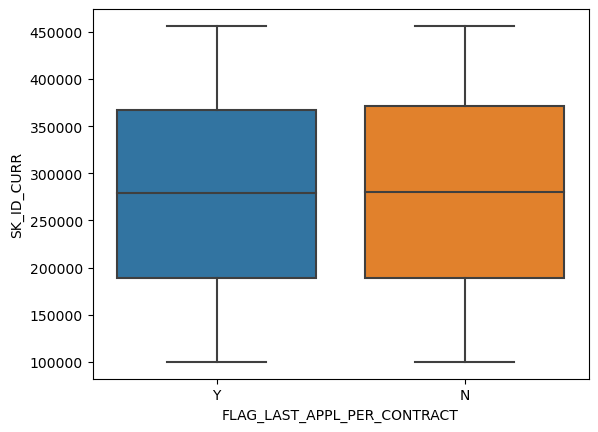

FLAG_LAST_APPL_PER_CONTRACT Vs HOUR_APPR_PROCESS_START


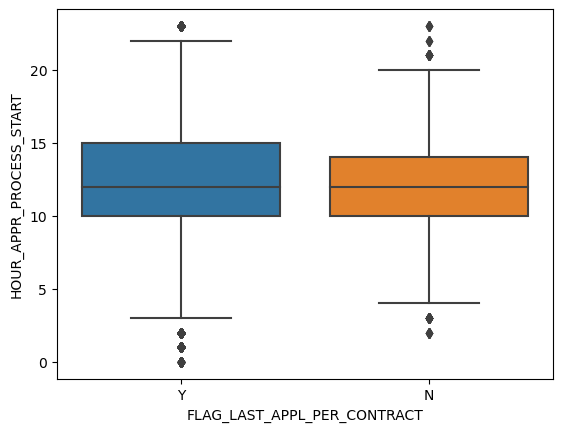

FLAG_LAST_APPL_PER_CONTRACT Vs NFLAG_LAST_APPL_IN_DAY


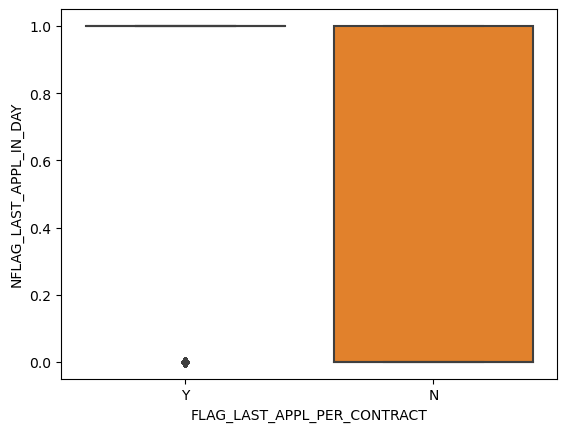

FLAG_LAST_APPL_PER_CONTRACT Vs DAYS_DECISION


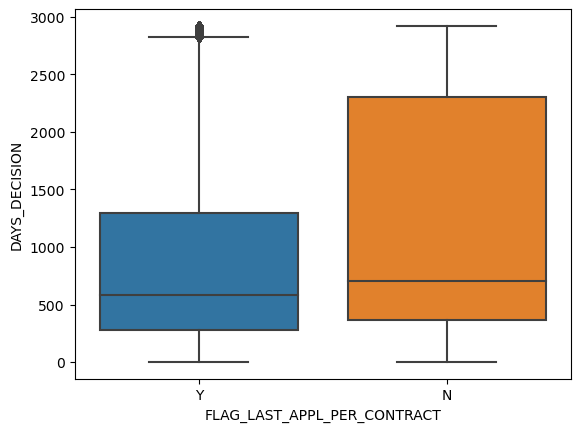

NAME_CASH_LOAN_PURPOSE Vs SK_ID_PREV


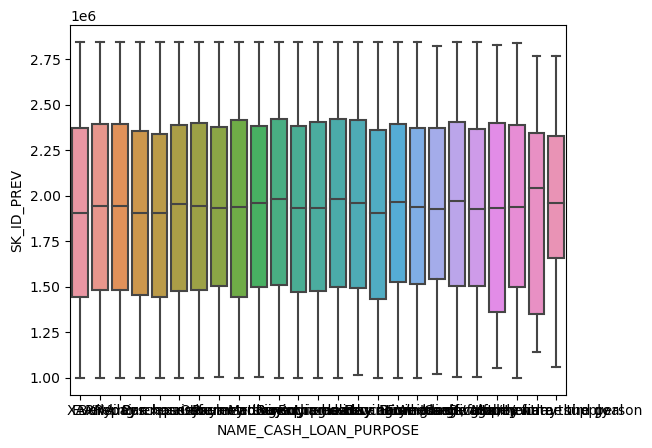

NAME_CASH_LOAN_PURPOSE Vs SK_ID_CURR


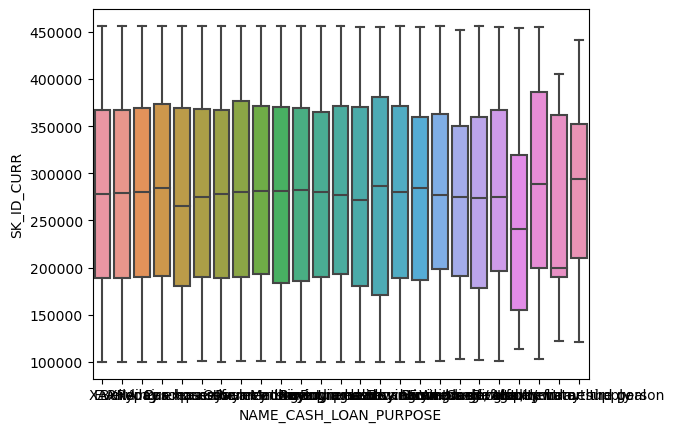

NAME_CASH_LOAN_PURPOSE Vs HOUR_APPR_PROCESS_START


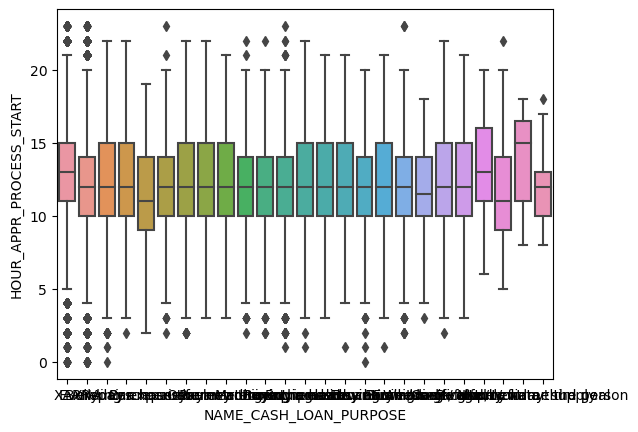

NAME_CASH_LOAN_PURPOSE Vs NFLAG_LAST_APPL_IN_DAY


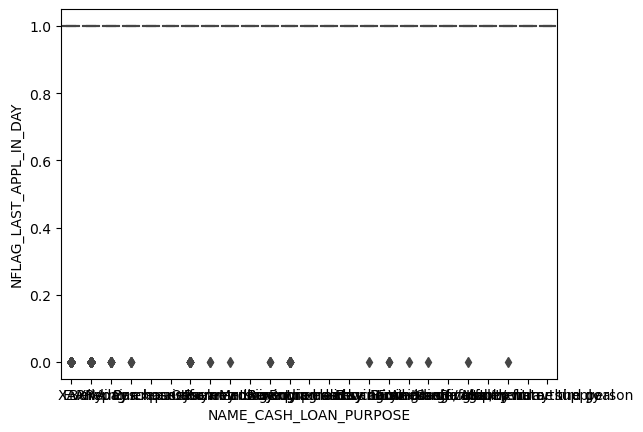

NAME_CASH_LOAN_PURPOSE Vs DAYS_DECISION


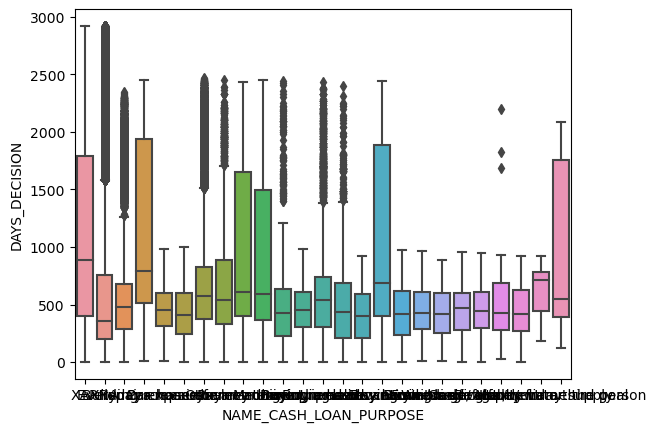

NAME_CONTRACT_STATUS Vs SK_ID_PREV


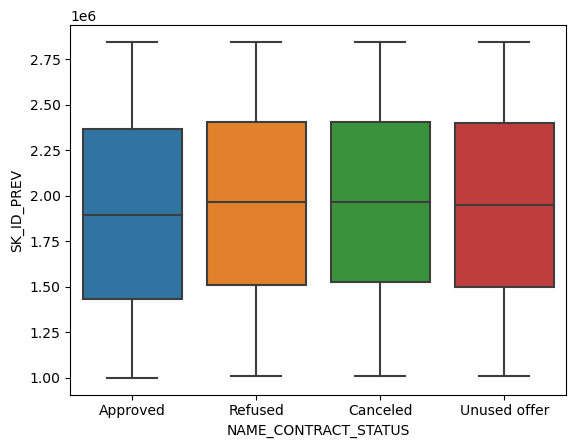

NAME_CONTRACT_STATUS Vs SK_ID_CURR


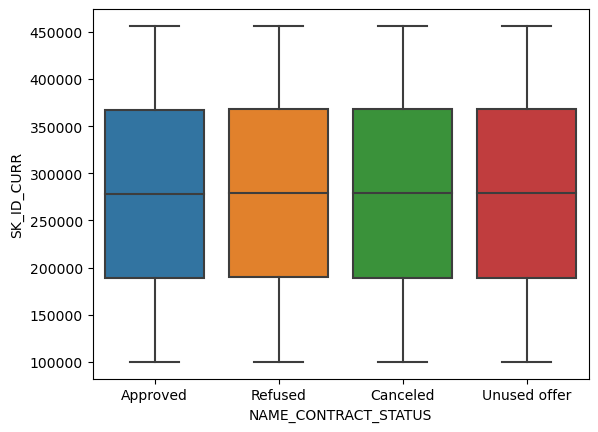

NAME_CONTRACT_STATUS Vs HOUR_APPR_PROCESS_START


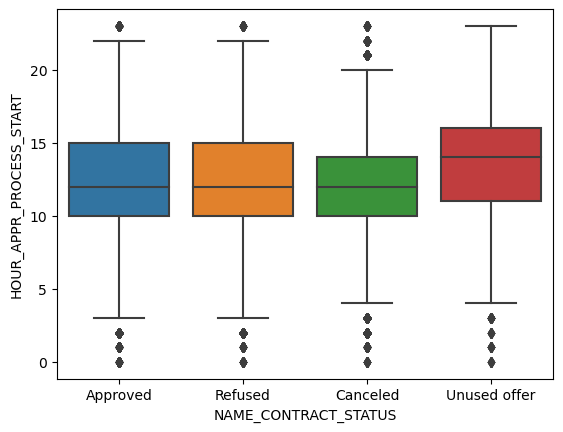

NAME_CONTRACT_STATUS Vs NFLAG_LAST_APPL_IN_DAY


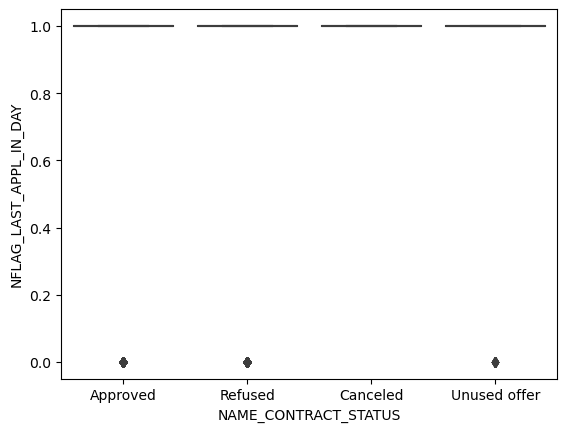

NAME_CONTRACT_STATUS Vs DAYS_DECISION


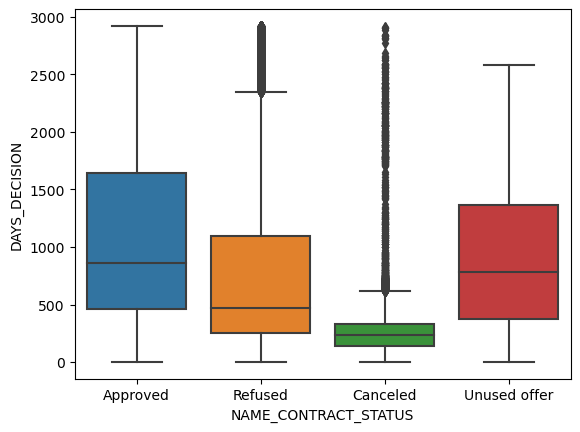

NAME_PAYMENT_TYPE Vs SK_ID_PREV


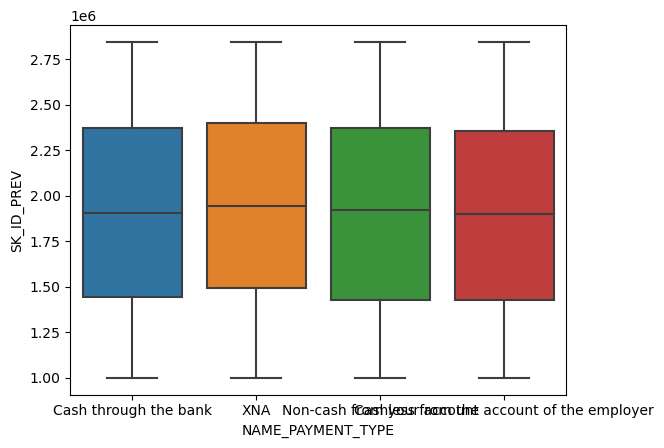

NAME_PAYMENT_TYPE Vs SK_ID_CURR


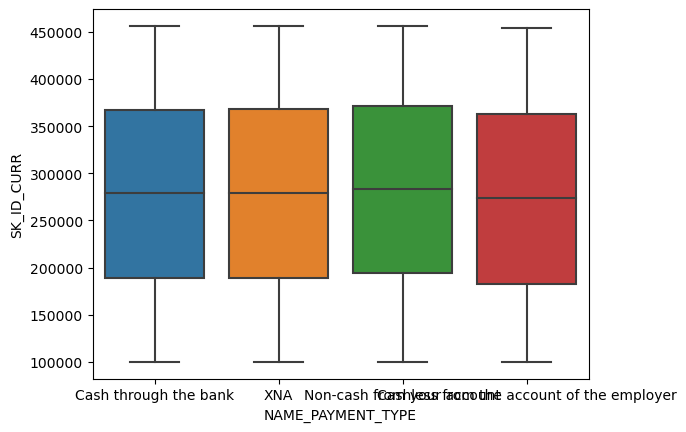

NAME_PAYMENT_TYPE Vs HOUR_APPR_PROCESS_START


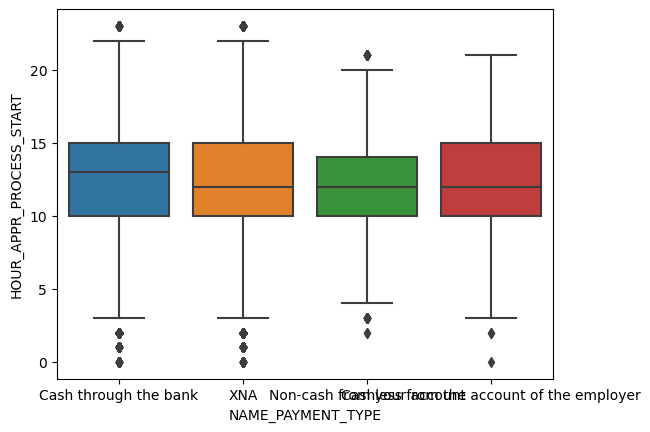

NAME_PAYMENT_TYPE Vs NFLAG_LAST_APPL_IN_DAY


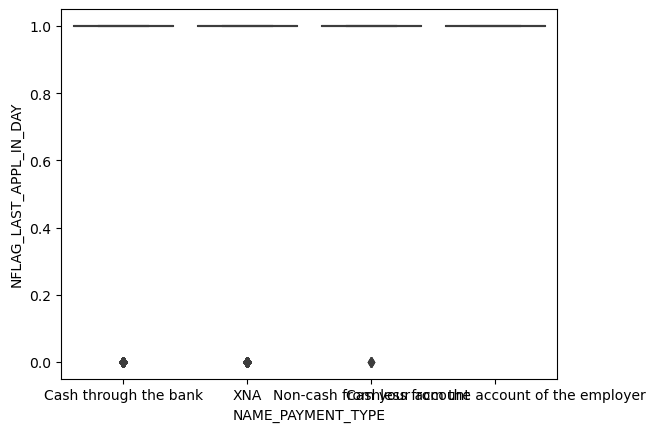

NAME_PAYMENT_TYPE Vs DAYS_DECISION


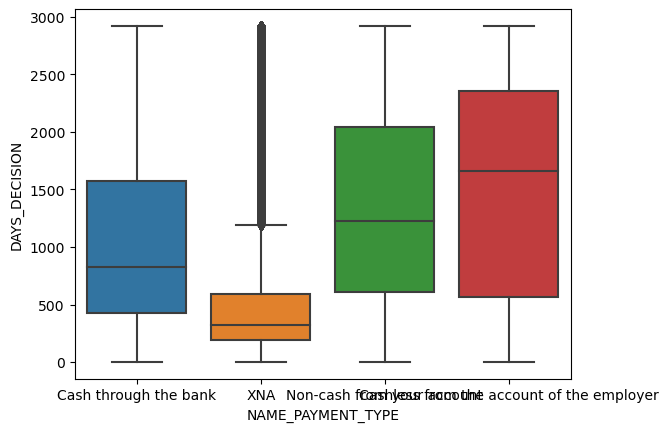

CODE_REJECT_REASON Vs SK_ID_PREV


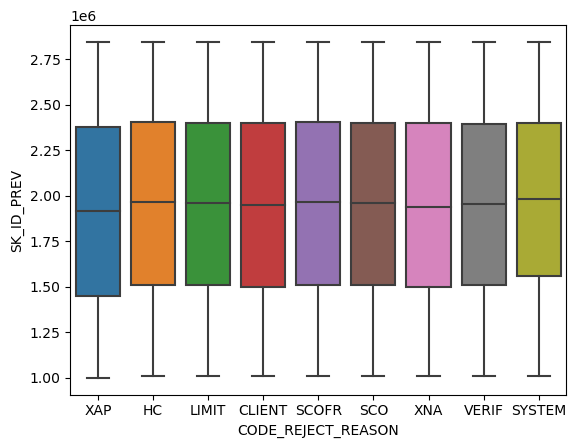

CODE_REJECT_REASON Vs SK_ID_CURR


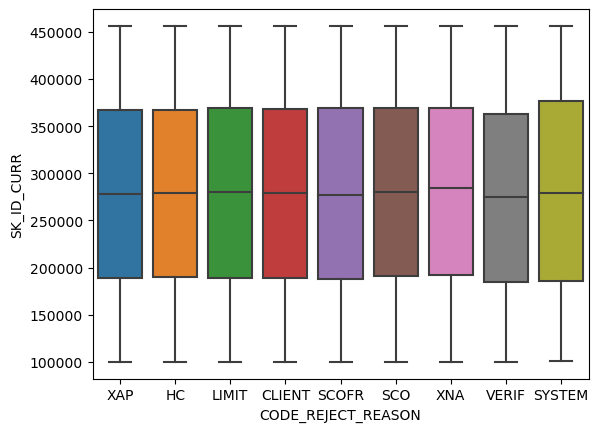

CODE_REJECT_REASON Vs HOUR_APPR_PROCESS_START


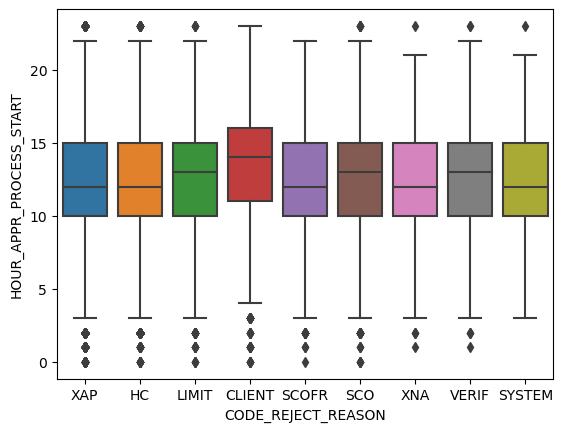

CODE_REJECT_REASON Vs NFLAG_LAST_APPL_IN_DAY


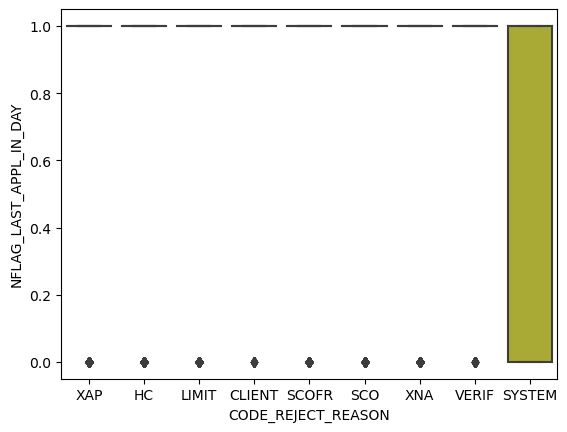

CODE_REJECT_REASON Vs DAYS_DECISION


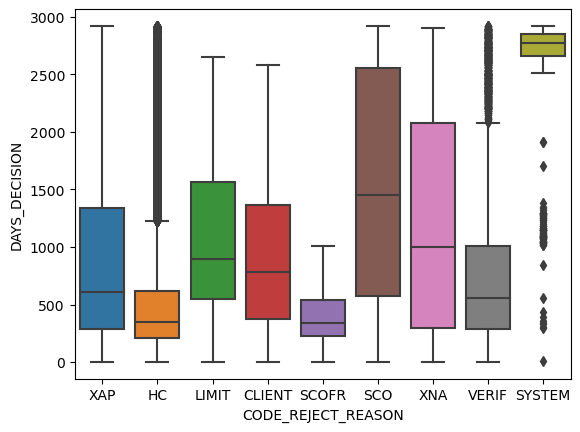

NAME_CLIENT_TYPE Vs SK_ID_PREV


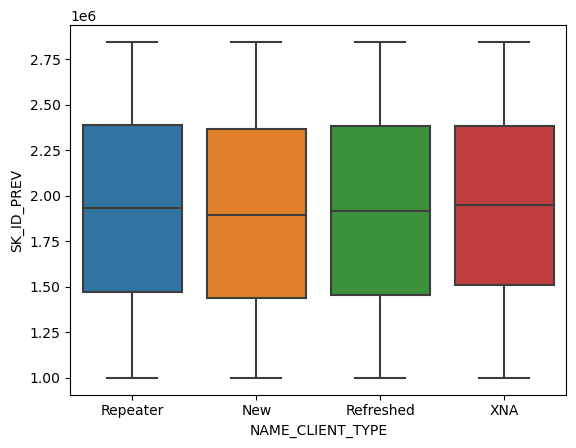

NAME_CLIENT_TYPE Vs SK_ID_CURR


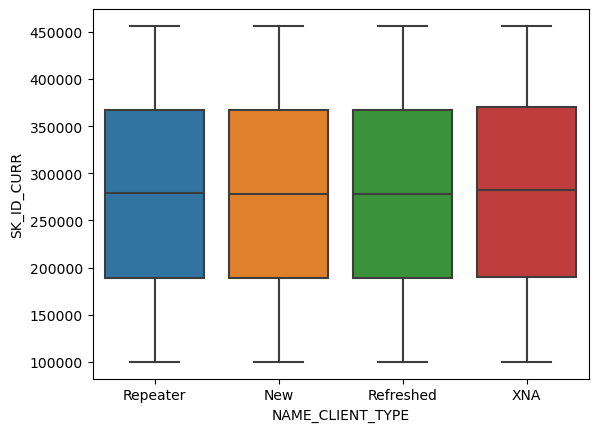

NAME_CLIENT_TYPE Vs HOUR_APPR_PROCESS_START


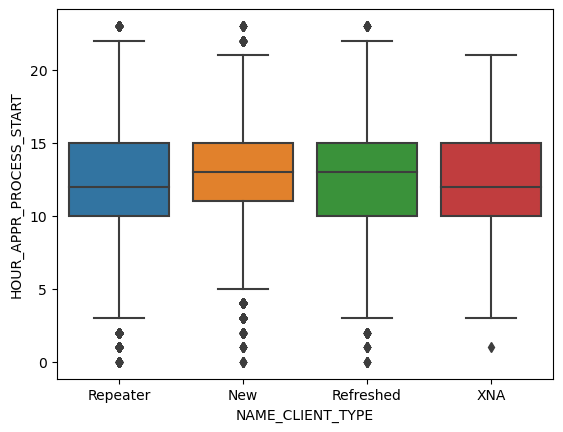

NAME_CLIENT_TYPE Vs NFLAG_LAST_APPL_IN_DAY


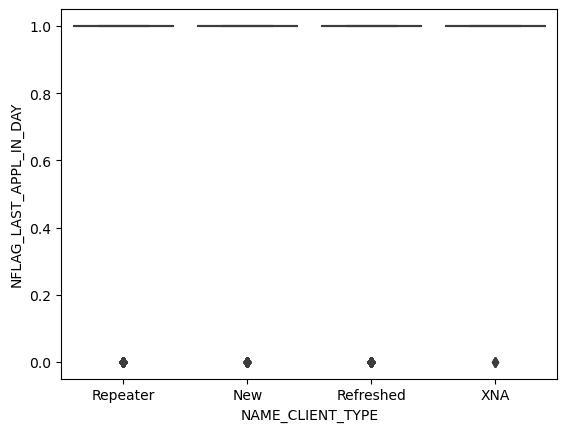

NAME_CLIENT_TYPE Vs DAYS_DECISION


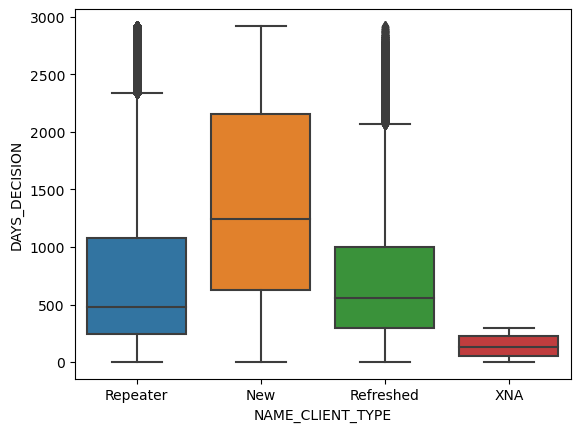

NAME_GOODS_CATEGORY Vs SK_ID_PREV


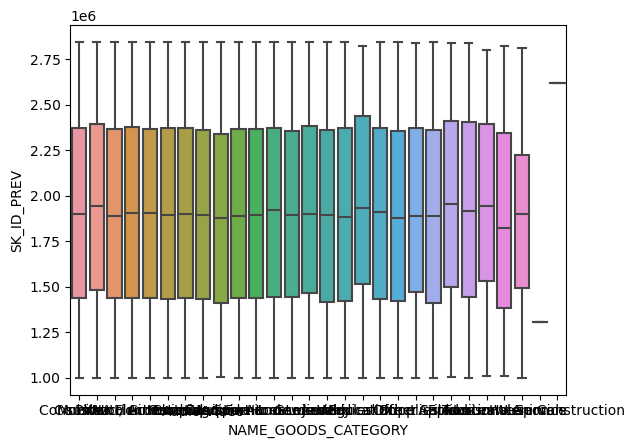

NAME_GOODS_CATEGORY Vs SK_ID_CURR


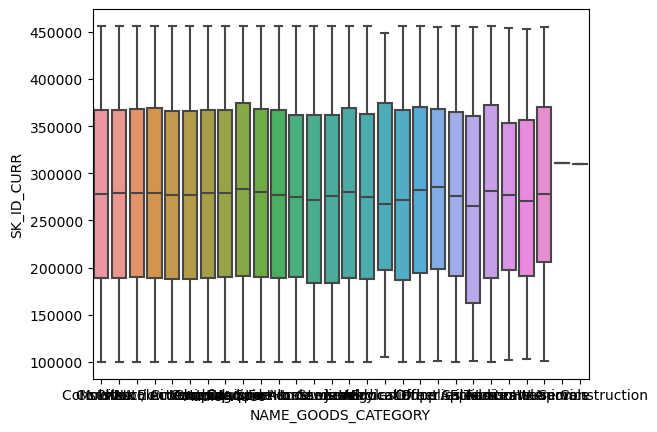

NAME_GOODS_CATEGORY Vs HOUR_APPR_PROCESS_START


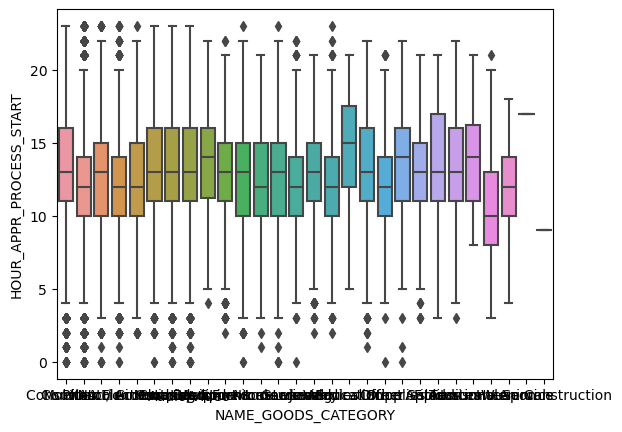

NAME_GOODS_CATEGORY Vs NFLAG_LAST_APPL_IN_DAY


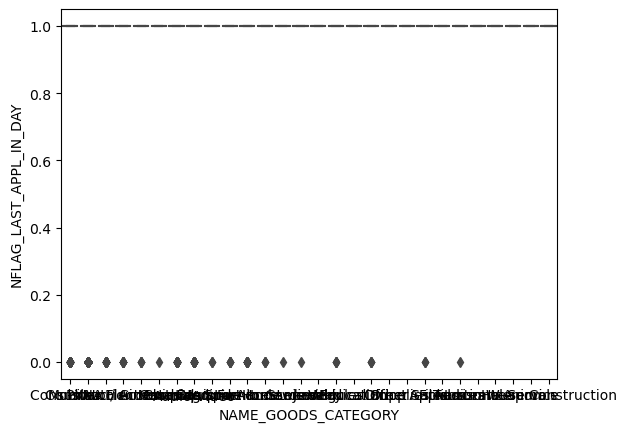

NAME_GOODS_CATEGORY Vs DAYS_DECISION


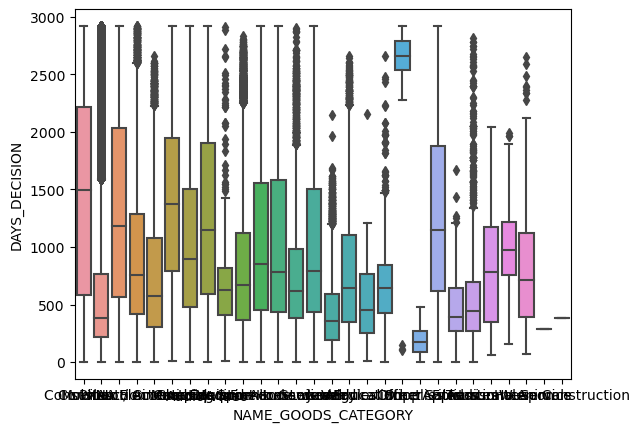

NAME_PORTFOLIO Vs SK_ID_PREV


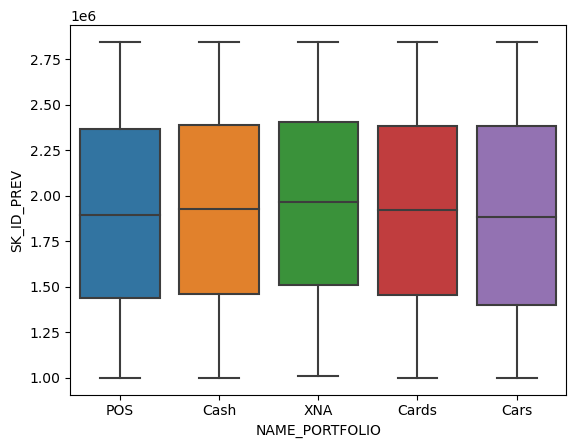

NAME_PORTFOLIO Vs SK_ID_CURR


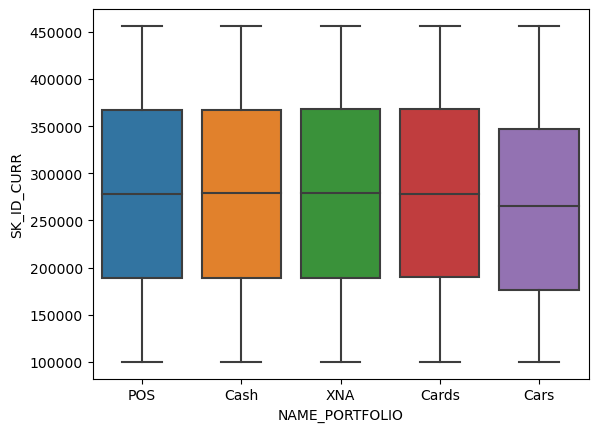

NAME_PORTFOLIO Vs HOUR_APPR_PROCESS_START


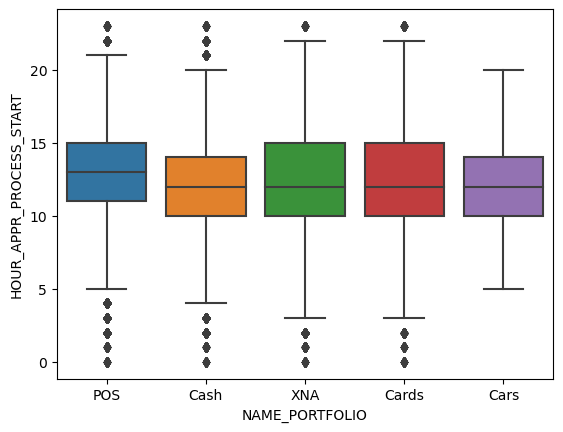

NAME_PORTFOLIO Vs NFLAG_LAST_APPL_IN_DAY


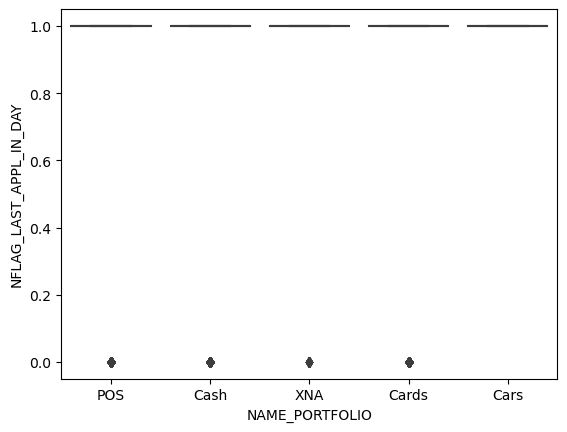

NAME_PORTFOLIO Vs DAYS_DECISION


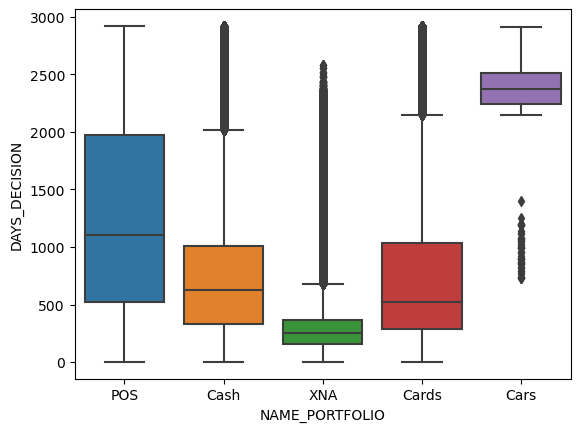

NAME_PRODUCT_TYPE Vs SK_ID_PREV


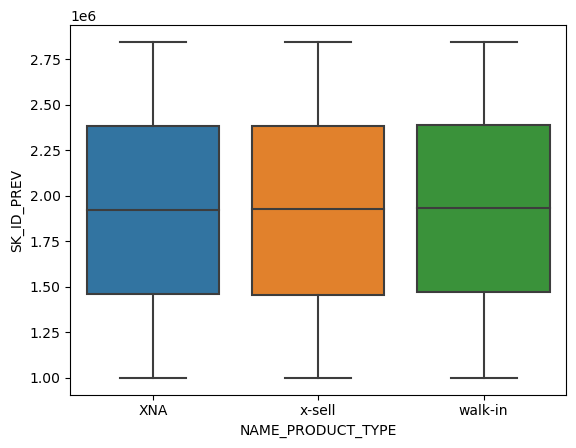

NAME_PRODUCT_TYPE Vs SK_ID_CURR


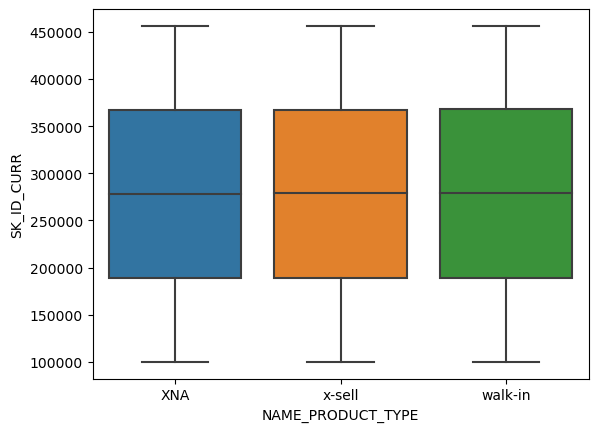

NAME_PRODUCT_TYPE Vs HOUR_APPR_PROCESS_START


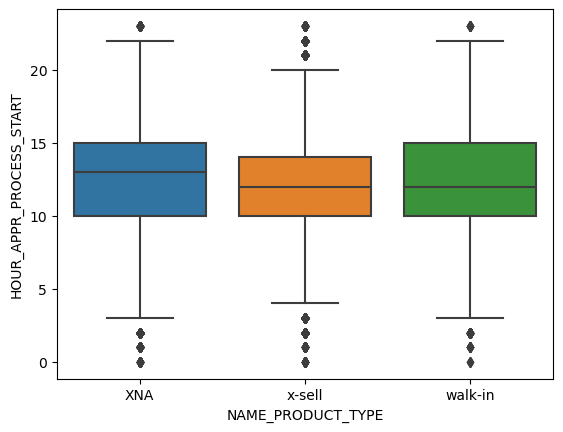

NAME_PRODUCT_TYPE Vs NFLAG_LAST_APPL_IN_DAY


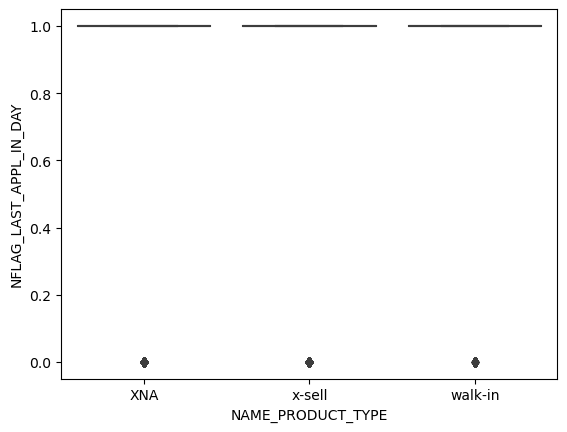

NAME_PRODUCT_TYPE Vs DAYS_DECISION


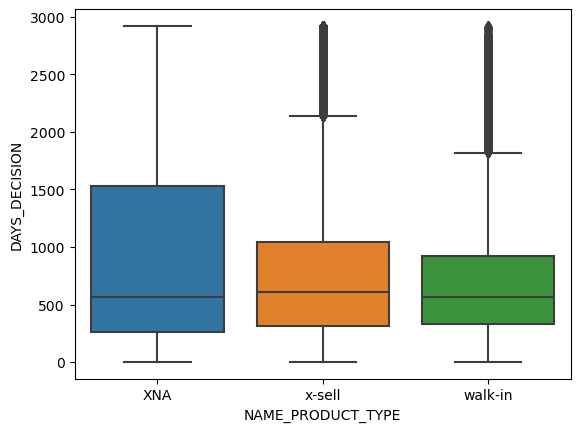

CHANNEL_TYPE Vs SK_ID_PREV


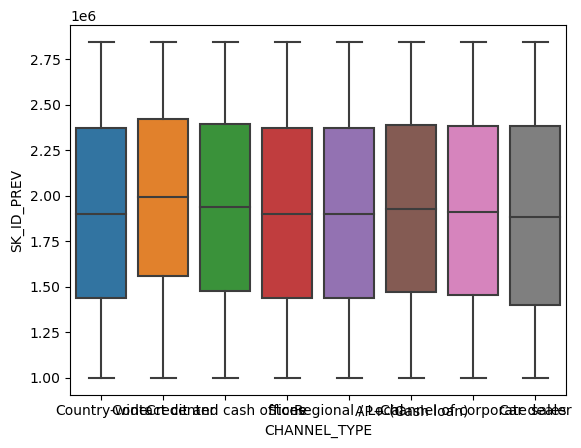

CHANNEL_TYPE Vs SK_ID_CURR


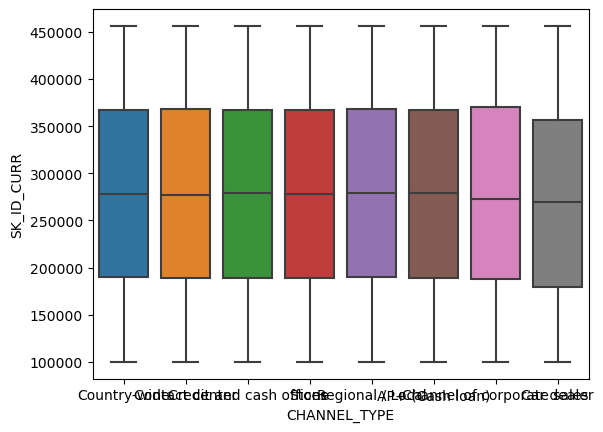

CHANNEL_TYPE Vs HOUR_APPR_PROCESS_START


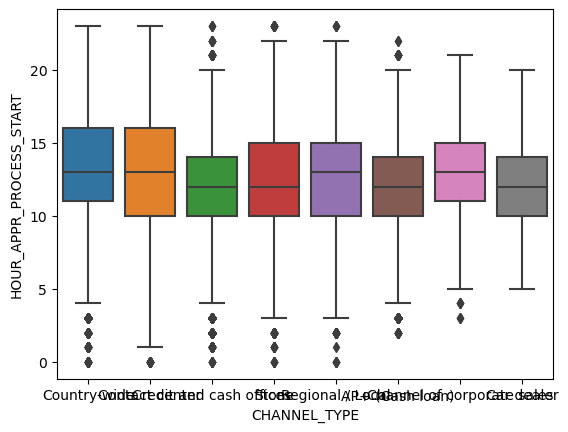

CHANNEL_TYPE Vs NFLAG_LAST_APPL_IN_DAY


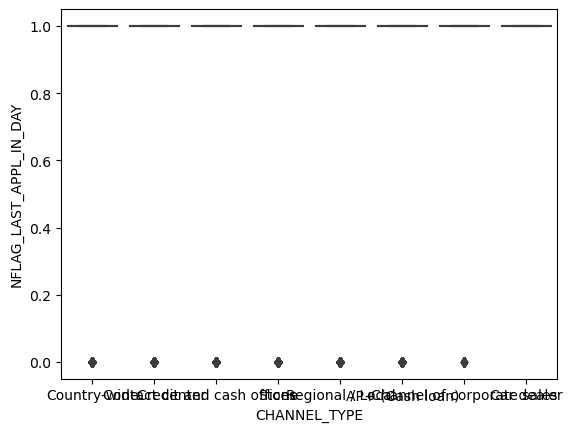

CHANNEL_TYPE Vs DAYS_DECISION


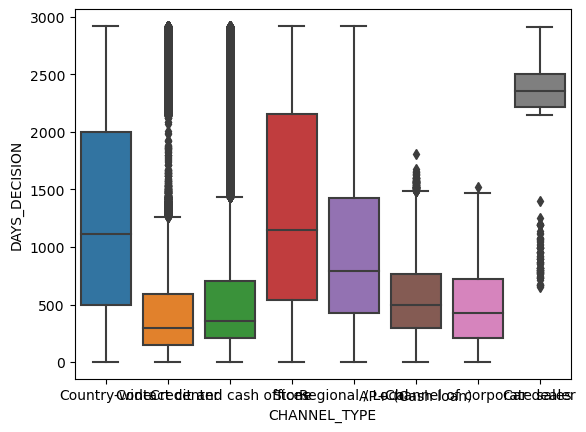

NAME_SELLER_INDUSTRY Vs SK_ID_PREV


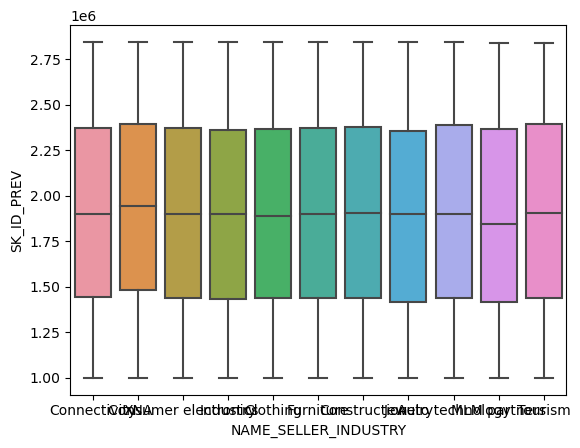

NAME_SELLER_INDUSTRY Vs SK_ID_CURR


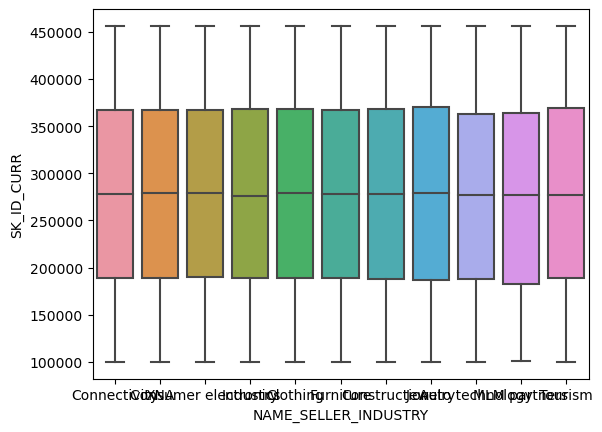

NAME_SELLER_INDUSTRY Vs HOUR_APPR_PROCESS_START


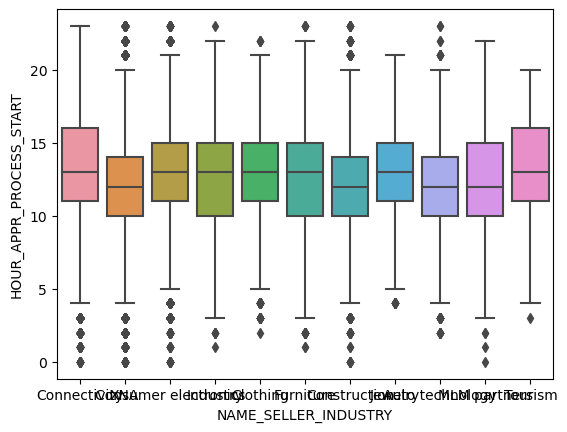

NAME_SELLER_INDUSTRY Vs NFLAG_LAST_APPL_IN_DAY


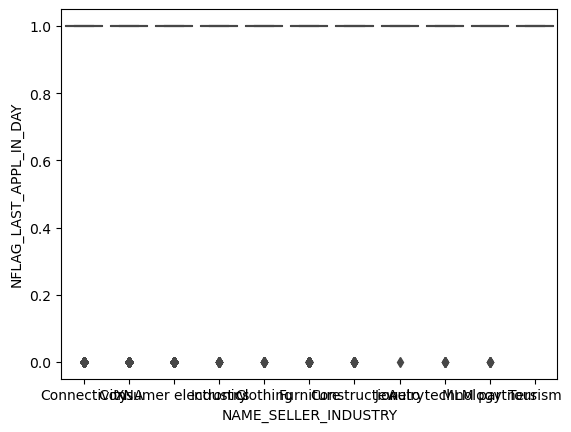

NAME_SELLER_INDUSTRY Vs DAYS_DECISION


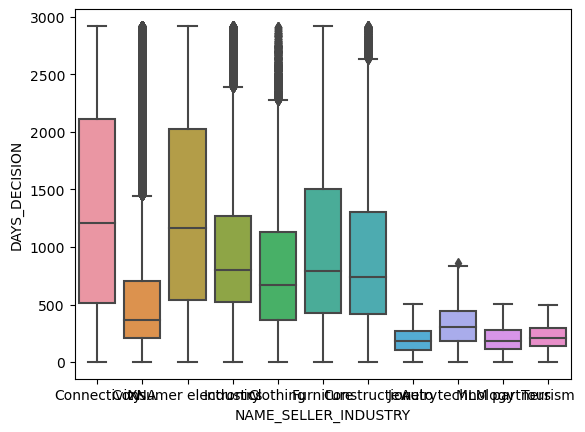

NAME_YIELD_GROUP Vs SK_ID_PREV


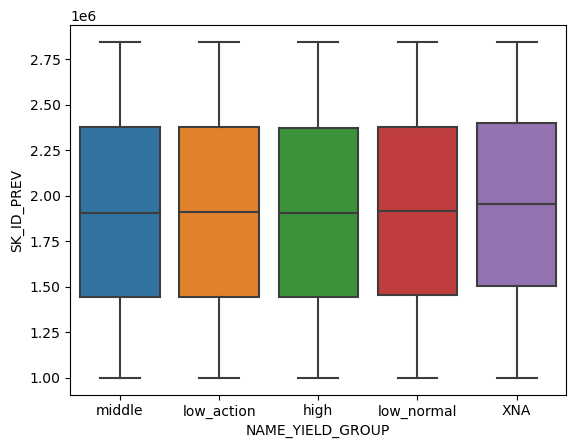

NAME_YIELD_GROUP Vs SK_ID_CURR


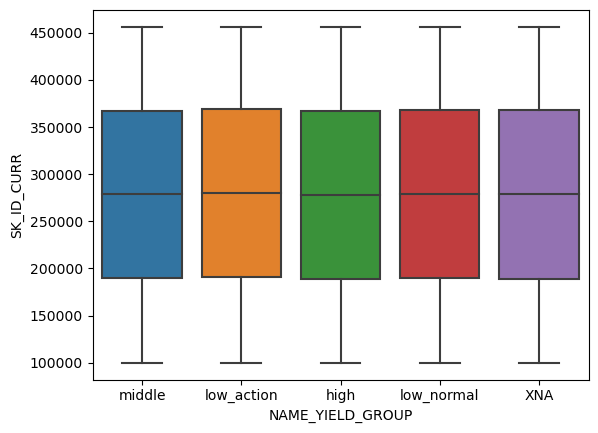

NAME_YIELD_GROUP Vs HOUR_APPR_PROCESS_START


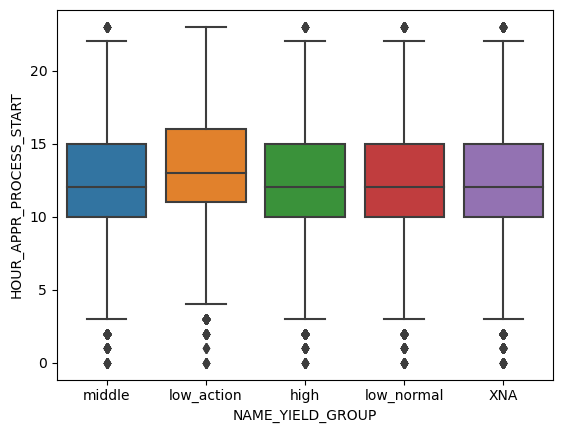

NAME_YIELD_GROUP Vs NFLAG_LAST_APPL_IN_DAY


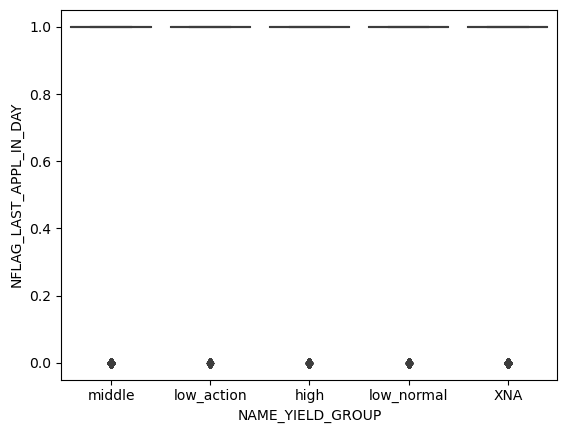

NAME_YIELD_GROUP Vs DAYS_DECISION


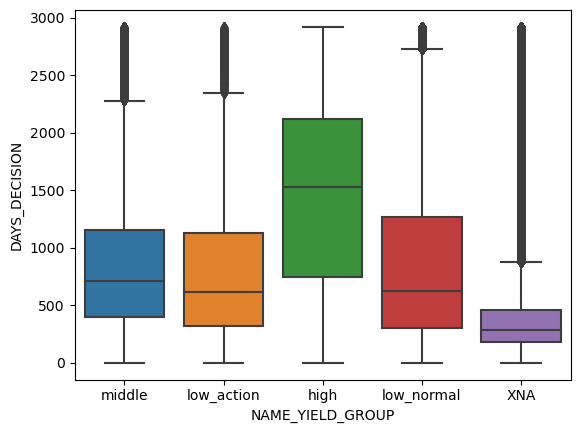

PRODUCT_COMBINATION Vs SK_ID_PREV


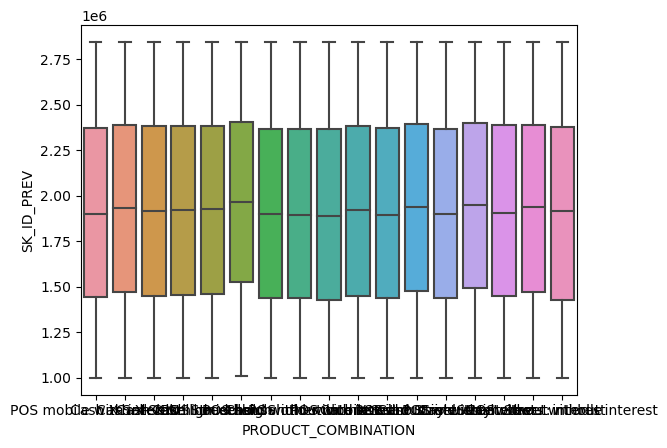

PRODUCT_COMBINATION Vs SK_ID_CURR


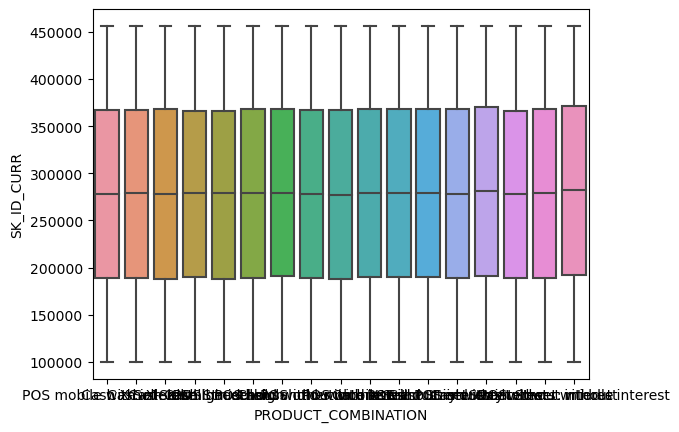

PRODUCT_COMBINATION Vs HOUR_APPR_PROCESS_START


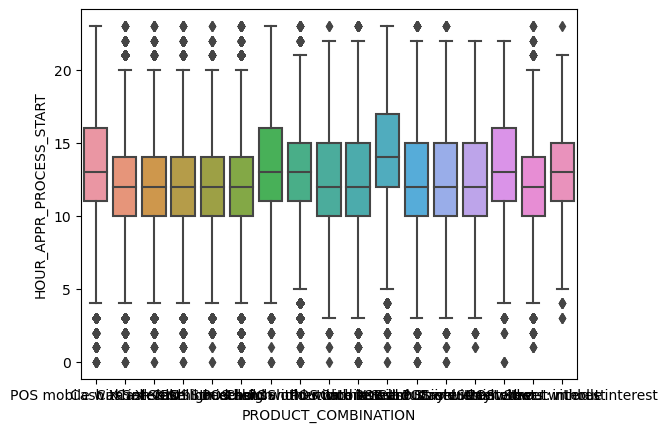

PRODUCT_COMBINATION Vs NFLAG_LAST_APPL_IN_DAY


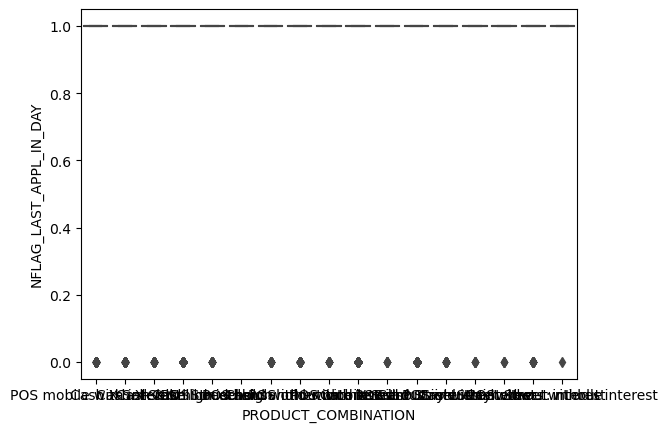

PRODUCT_COMBINATION Vs DAYS_DECISION


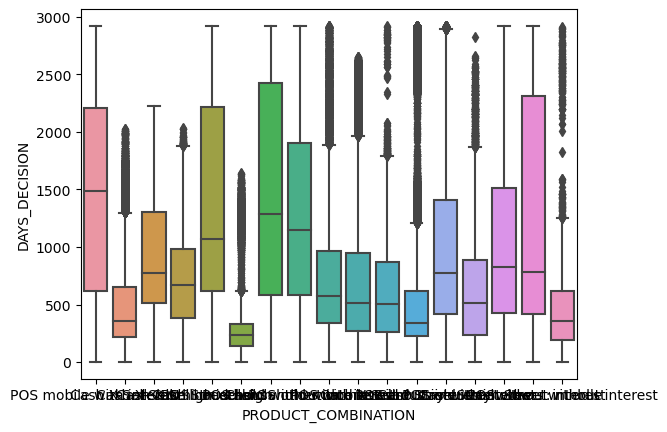

In [125]:
#analysing the categorical with int data type
for col1 in obj_cols_preAppdata:
    for col2 in int_cols_preAppdata:
        print(col1,"Vs",col2)
        sns.boxplot(x=df_PrevApplication[col1],y=df_PrevApplication[col2])
        plt.show()

NAME_CONTRACT_TYPE Vs AMT_ANNUITY


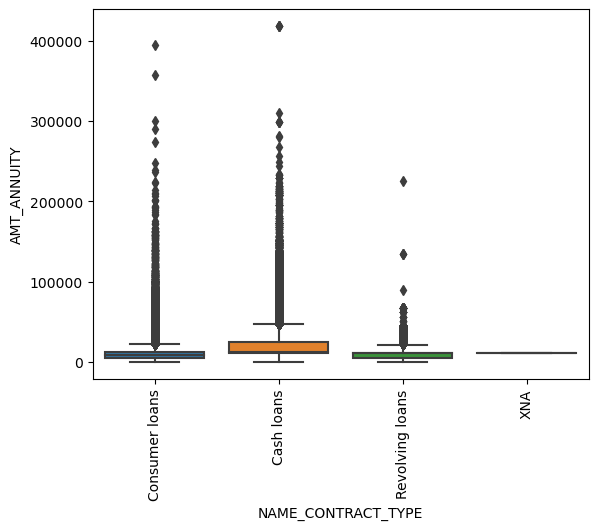

NAME_CONTRACT_TYPE Vs AMT_APPLICATION


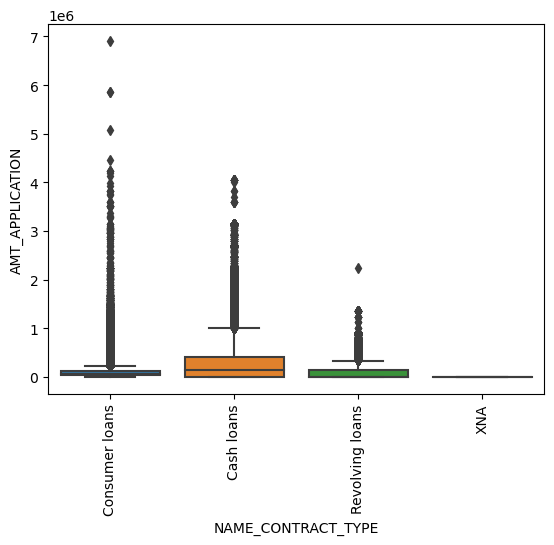

NAME_CONTRACT_TYPE Vs AMT_CREDIT


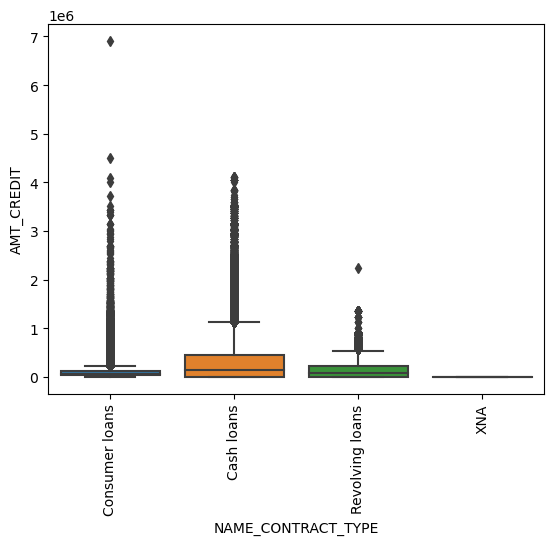

NAME_CONTRACT_TYPE Vs AMT_GOODS_PRICE


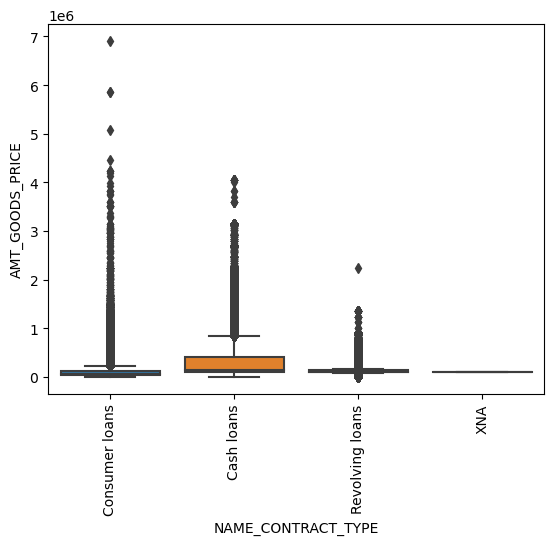

NAME_CONTRACT_TYPE Vs CNT_PAYMENT


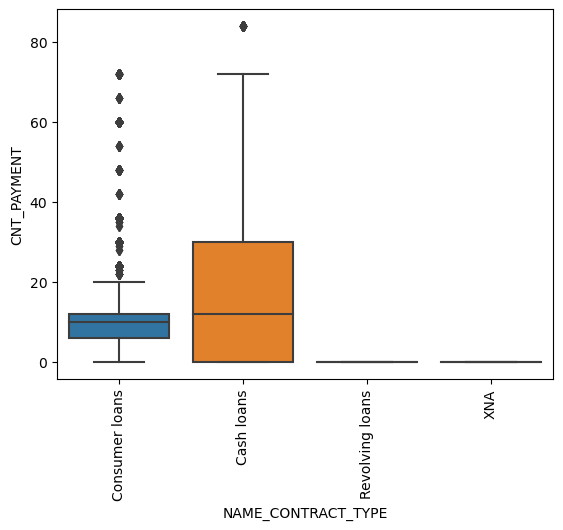

FLAG_LAST_APPL_PER_CONTRACT Vs AMT_ANNUITY


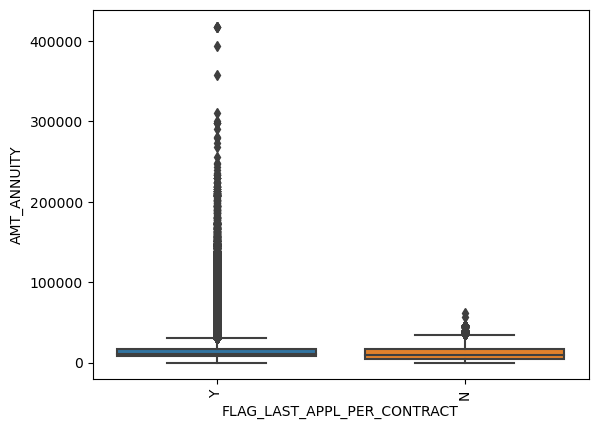

FLAG_LAST_APPL_PER_CONTRACT Vs AMT_APPLICATION


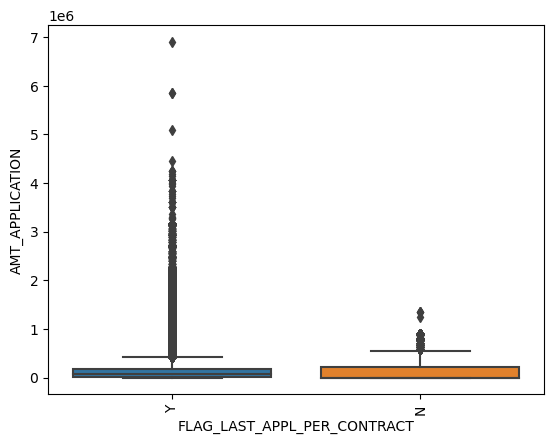

FLAG_LAST_APPL_PER_CONTRACT Vs AMT_CREDIT


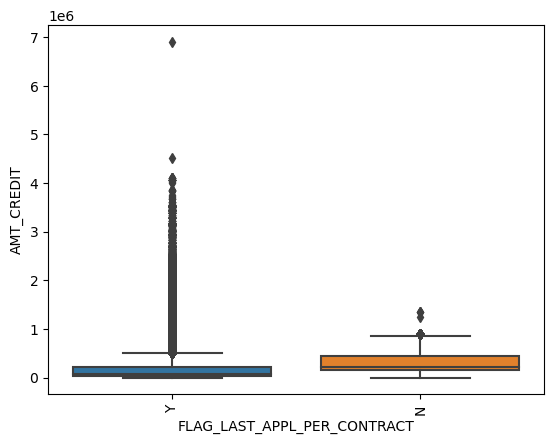

FLAG_LAST_APPL_PER_CONTRACT Vs AMT_GOODS_PRICE


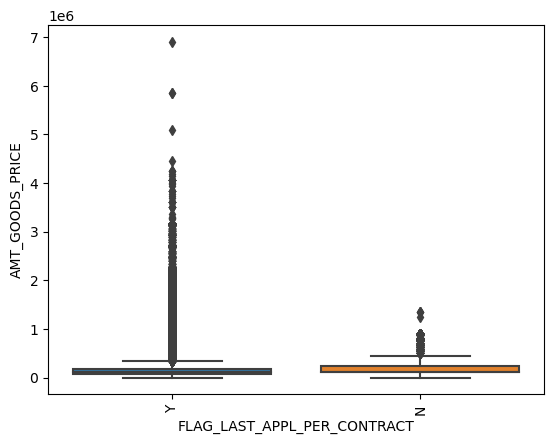

FLAG_LAST_APPL_PER_CONTRACT Vs CNT_PAYMENT


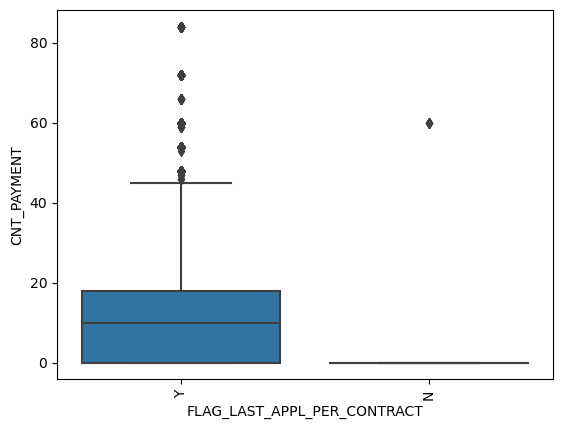

NAME_CASH_LOAN_PURPOSE Vs AMT_ANNUITY


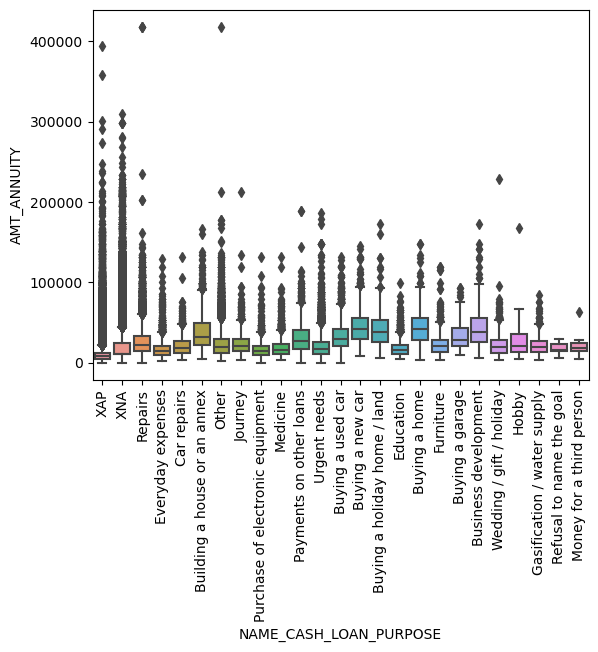

NAME_CASH_LOAN_PURPOSE Vs AMT_APPLICATION


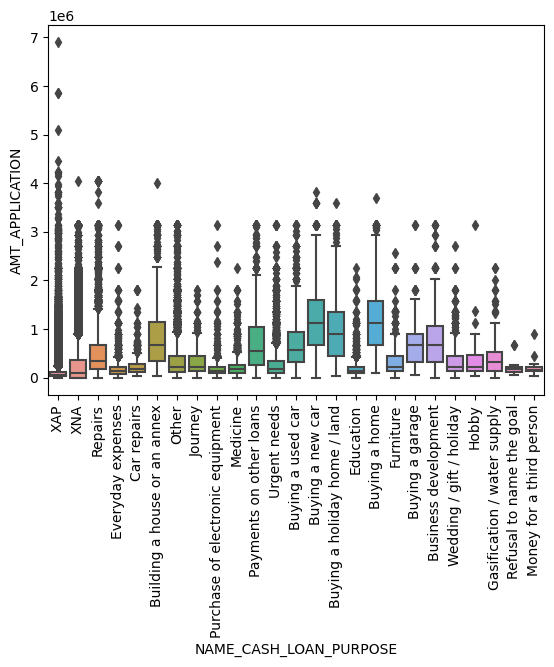

NAME_CASH_LOAN_PURPOSE Vs AMT_CREDIT


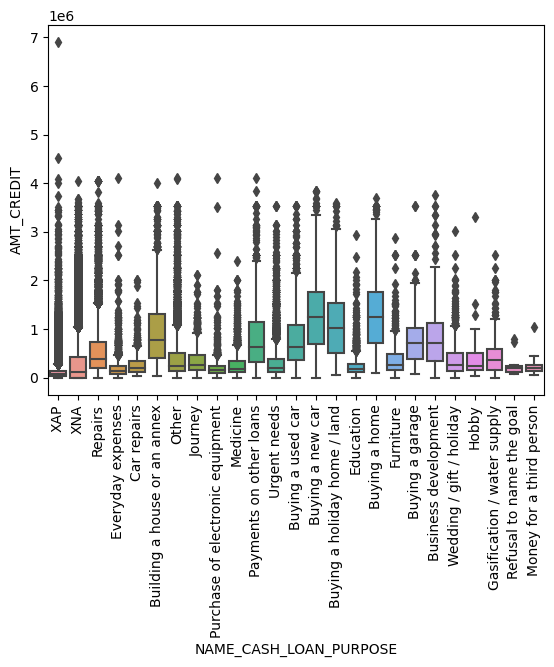

NAME_CASH_LOAN_PURPOSE Vs AMT_GOODS_PRICE


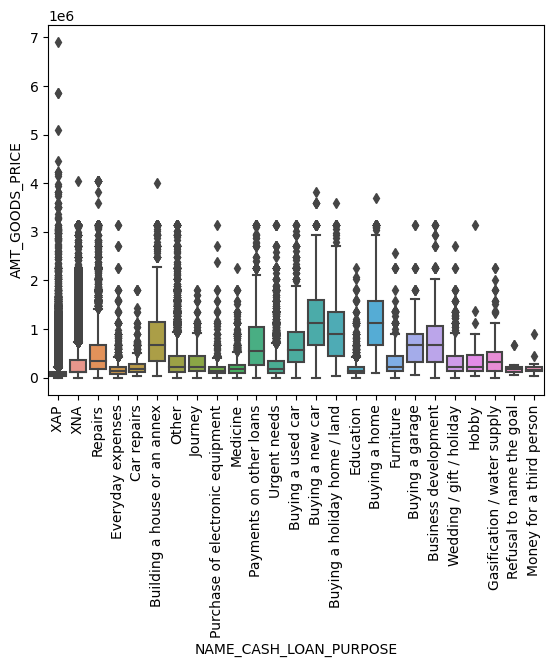

NAME_CASH_LOAN_PURPOSE Vs CNT_PAYMENT


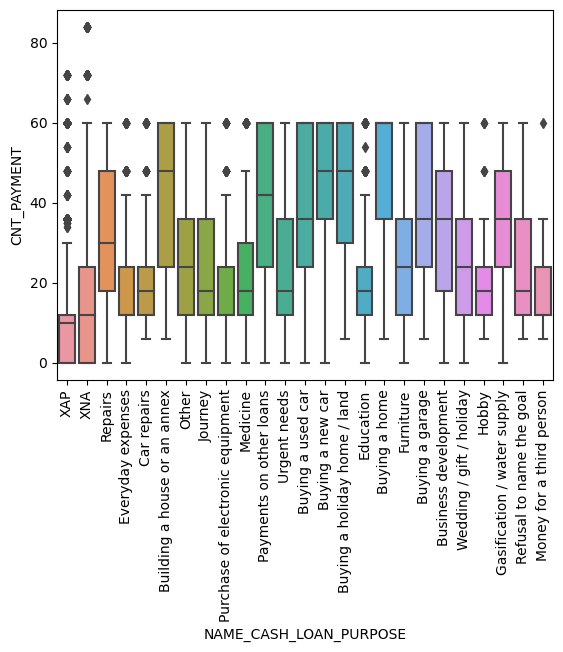

NAME_CONTRACT_STATUS Vs AMT_ANNUITY


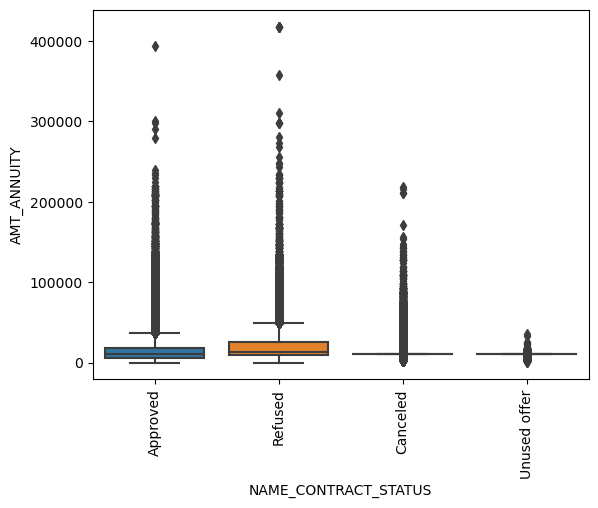

NAME_CONTRACT_STATUS Vs AMT_APPLICATION


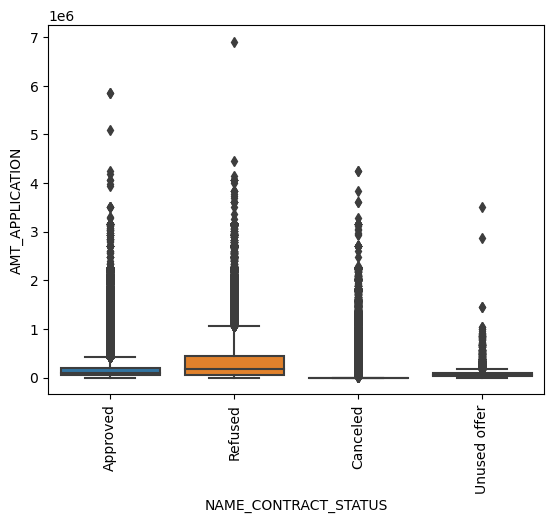

NAME_CONTRACT_STATUS Vs AMT_CREDIT


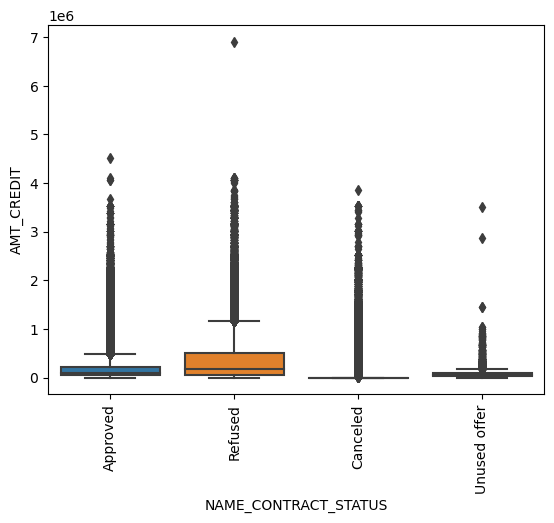

NAME_CONTRACT_STATUS Vs AMT_GOODS_PRICE


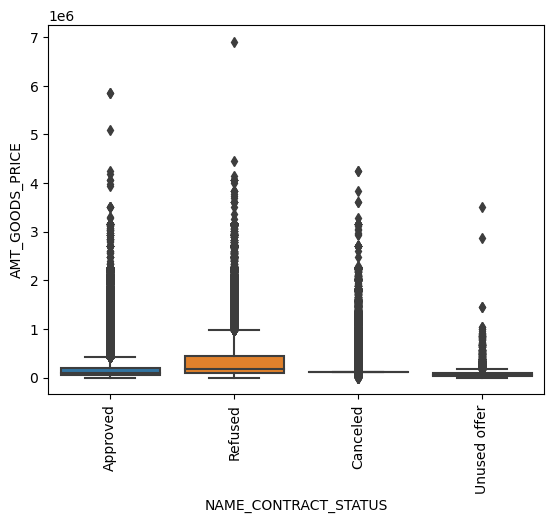

NAME_CONTRACT_STATUS Vs CNT_PAYMENT


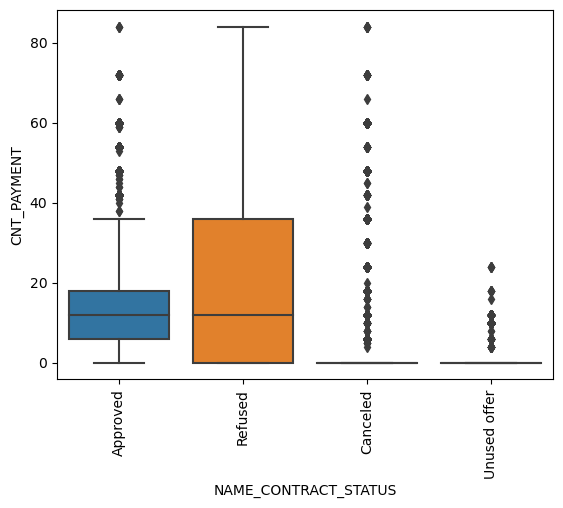

NAME_PAYMENT_TYPE Vs AMT_ANNUITY


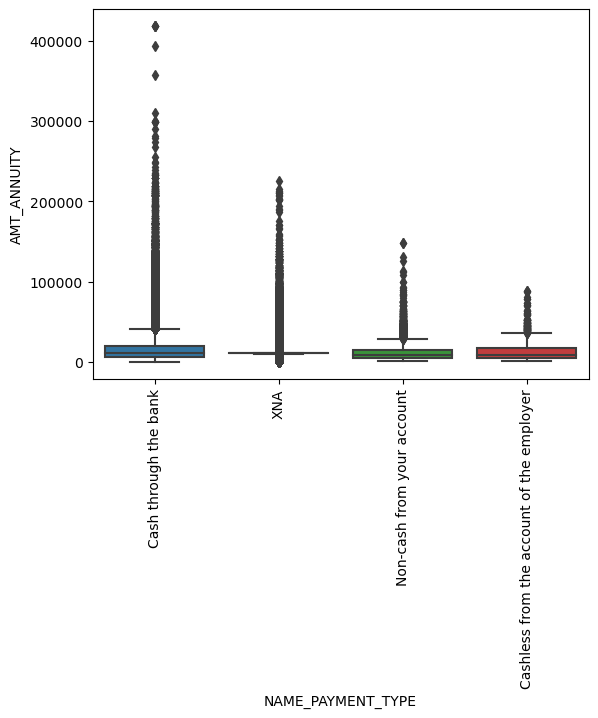

NAME_PAYMENT_TYPE Vs AMT_APPLICATION


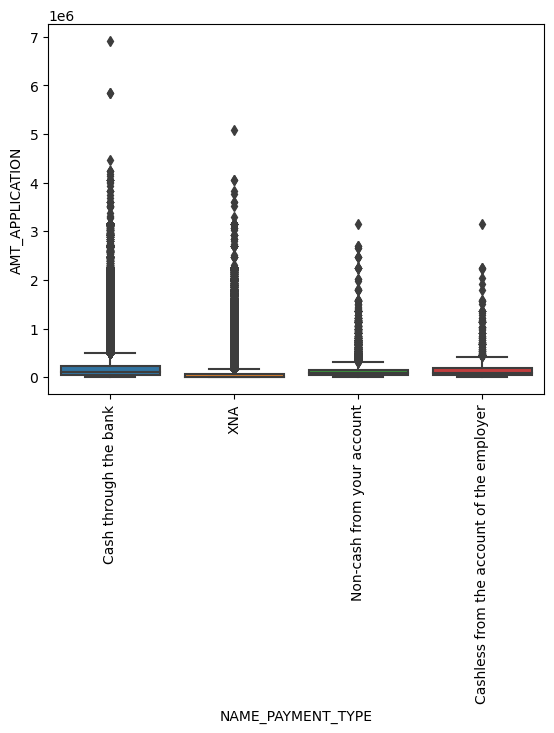

NAME_PAYMENT_TYPE Vs AMT_CREDIT


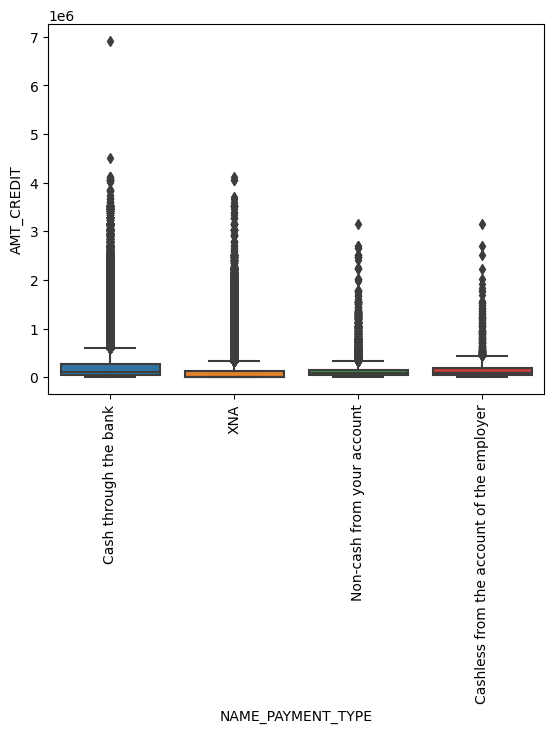

NAME_PAYMENT_TYPE Vs AMT_GOODS_PRICE


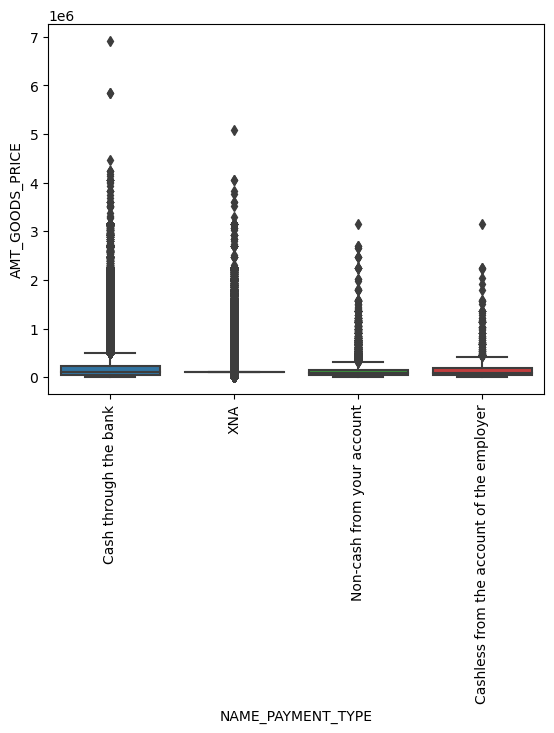

NAME_PAYMENT_TYPE Vs CNT_PAYMENT


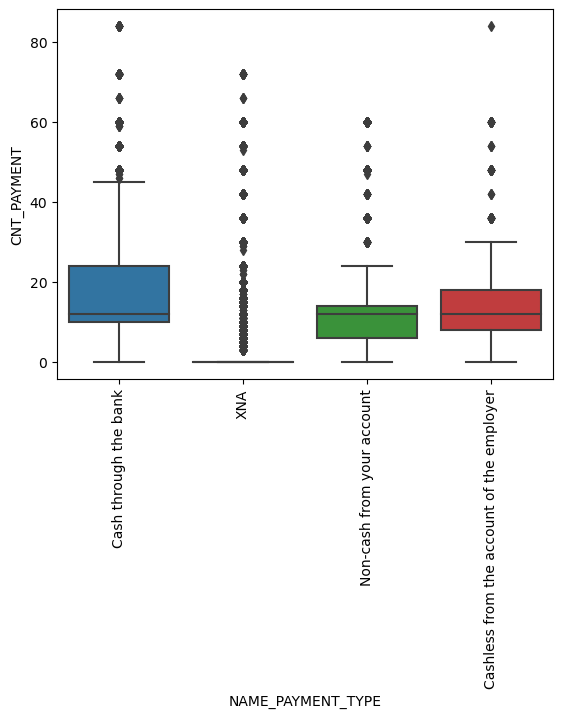

CODE_REJECT_REASON Vs AMT_ANNUITY


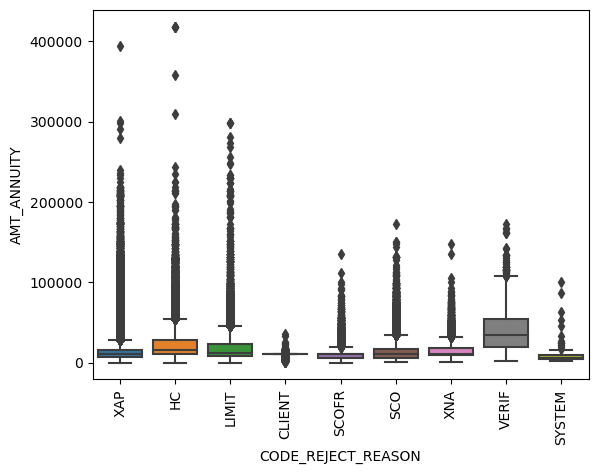

CODE_REJECT_REASON Vs AMT_APPLICATION


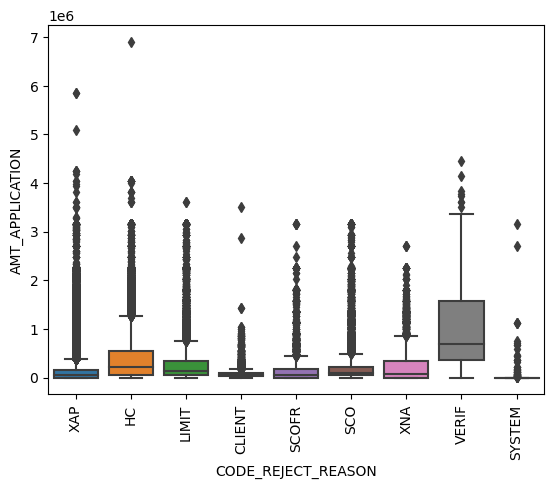

CODE_REJECT_REASON Vs AMT_CREDIT


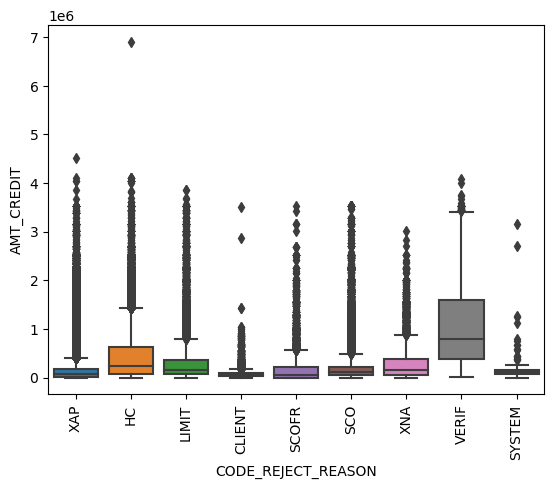

CODE_REJECT_REASON Vs AMT_GOODS_PRICE


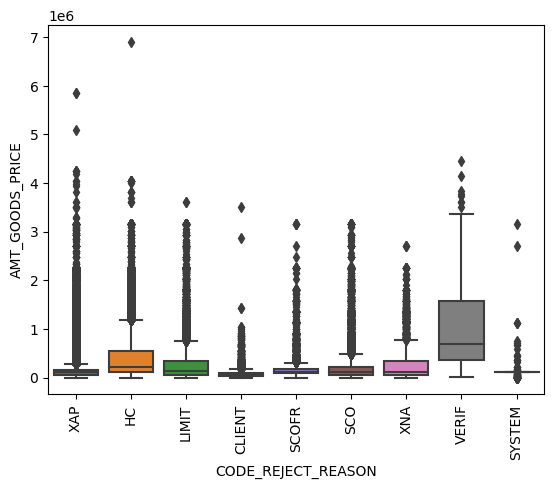

CODE_REJECT_REASON Vs CNT_PAYMENT


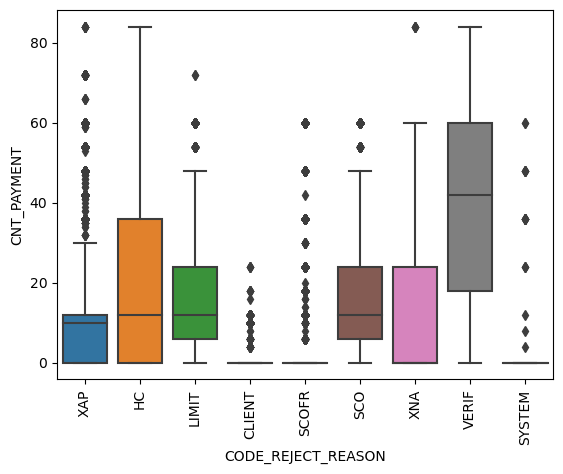

NAME_CLIENT_TYPE Vs AMT_ANNUITY


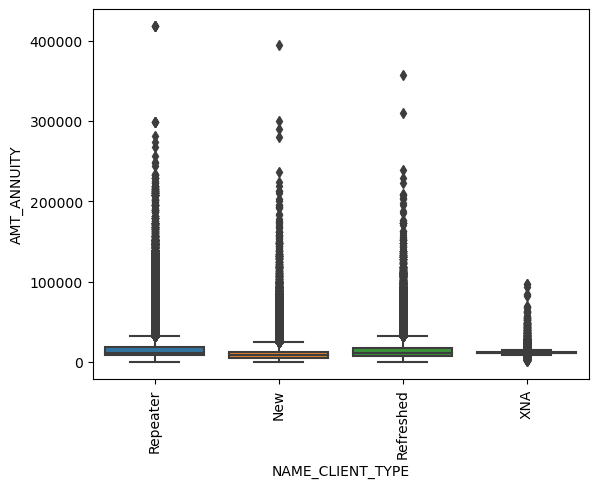

NAME_CLIENT_TYPE Vs AMT_APPLICATION


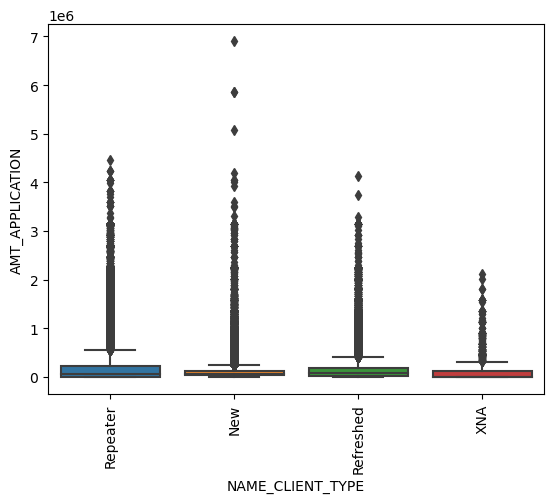

NAME_CLIENT_TYPE Vs AMT_CREDIT


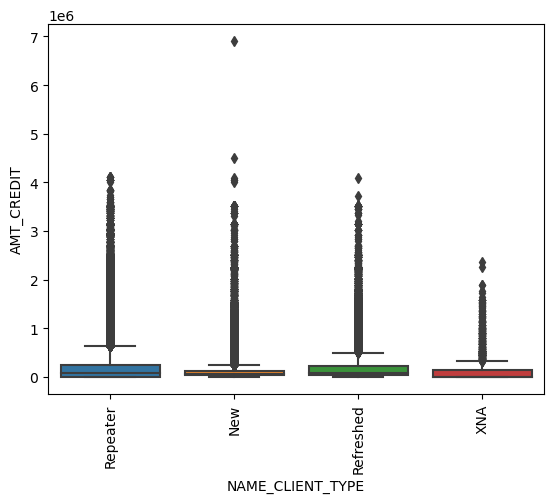

NAME_CLIENT_TYPE Vs AMT_GOODS_PRICE


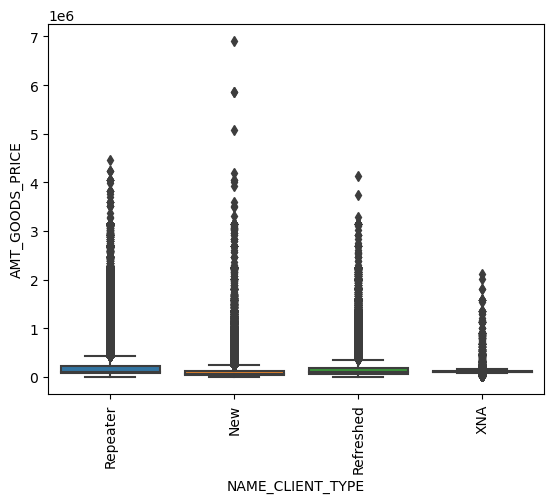

NAME_CLIENT_TYPE Vs CNT_PAYMENT


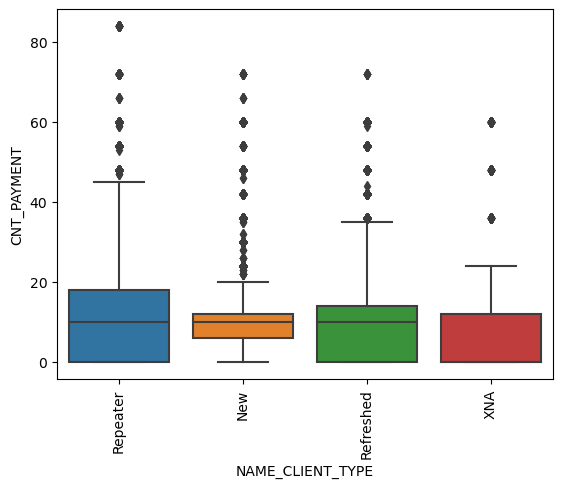

NAME_GOODS_CATEGORY Vs AMT_ANNUITY


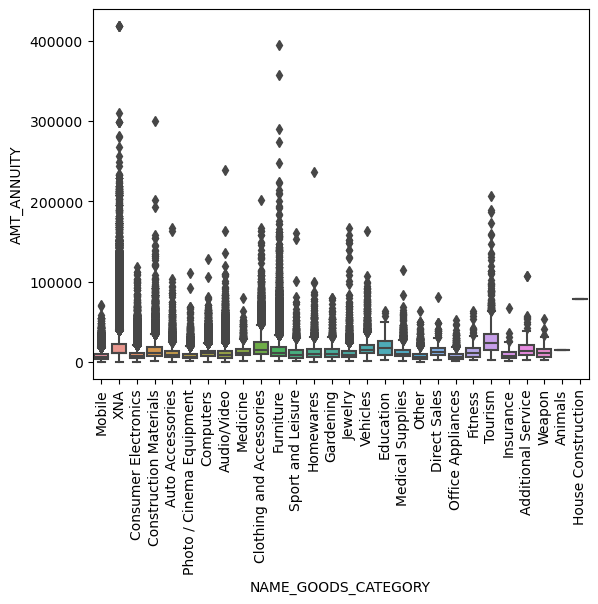

NAME_GOODS_CATEGORY Vs AMT_APPLICATION


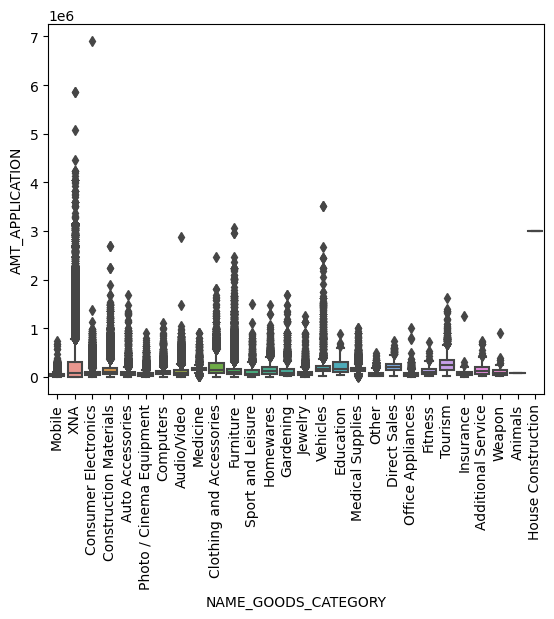

NAME_GOODS_CATEGORY Vs AMT_CREDIT


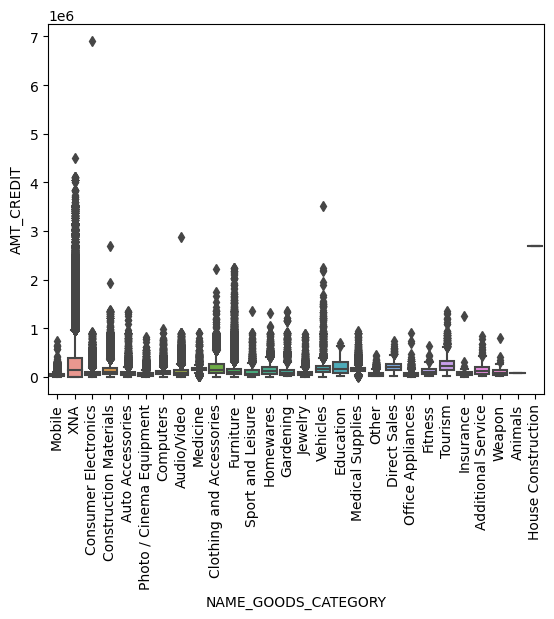

NAME_GOODS_CATEGORY Vs AMT_GOODS_PRICE


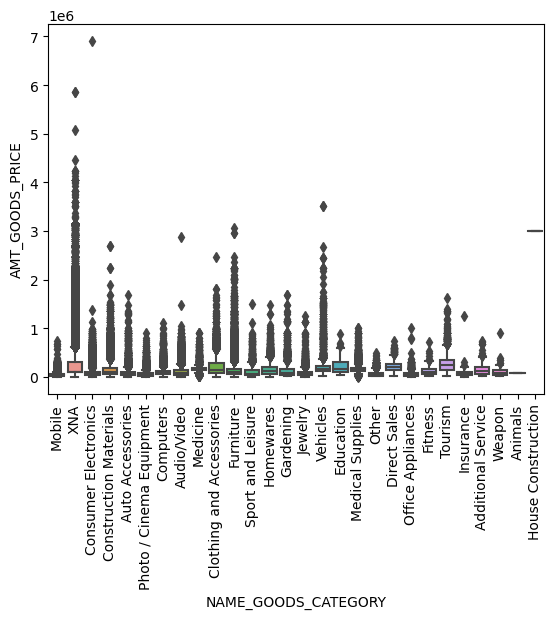

NAME_GOODS_CATEGORY Vs CNT_PAYMENT


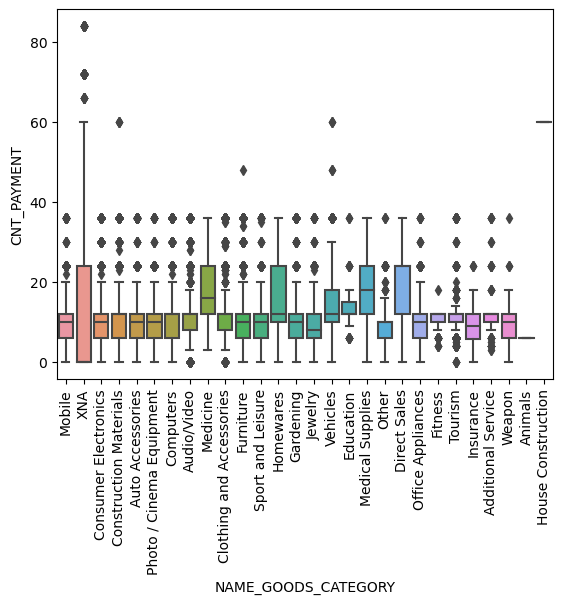

NAME_PORTFOLIO Vs AMT_ANNUITY


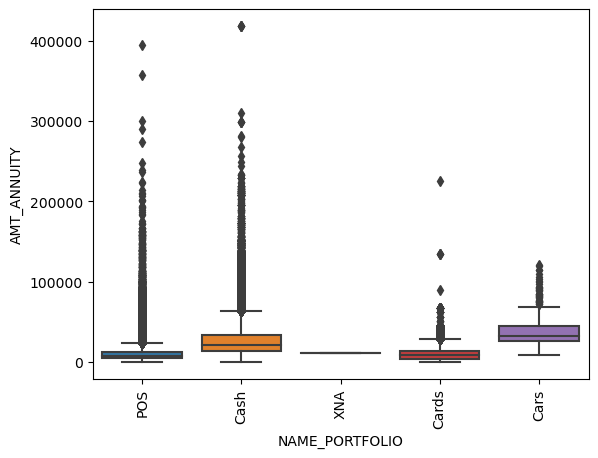

NAME_PORTFOLIO Vs AMT_APPLICATION


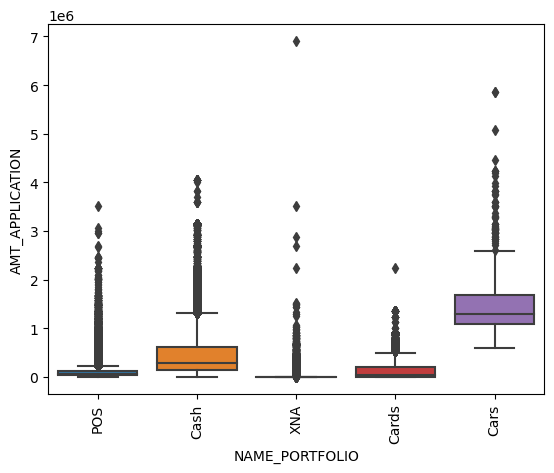

NAME_PORTFOLIO Vs AMT_CREDIT


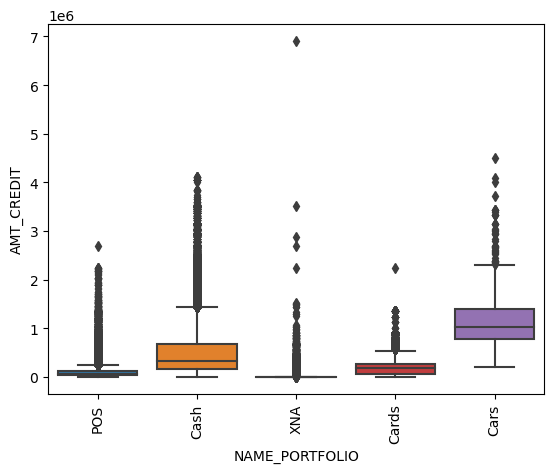

NAME_PORTFOLIO Vs AMT_GOODS_PRICE


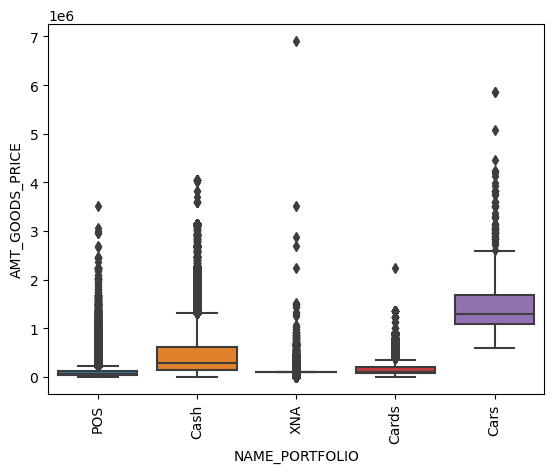

NAME_PORTFOLIO Vs CNT_PAYMENT


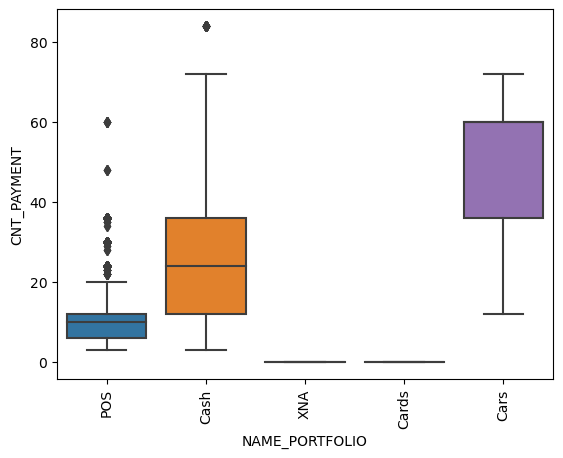

NAME_PRODUCT_TYPE Vs AMT_ANNUITY


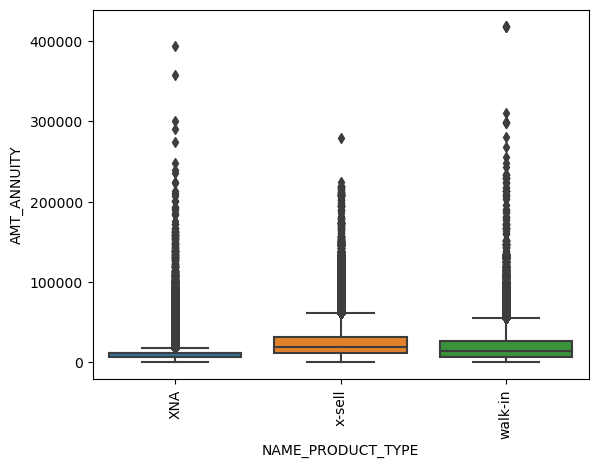

NAME_PRODUCT_TYPE Vs AMT_APPLICATION


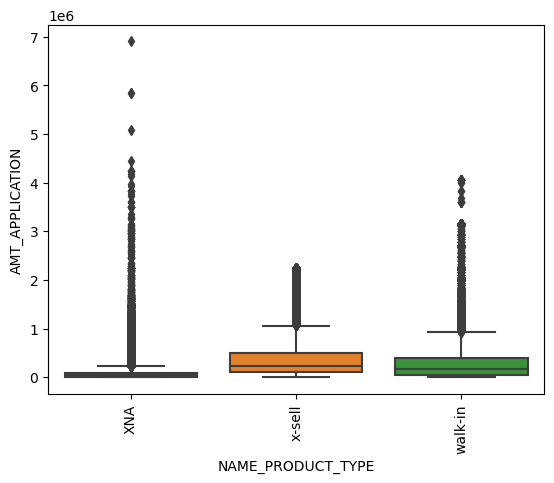

NAME_PRODUCT_TYPE Vs AMT_CREDIT


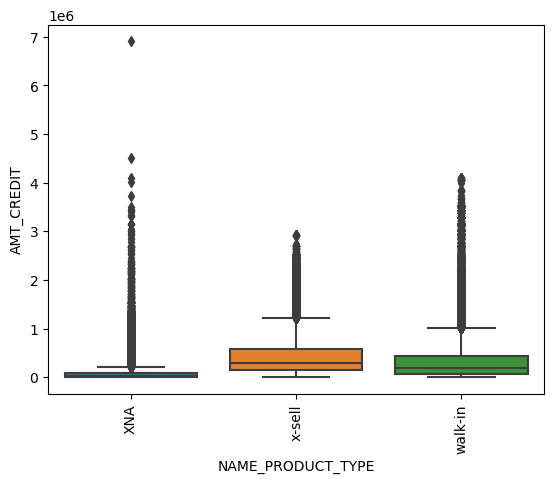

NAME_PRODUCT_TYPE Vs AMT_GOODS_PRICE


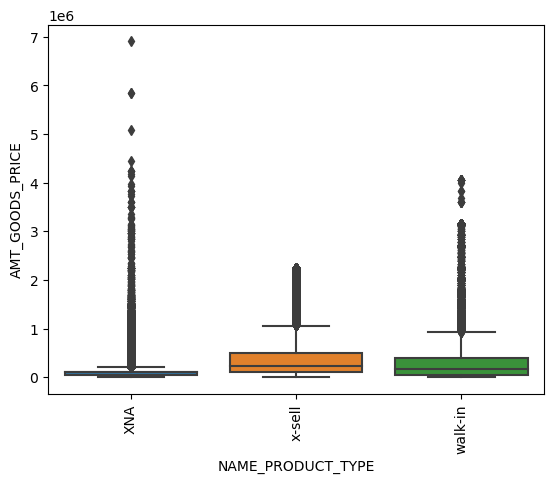

NAME_PRODUCT_TYPE Vs CNT_PAYMENT


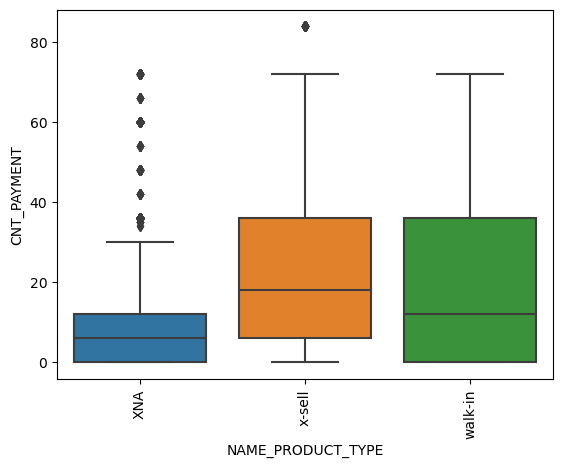

CHANNEL_TYPE Vs AMT_ANNUITY


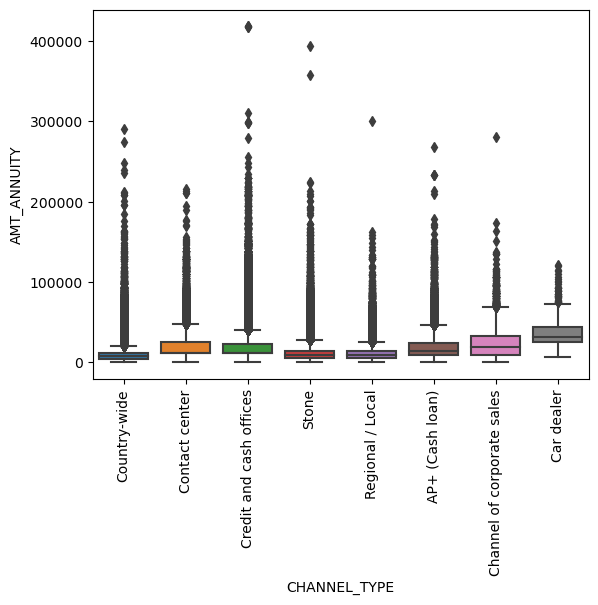

CHANNEL_TYPE Vs AMT_APPLICATION


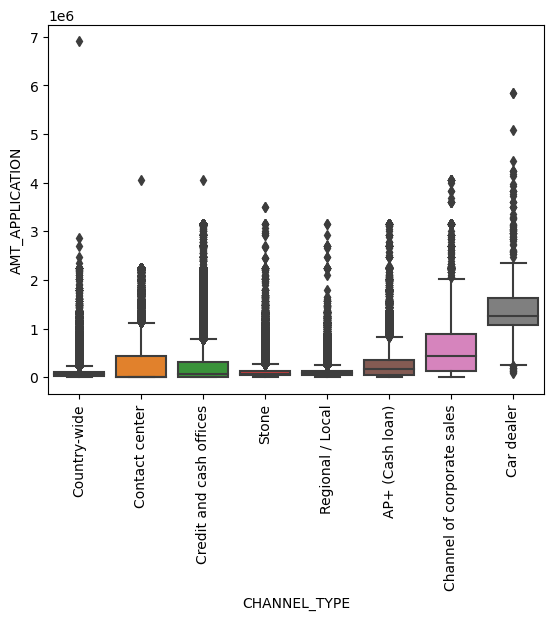

CHANNEL_TYPE Vs AMT_CREDIT


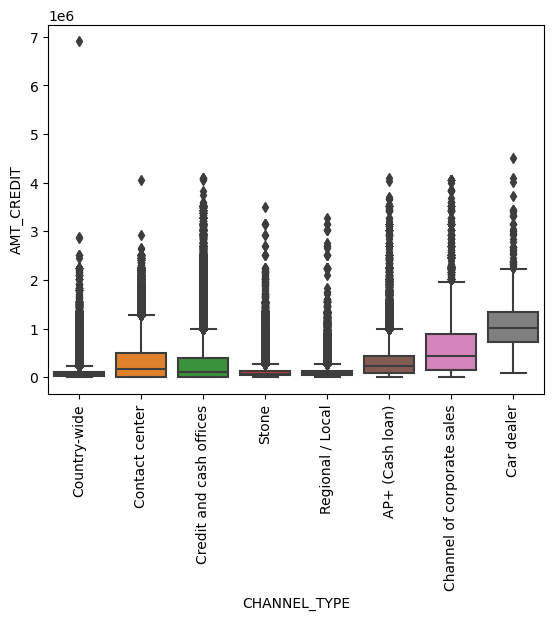

CHANNEL_TYPE Vs AMT_GOODS_PRICE


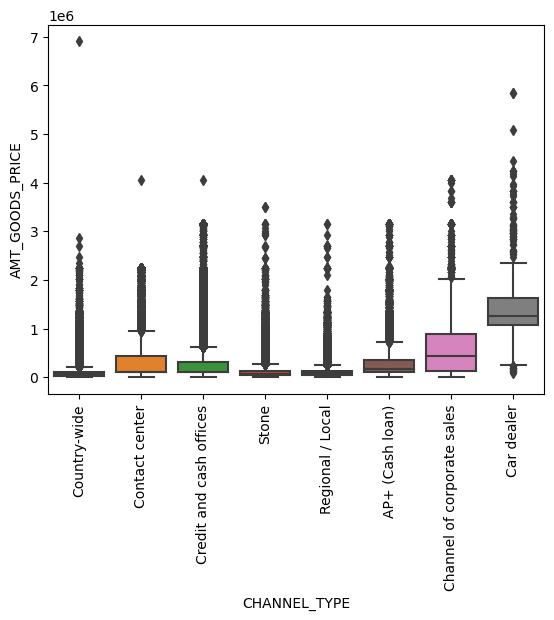

CHANNEL_TYPE Vs CNT_PAYMENT


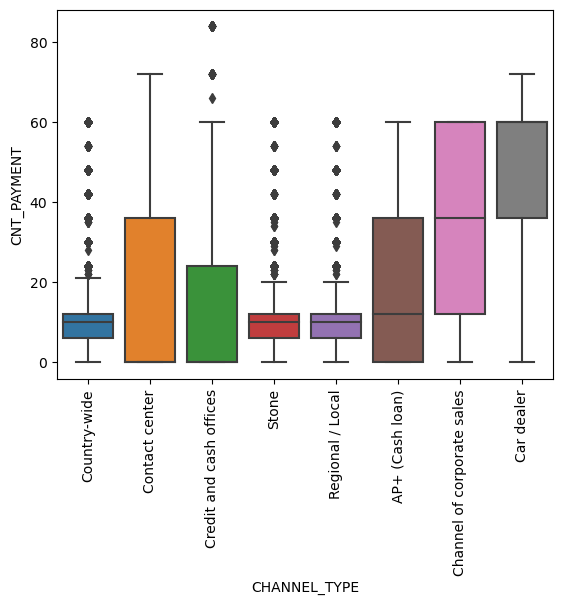

NAME_SELLER_INDUSTRY Vs AMT_ANNUITY


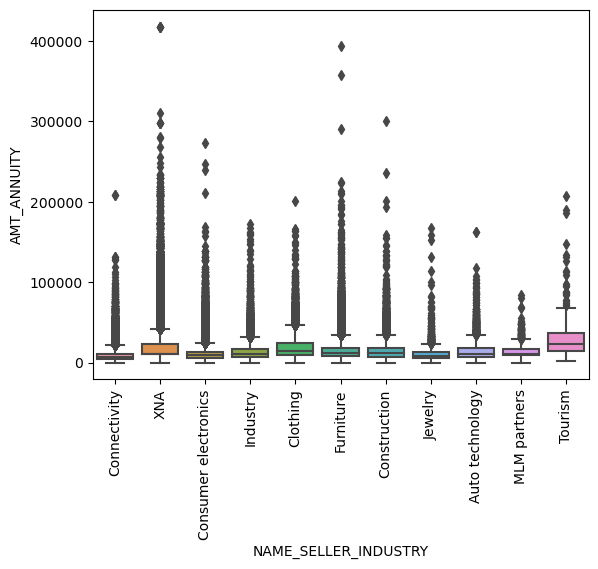

NAME_SELLER_INDUSTRY Vs AMT_APPLICATION


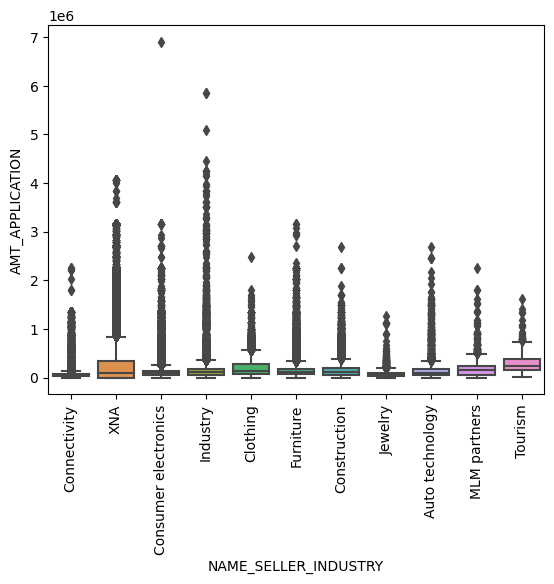

NAME_SELLER_INDUSTRY Vs AMT_CREDIT


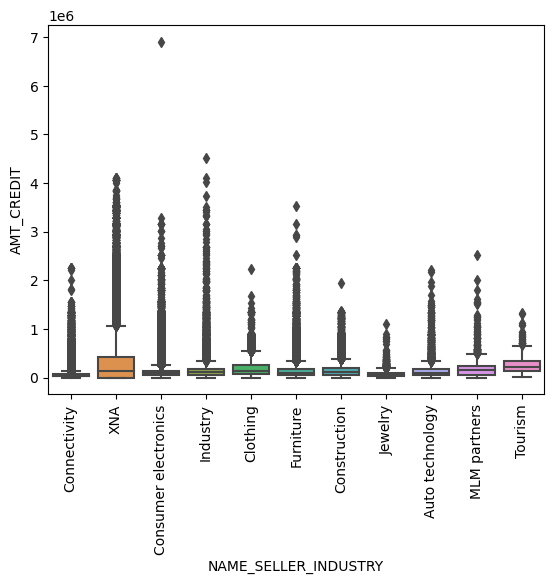

NAME_SELLER_INDUSTRY Vs AMT_GOODS_PRICE


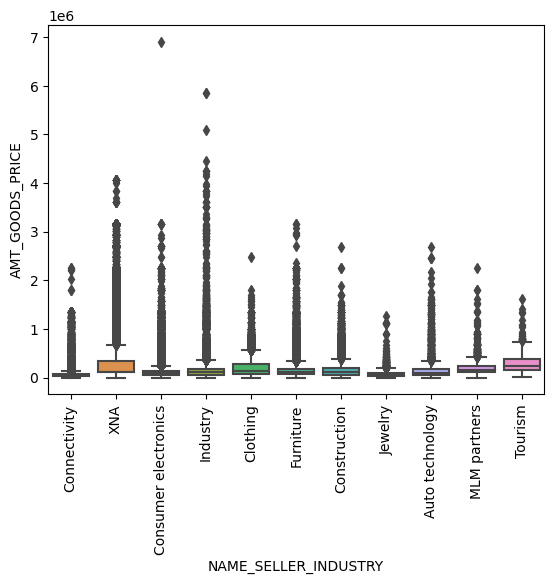

NAME_SELLER_INDUSTRY Vs CNT_PAYMENT


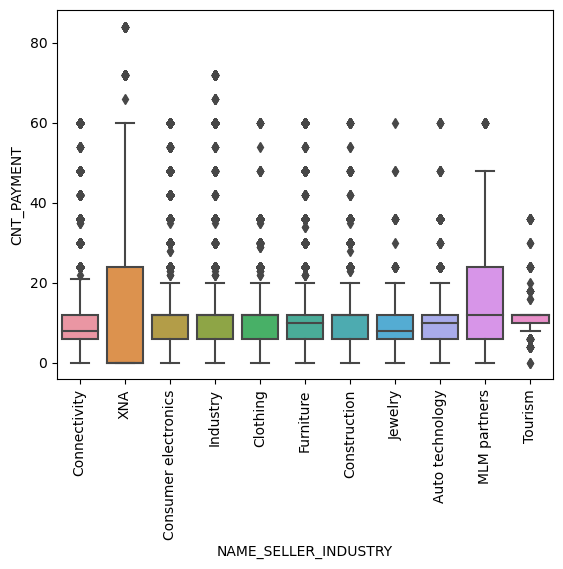

NAME_YIELD_GROUP Vs AMT_ANNUITY


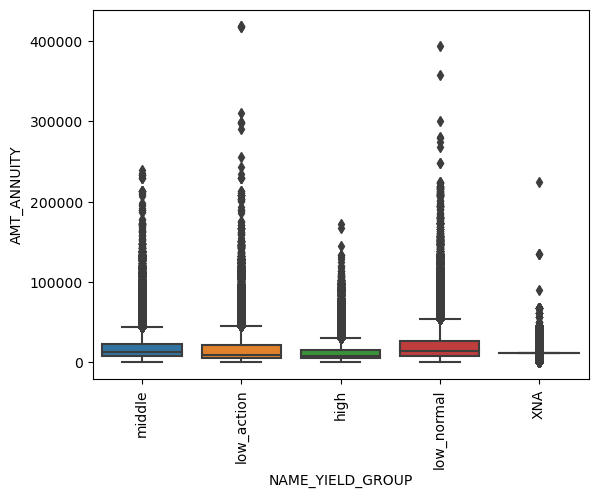

NAME_YIELD_GROUP Vs AMT_APPLICATION


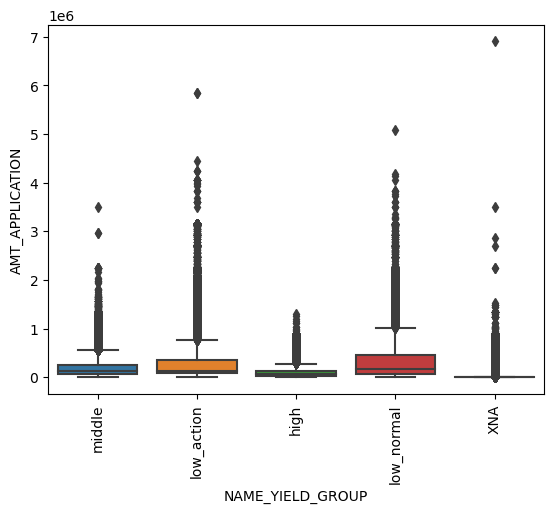

NAME_YIELD_GROUP Vs AMT_CREDIT


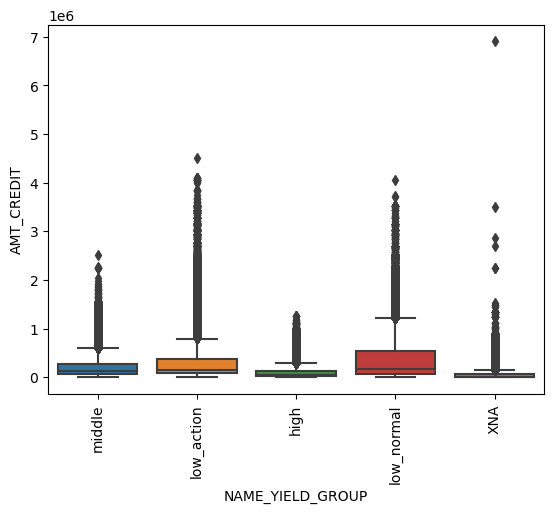

NAME_YIELD_GROUP Vs AMT_GOODS_PRICE


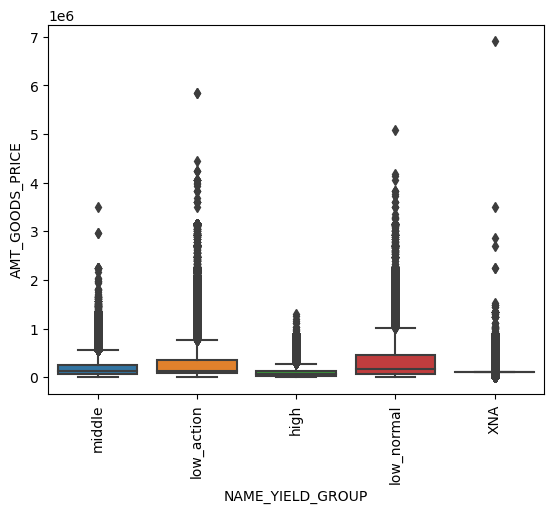

NAME_YIELD_GROUP Vs CNT_PAYMENT


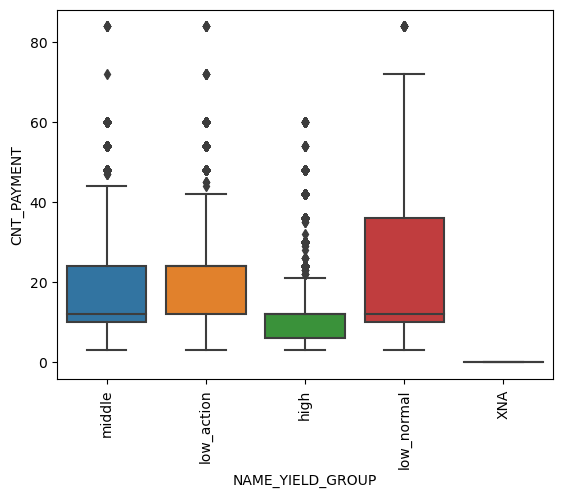

PRODUCT_COMBINATION Vs AMT_ANNUITY


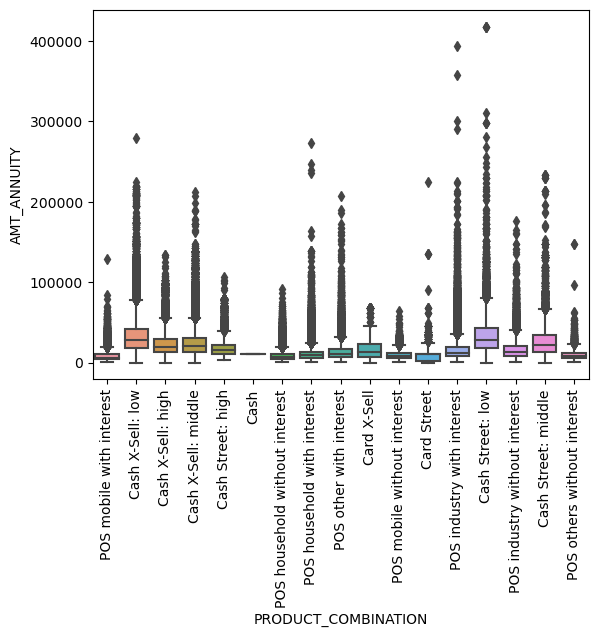

PRODUCT_COMBINATION Vs AMT_APPLICATION


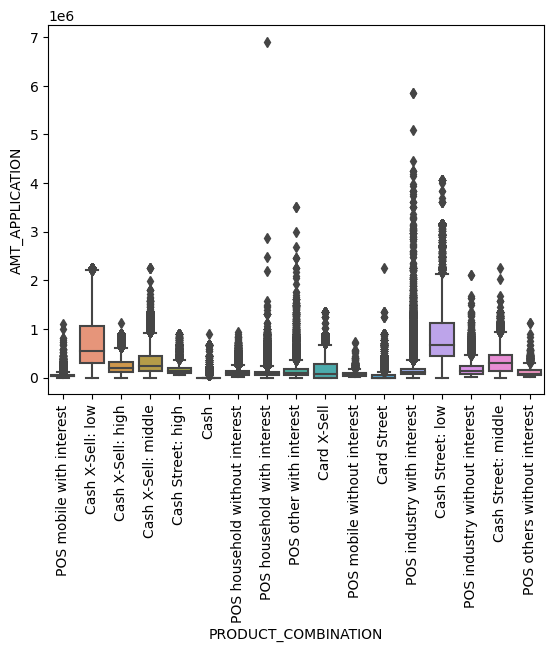

PRODUCT_COMBINATION Vs AMT_CREDIT


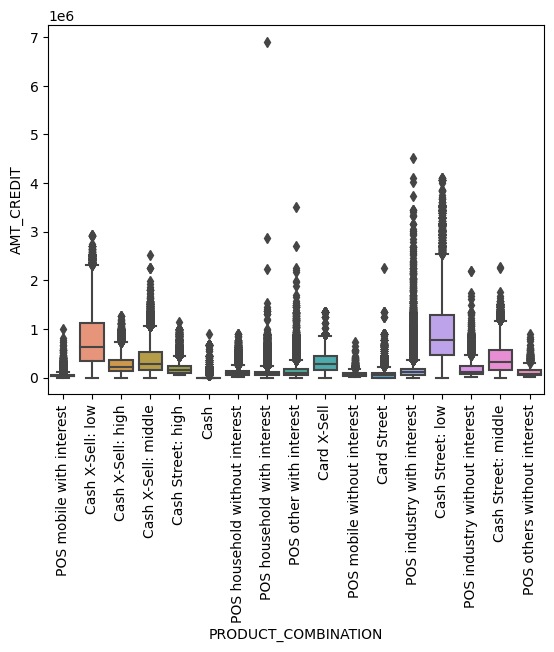

PRODUCT_COMBINATION Vs AMT_GOODS_PRICE


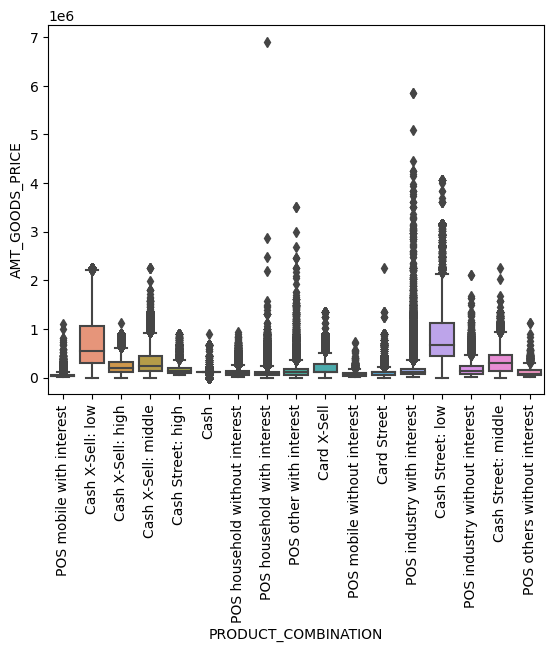

PRODUCT_COMBINATION Vs CNT_PAYMENT


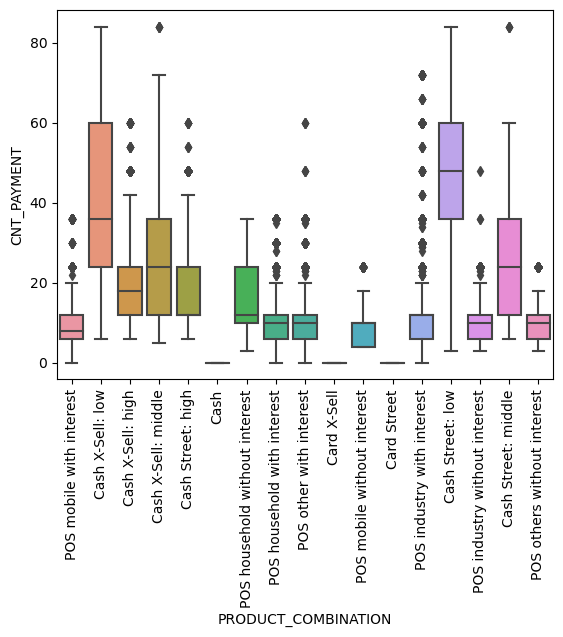

In [126]:
#analysing the categorical with float data type
for col1 in obj_cols_preAppdata:
    for col2 in float_cols_preAppdata:
        print(col1,"Vs",col2)
        sns.boxplot(x=df_PrevApplication[col1],y=df_PrevApplication[col2])
        plt.xticks(rotation=90)
        plt.show()

### Insights from the above bivariate graphs plotted above:
1. days decision and Hours for application process in consumer loans are more densed compared to others.
2. Mostly customers had one loan processed in a day for previous loans.
3. Annuity amount is much higher in consumer and cash loans.
4. Amount asked for loan in consumer loans is higher than cash loan. We can observe that consumer loans data is present only in previous application data not in application data (current).
5. Amount credited and Amount of goods for loan is also high for consumer and cash loans.

## Multivariate analysis

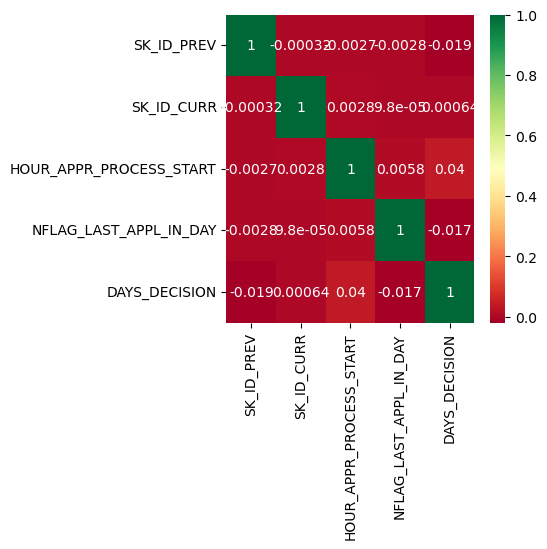

In [127]:
#checking the correlation among the columns
plt.figure(figsize=(4,4))
sns.heatmap(df_PrevApplication[int_cols_preAppdata].corr(),annot=True, cmap='RdYlGn')
plt.show()

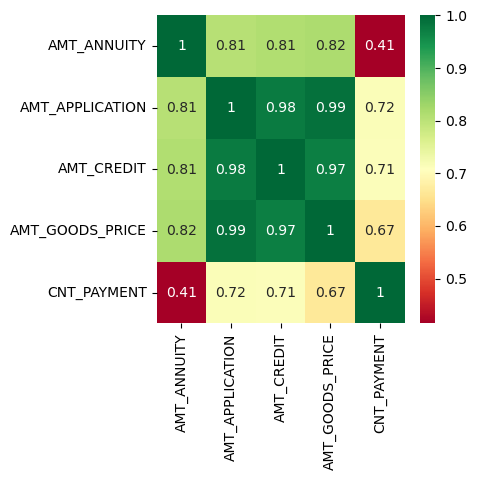

In [128]:
#Checking for some more correlations
plt.figure(figsize=(4,4))
sns.heatmap(df_PrevApplication[float_cols_preAppdata].corr(),annot=True, cmap='RdYlGn')
plt.show()

### Insights from above heatmaps
1.  'AMT_ANNUITY','AMT_APPLICATION','AMT_CREDIT','AMT_GOODS_PRICE' have high positive correlation.
 

## Merging both dataset i.e application dataset and previous application dataset.

In [129]:
#applying left merge.
df_mergedData=pd.merge( df_ApplicationData,df_PrevApplication, how='left', on="SK_ID_CURR")
df_mergedData.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_INCOME,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100002,1,Cash loans,M,N,Y,0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,637,3648.0,2120,Laborers,1.0,2,2,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,2.0,2.0,1134.0,0.0,0.0,0.0,0.0,0.0,1.0,High,1038818.0,Consumer loans,9251.775,179055.0,179055.0,179055.0,9.0,Y,1.0,XAP,Approved,606.0,XNA,XAP,New,Vehicles,POS,XNA,Stone,Auto technology,24.0,low_normal,POS other with interest
1,100003,0,Cash loans,F,N,N,0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,11,0,0,0,0,0,0,School,0.622246,0.0,0.0,828.0,0.0,0.0,0.0,0.0,0.0,0.0,VeryHigh,1810518.0,Cash loans,98356.995,900000.0,1035882.0,900000.0,12.0,Y,1.0,XNA,Approved,746.0,XNA,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,XNA,12.0,low_normal,Cash X-Sell: low
2,100003,0,Cash loans,F,N,N,0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,11,0,0,0,0,0,0,School,0.622246,0.0,0.0,828.0,0.0,0.0,0.0,0.0,0.0,0.0,VeryHigh,2636178.0,Consumer loans,64567.665,337500.0,348637.5,337500.0,17.0,Y,1.0,XAP,Approved,828.0,Cash through the bank,XAP,Refreshed,Furniture,POS,XNA,Stone,Furniture,6.0,middle,POS industry with interest
3,100003,0,Cash loans,F,N,N,0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,11,0,0,0,0,0,0,School,0.622246,0.0,0.0,828.0,0.0,0.0,0.0,0.0,0.0,0.0,VeryHigh,2396755.0,Consumer loans,6737.310,68809.5,68053.5,68809.5,15.0,Y,1.0,XAP,Approved,2341.0,Cash through the bank,XAP,Refreshed,Consumer Electronics,POS,XNA,Country-wide,Consumer electronics,12.0,middle,POS household with interest
4,100004,0,Revolving loans,M,Y,Y,0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,19046,225,4260.0,2531,Laborers,1.0,2,2,9,0,0,0,0,0,0,Government,0.555912,0.0,0.0,815.0,0.0,0.0,0.0,0.0,0.0,0.0,VeryLow,1564014.0,Consumer loans,5357.250,24282.0,20106.0,24282.0,5.0,Y,1.0,XAP,Approved,815.0,Cash through the bank,XAP,New,Mobile,POS,XNA,Regional / Local,Connectivity,4.0,middle,POS mobile without interest


In [130]:
#checking the records 
df_mergedData.shape

(1430155, 66)

In [131]:
df_mergedData.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_CREDIT_x',
       'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START_x',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREA

In [132]:
#Cleaning the table and dropping columns which are not needed
df_mergedData.drop(['SK_ID_CURR','SK_ID_PREV','HOUR_APPR_PROCESS_START_x','HOUR_APPR_PROCESS_START_y'],axis=1,inplace=True)

In [133]:
df_mergedData.drop(['DAYS_REGISTRATION','DAYS_ID_PUBLISH','CNT_FAM_MEMBERS'],axis=1,inplace=True)


In [134]:
df_mergedData.drop(['FLAG_LAST_APPL_PER_CONTRACT','NFLAG_LAST_APPL_IN_DAY','CNT_PAYMENT','PRODUCT_COMBINATION','NAME_YIELD_GROUP'],axis=1,inplace=True)


Countplot of NAME_CONTRACT_STATUS


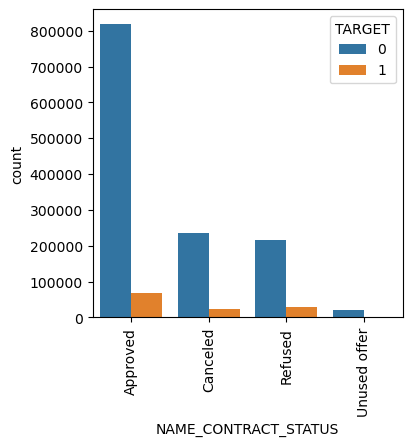

In [135]:
#let's see the count plot to analyse the NAME_CONTRACT_STATUS with TARGET.
print("Countplot of NAME_CONTRACT_STATUS")
plt.figure(figsize=(4,4))
sns.countplot(x=df_mergedData['NAME_CONTRACT_STATUS'],hue='TARGET',data=df_mergedData)
plt.xticks(rotation=90)
plt.show()

%age of approved loans with default cases
0    0.924113
1    0.075887
Name: TARGET, dtype: float64


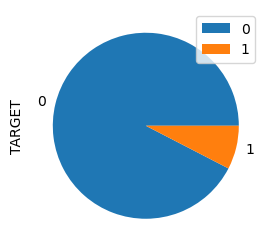

In [136]:
#lets see the % of approved with payment difficulty
print('%age of approved loans with default cases')
print(df_mergedData[(df_mergedData['NAME_CONTRACT_STATUS']=='Approved')].TARGET.value_counts(normalize=True))
plt.figure(figsize=(3,4))
df_mergedData[(df_mergedData['NAME_CONTRACT_STATUS']=='Approved')].TARGET.value_counts(normalize=True).plot.pie()
plt.legend()
plt.show()

%age of approved loans with default cases
0    0.880036
1    0.119964
Name: TARGET, dtype: float64


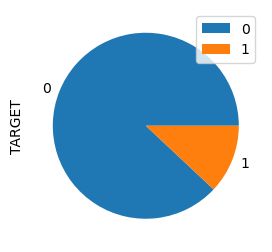

In [137]:
print('%age of approved loans with default cases')
print(df_mergedData[(df_mergedData['NAME_CONTRACT_STATUS']=='Refused')].TARGET.value_counts(normalize=True))
plt.figure(figsize=(3,4))
df_mergedData[(df_mergedData['NAME_CONTRACT_STATUS']=='Refused')].TARGET.value_counts(normalize=True).plot.pie()
plt.legend()
plt.show()

### Insight
1. There are around 8% of default cases in approved loans. This is a loss to banks 
2. 88% of the refused applicant were able to pay the loans. Only 22% could be the default case.
   This is also considered as loss for banks.

Countplot of CODE_GENDER


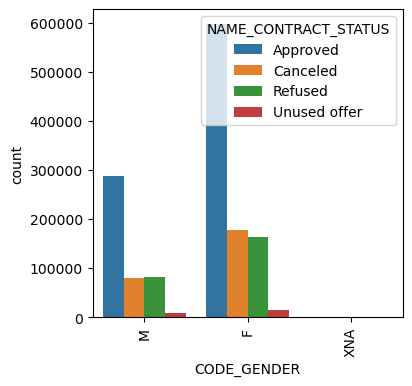

In [138]:
#let's see the count plot to analyse the CODE_GENDER with NAME_CONTRACT_STATUS.
print("Countplot of CODE_GENDER")
plt.figure(figsize=(4,4))
sns.countplot(x=df_mergedData['CODE_GENDER'],hue='NAME_CONTRACT_STATUS',data=df_mergedData)
plt.xticks(rotation=90)
plt.show()

### Insight
Males are more likely to be default cases. More females got approved loans as well.

Countplot of TOTAL_INCOME


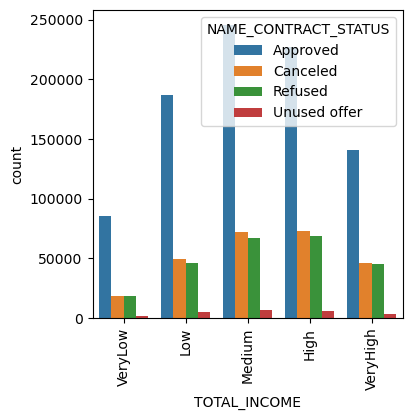

In [139]:
#let's see the count plot to analyse the CODE_GENDER with NAME_CONTRACT_STATUS.
print("Countplot of TOTAL_INCOME")
plt.figure(figsize=(4,4))
sns.countplot(x=df_mergedData['TOTAL_INCOME'],hue='NAME_CONTRACT_STATUS',data=df_mergedData)
plt.xticks(rotation=90)
plt.show()

### Insight
High and Medium salaried people get the most of the approved loans.And they have more number of payment difficulty as well.

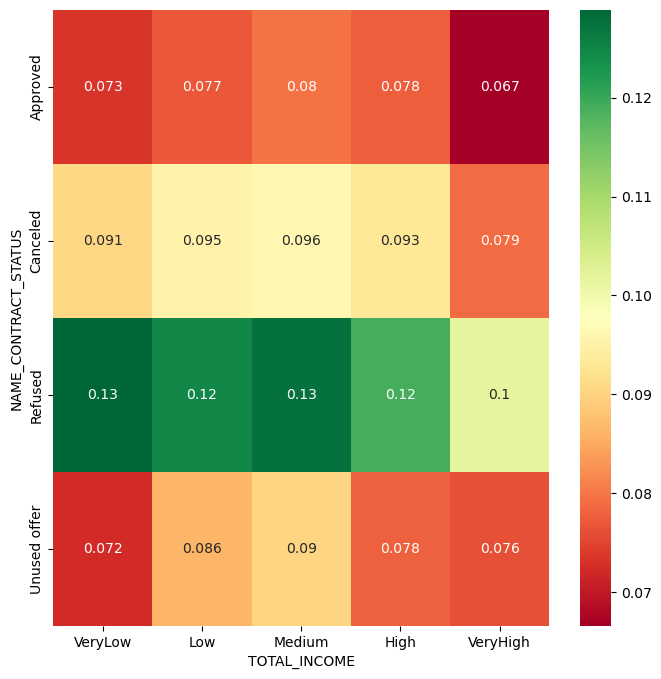

In [140]:
result=pd.pivot_table(data=df_mergedData,index="NAME_CONTRACT_STATUS",columns="TOTAL_INCOME",values='TARGET')
plt.figure(figsize=(8,8))
sns.heatmap(result, annot=True,cmap='RdYlGn')
plt.show()

Refused status are uniform in all the categories of total income.

### Conclusion
1. Deriving variables for default cases
2. Males are more likely to be default cases. 
3. EXT_SOURCE_2 less score shows more default cases.
4. Credit amount has strong relation with annuity amount, goods price. Higher amount may lead to higher loss as well.
5. High and Medium salaried people get the most of the approved loans. High salary applicant is more risky than medium salaried applicant.
6. Applicants who came unaccompanied during loan registration are more reliable.
7. Applicants who have car/own house are paying loans with difficulty
8. Applicant with different permanent address and work address have high density for default.
9. Revolving loans are risky.

 